## Bike rental prediction using Machine Learning and exploring the explainability of the model

In [1]:
!sudo apt-get update

Get:1 http://packages.cloud.google.com/apt gcsfuse-focal InRelease [5002 B]
Get:2 https://packages.cloud.google.com/apt cloud-sdk InRelease [6361 B]
Hit:3 http://archive.ubuntu.com/ubuntu focal InRelease
Get:4 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:5 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Get:6 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Get:7 http://packages.cloud.google.com/apt gcsfuse-focal/main amd64 Packages [2084 B]
Get:8 https://packages.cloud.google.com/apt cloud-sdk/main amd64 Packages [412 kB]
Get:9 http://security.ubuntu.com/ubuntu focal-security/multiverse amd64 Packages [28.5 kB]
Get:10 http://security.ubuntu.com/ubuntu focal-security/restricted amd64 Packages [2003 kB]
Get:11 http://archive.ubuntu.com/ubuntu focal-updates/restricted amd64 Packages [2141 kB]
Get:12 http://security.ubuntu.com/ubuntu focal-security/universe amd64 Packages [1019 kB]
Get:13 http://security.ubuntu.com/ubuntu foc

In [2]:
# Installing java
!sudo apt-get install openjdk-8-jdk-headless -qq > /dev/null

### Installing and Loading the H2O package

In [3]:
%pip install h2o

Note: you may need to restart the kernel to use updated packages.


In [4]:
import h2o
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.17" 2022-10-18; OpenJDK Runtime Environment (build 11.0.17+8-post-Ubuntu-1ubuntu220.04); OpenJDK 64-Bit Server VM (build 11.0.17+8-post-Ubuntu-1ubuntu220.04, mixed mode, sharing)
  Starting server from /opt/conda/lib/python3.7/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp8xq4hclj
  JVM stdout: /tmp/tmp8xq4hclj/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp8xq4hclj/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.1
H2O_cluster_version_age:,1 month and 17 days
H2O_cluster_name:,H2O_from_python_unknownUser_oq7550
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,7.500 Gb
H2O_cluster_total_cores:,4
H2O_cluster_allowed_cores:,4
H2O_cluster_status:,"locked, healthy"


### Loading the dataset

In [5]:
import urllib.request
import zipfile

# Specifying the URL of the zip file
zip_url = "http://archive.ics.uci.edu/ml/machine-learning-databases/00275/Bike-Sharing-Dataset.zip"

# Specifying the name of the CSV file to extract
day_csv = "day.csv"
hour_csv = "hour.csv"

# Downloading the zip file from the internet
urllib.request.urlretrieve(zip_url, "bike_dataset.zip")

# Opening the zip file
with zipfile.ZipFile("bike_dataset.zip", "r") as zip_file:
    
    # Extracting the CSV files from the zip file
    zip_file.extract(day_csv)
    zip_file.extract(hour_csv)

In [6]:
# Reading data
bike_day_data = h2o.import_file(day_csv)
bike_hour_data = h2o.import_file(hour_csv)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


### Preprocessing the data

The columns 'instant', 'dteday', 'casual', and 'registered' contain information that is not relevant for building the models and making the plots for this analysis.
<ul>
<li>'instant' is an index column that assigns a unique number to each row, which is not useful for modeling or making plots.</li>
<li>'dteday' is a column that contains the date in a specific format, which is not useful for modeling or making plots because the models can't understand dates in this format.</li>
<li>'casual' and 'registered' are columns that contain information about the number of casual and registered users who rented the bikes on a given day. While these columns could be useful for certain types of analysis, they are not relevant for predicting the total number of rentals (cnt) and building models to predict that quantity.</li>
</ul>
Therefore, we can remove these columns from the dataset.

In [7]:
bike_day_data = bike_day_data.drop(['instant', 'dteday', 'casual', 'registered'], axis=1)
bike_hour_data = bike_hour_data.drop(['instant', 'dteday', 'casual', 'registered'], axis=1)

In [8]:
# Reponse column
y = 'cnt'

# Split dataset into train & test data
train_day, test_day = bike_day_data.split_frame(ratios = [0.8], seed = 1)
train_hour, test_hour = bike_hour_data.split_frame(ratios = [0.8], seed = 1)

### Building the models
### 1. For Day dataset
#### Using H2O AutoML to build a model and also a Gradient Boosting Machine (GBM) model for the Day dataset

In [9]:
# AutoML
from h2o.automl import H2OAutoML

# Run AutoML for 1 minute
aml_d = H2OAutoML(max_models=10, seed=1, max_runtime_secs=60)
aml_d.train(y=y, training_frame=train_day)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/5
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),1/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_1_AutoML_1_20230326_125539,704.43,496221,477.742,0.225125,496221,809,0.195616,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20230326_125539,706.216,498741,472.633,0.227797,498741,776,0.1672,StackedEnsemble
GBM_2_AutoML_1_20230326_125539,714.263,510172,497.58,0.231929,510172,446,0.037859,GBM
GBM_3_AutoML_1_20230326_125539,714.797,510935,489.404,0.235226,510935,447,0.03621,GBM
DRF_1_AutoML_1_20230326_125539,720.253,518764,502.845,0.250184,518764,482,0.02661,DRF
GBM_4_AutoML_1_20230326_125539,727.166,528771,507.249,0.231949,528771,382,0.05002,GBM
XGBoost_3_AutoML_1_20230326_125539,766.502,587526,548.003,0.233468,587526,202,0.047933,XGBoost
XGBoost_1_AutoML_1_20230326_125539,776.069,602282,528.837,0.229284,602282,429,0.012077,XGBoost
GBM_1_AutoML_1_20230326_125539,777.737,604874,558.186,0.257237,604874,477,0.030936,GBM
XGBoost_2_AutoML_1_20230326_125539,780.492,609168,534.99,0.254557,609168,376,0.014854,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

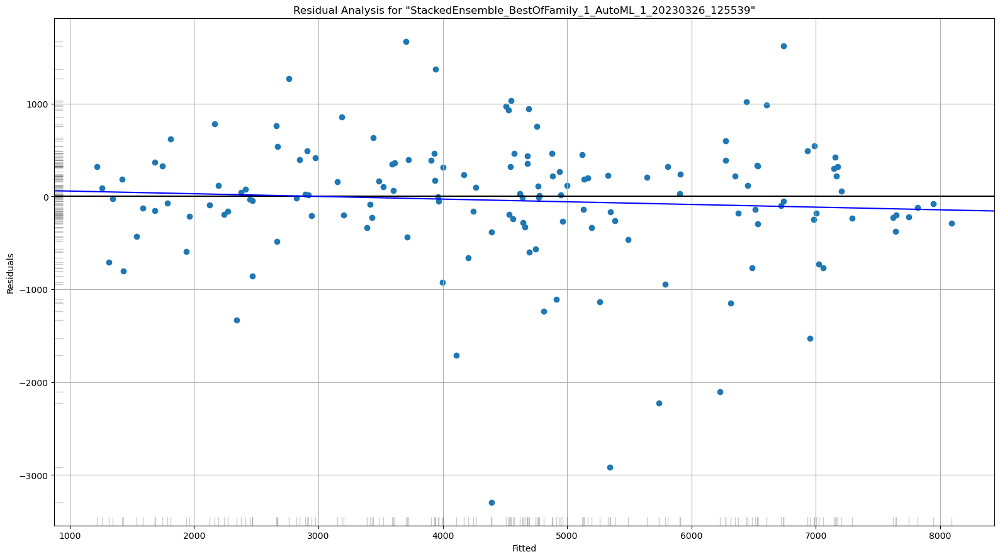

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

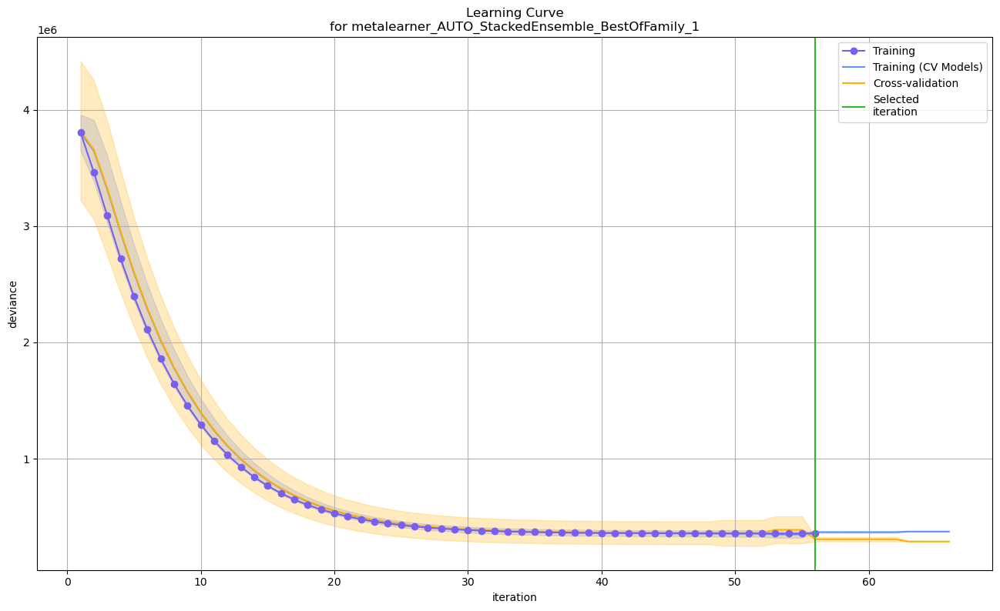

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

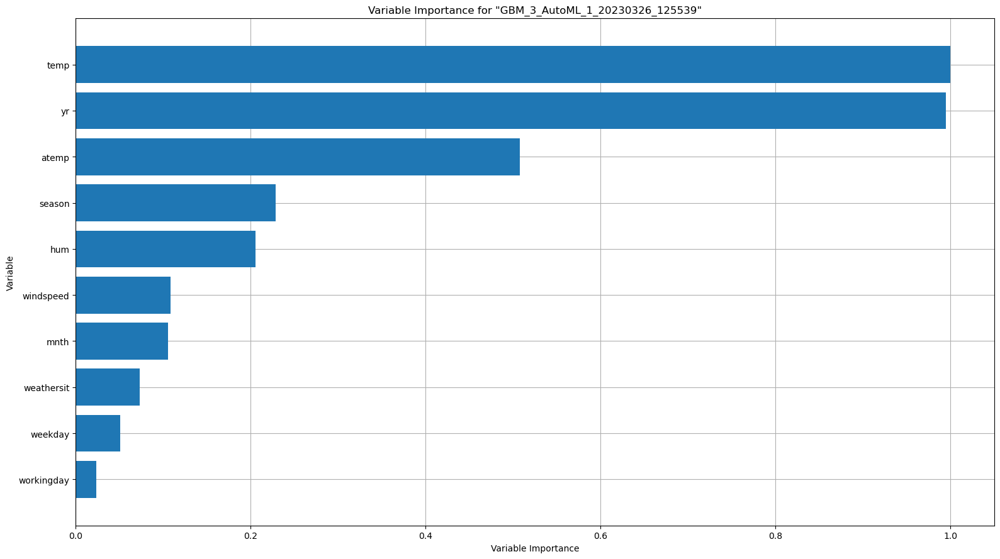

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

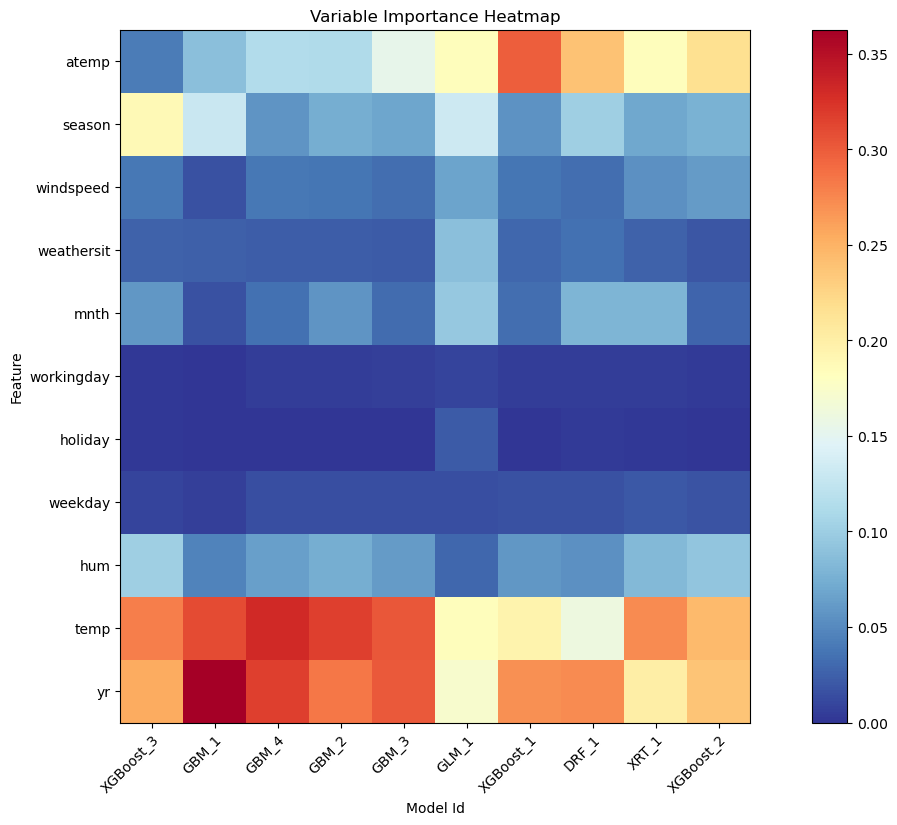

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

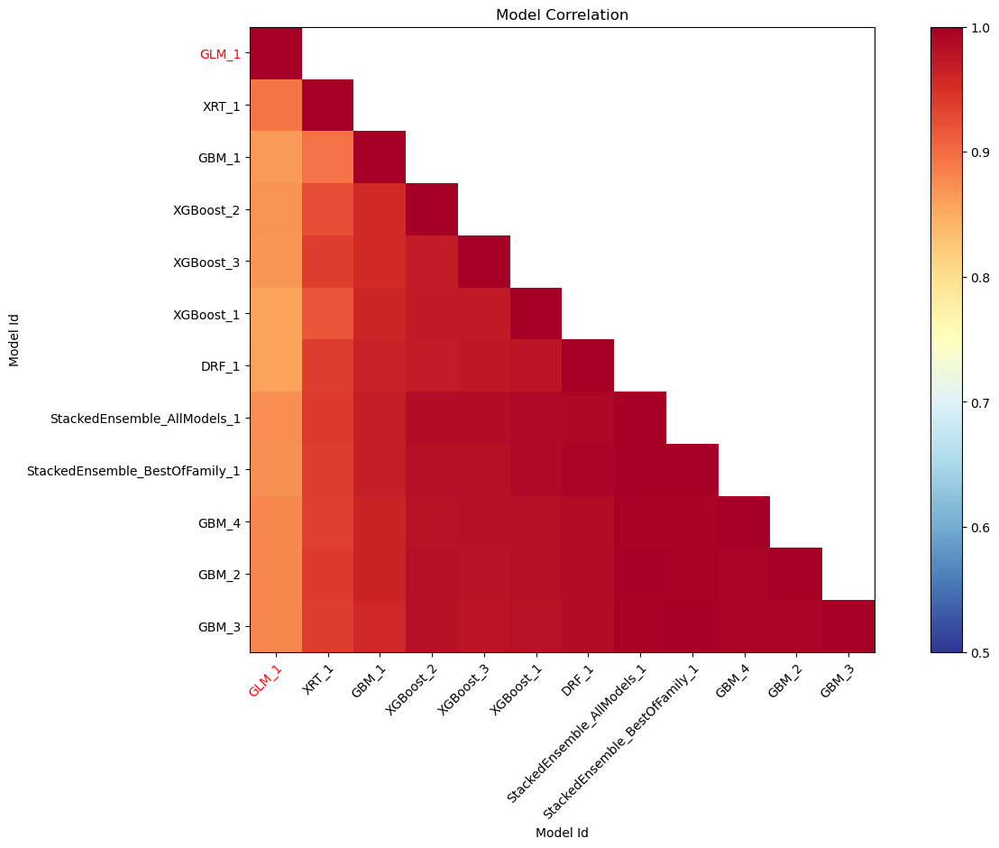

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

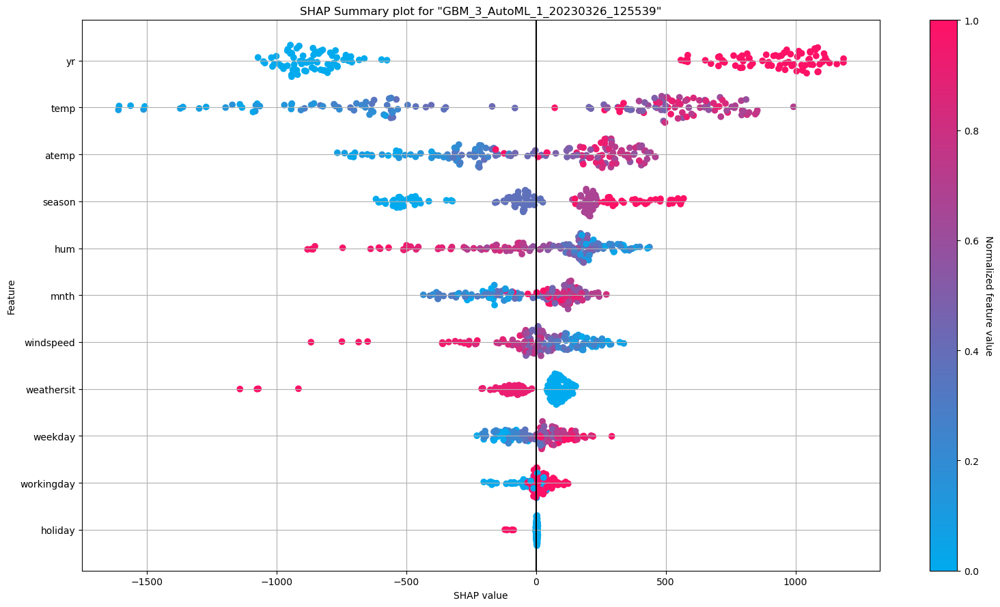

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

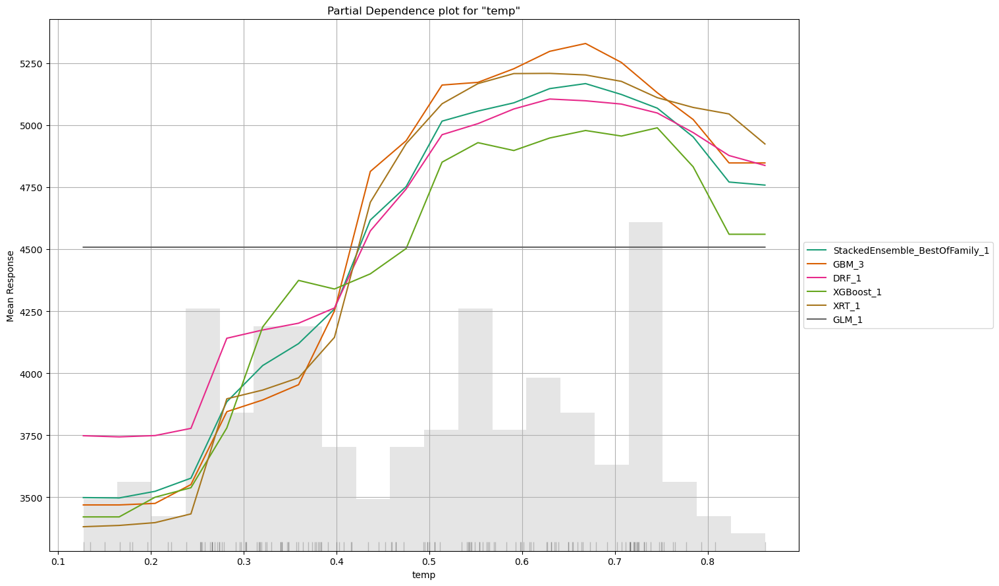

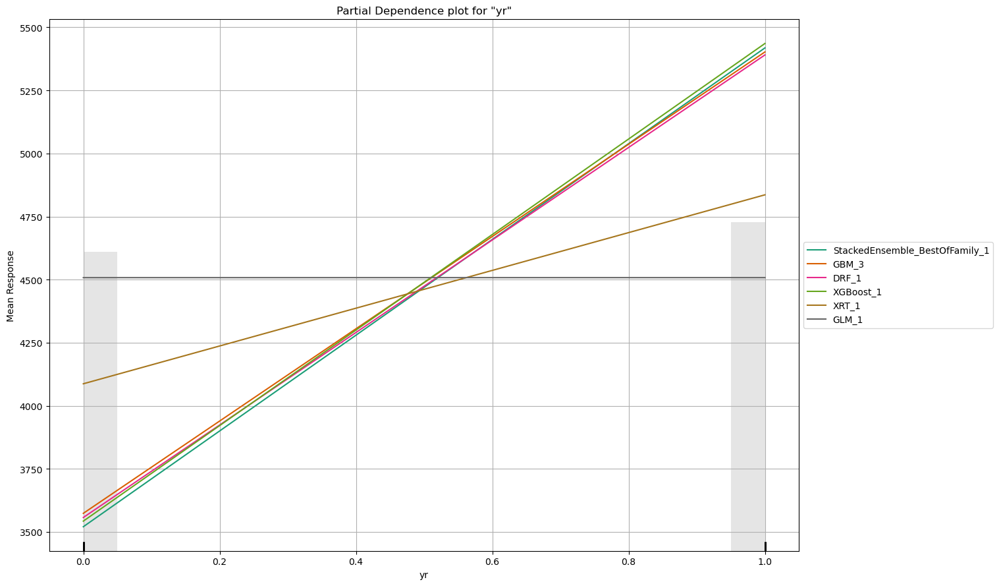

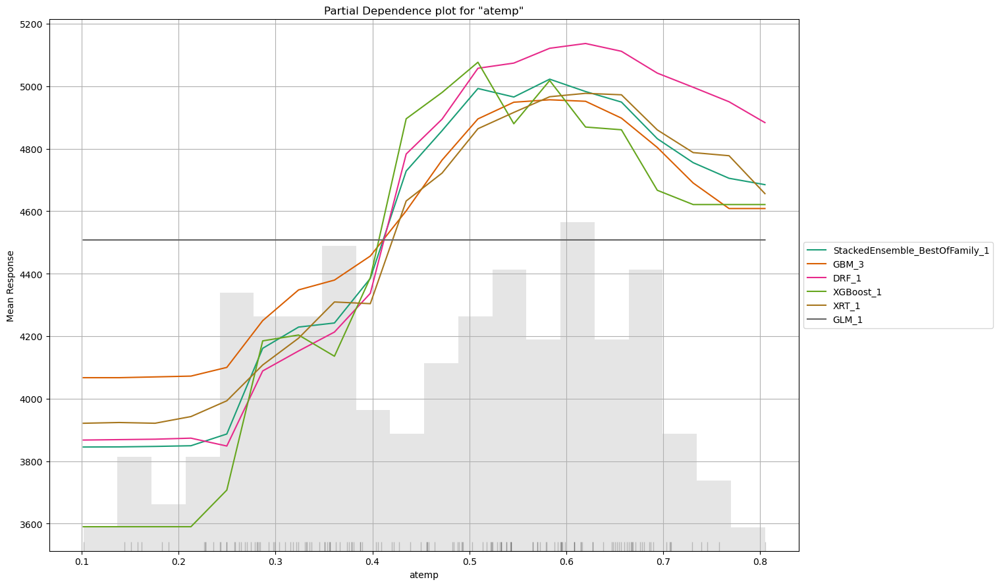

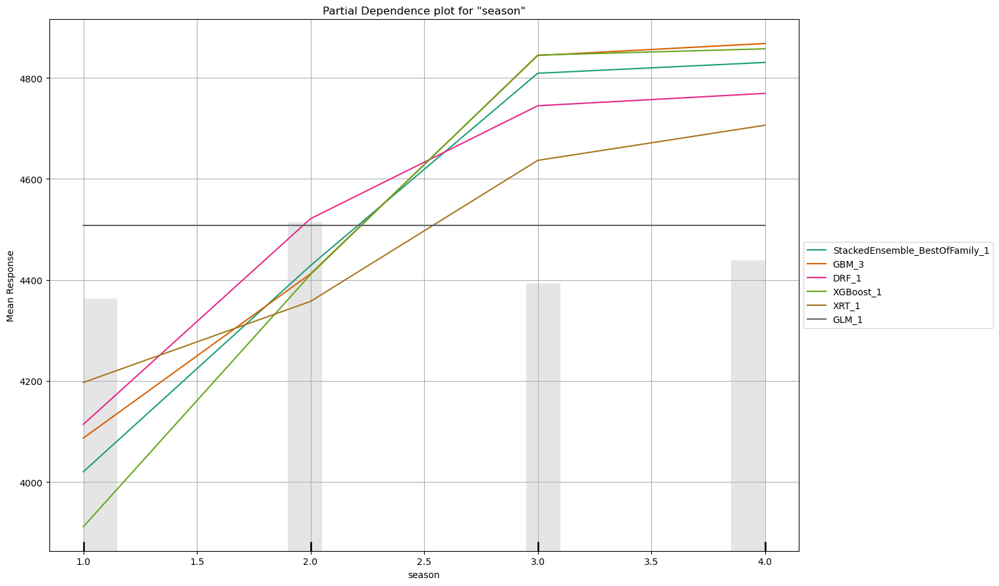

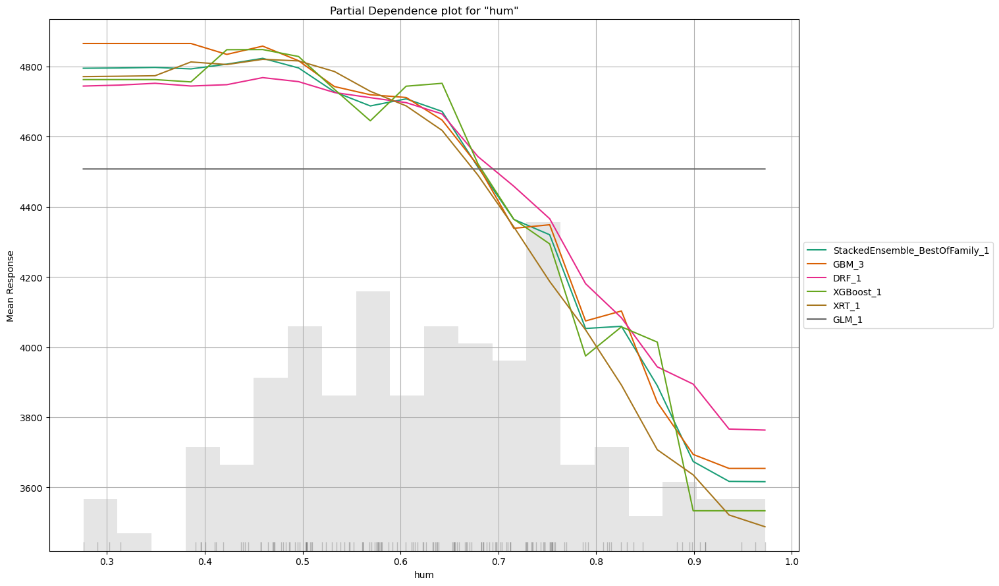

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

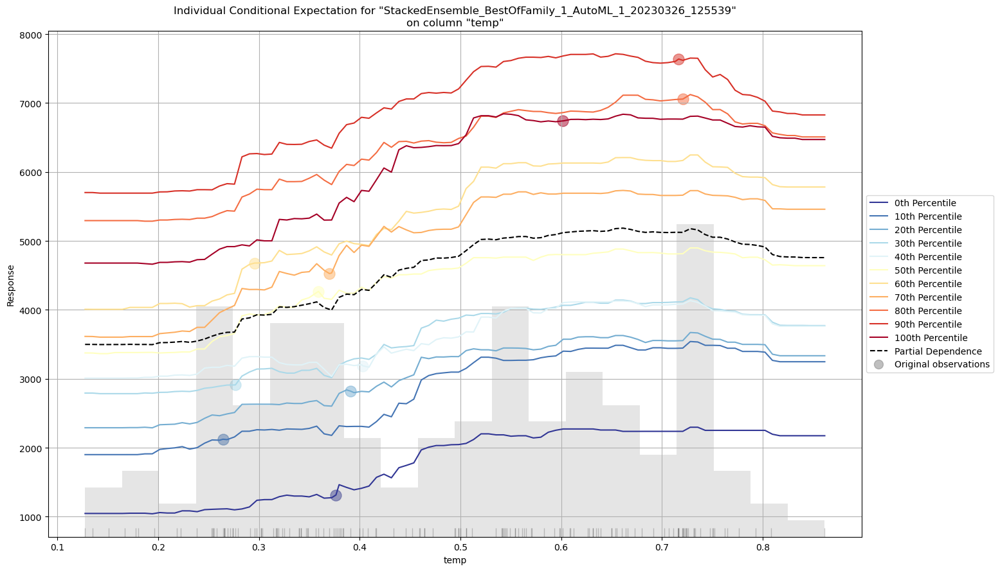

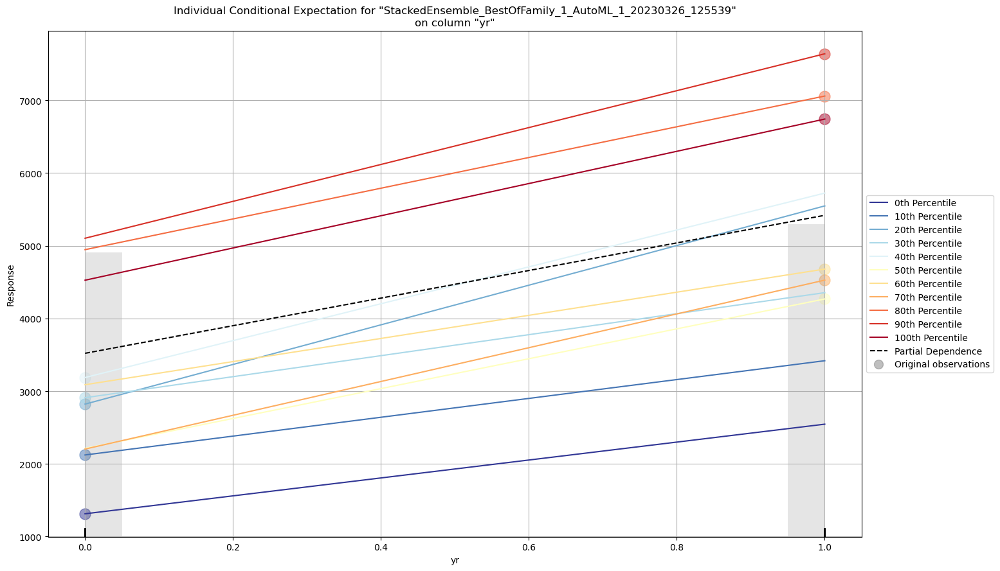

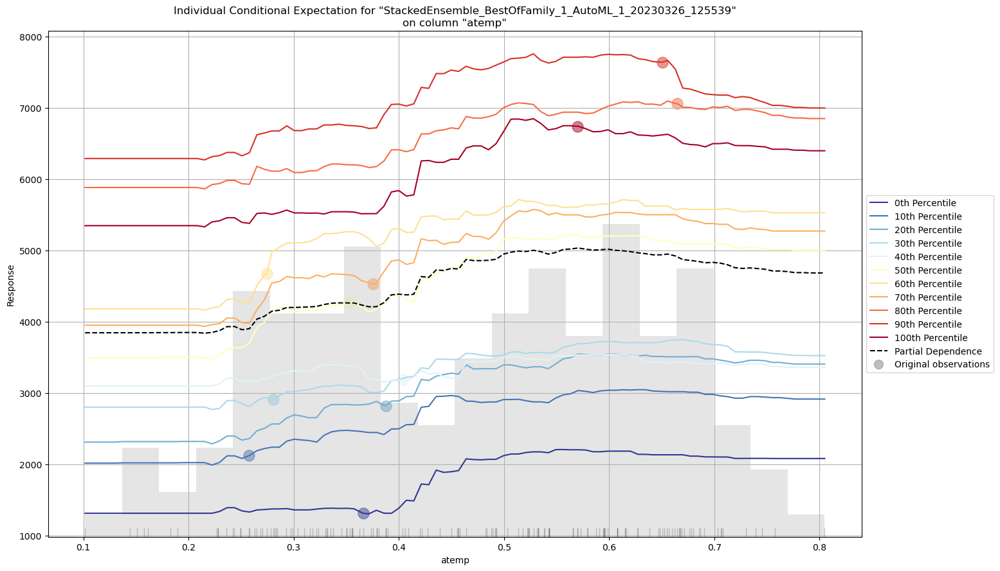

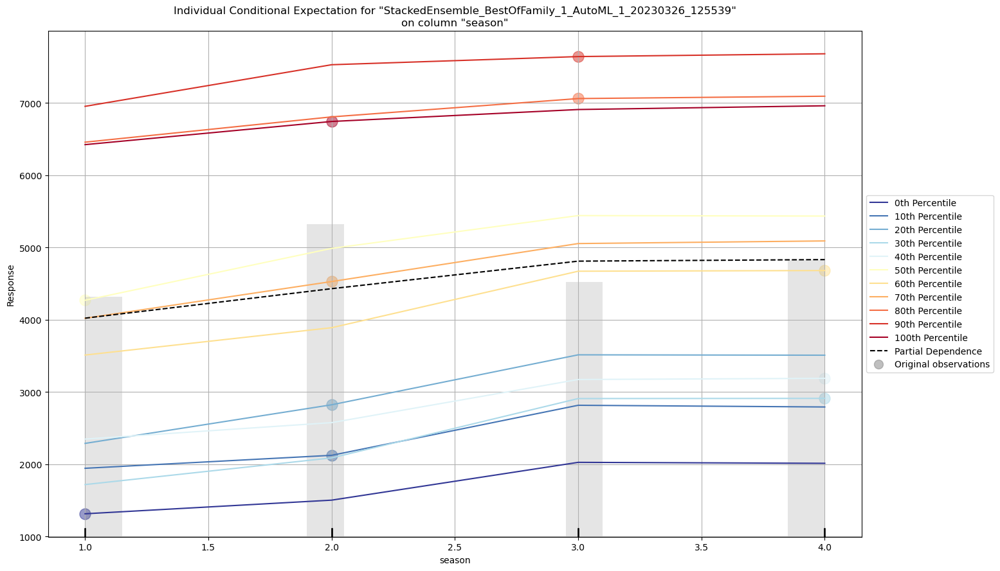

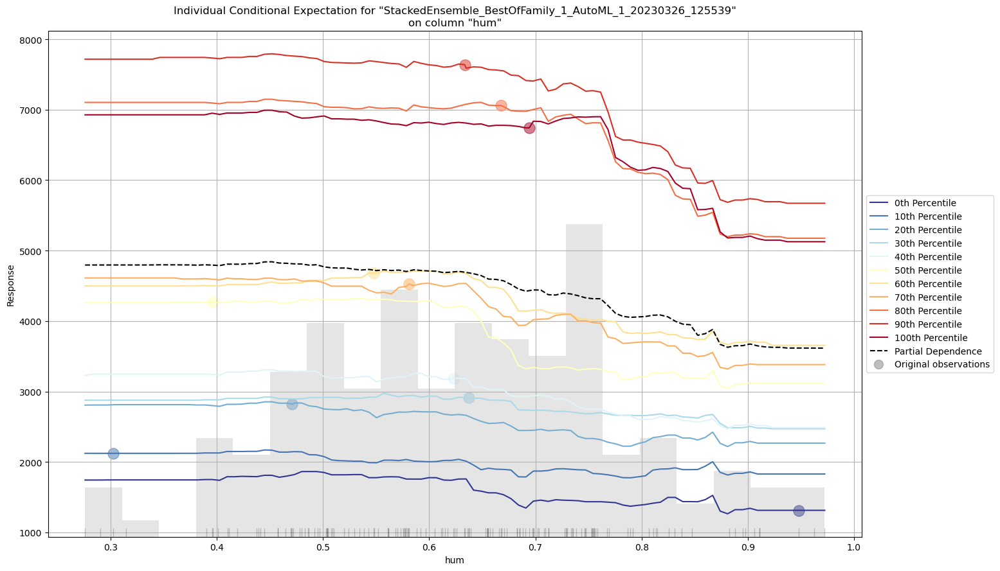

In [10]:
# Explain leader model & compare with all AutoML models
exa_d = aml_d.explain(test_day)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

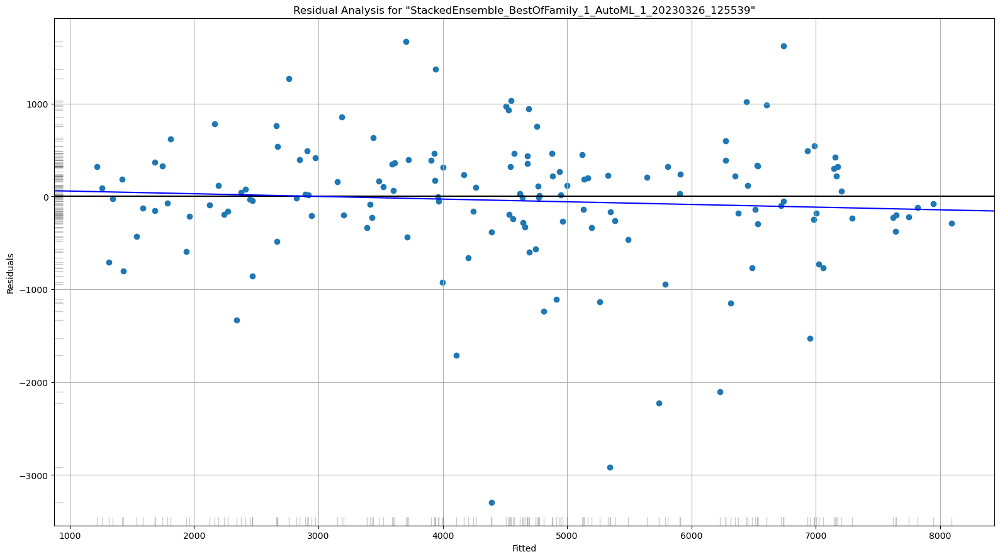

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

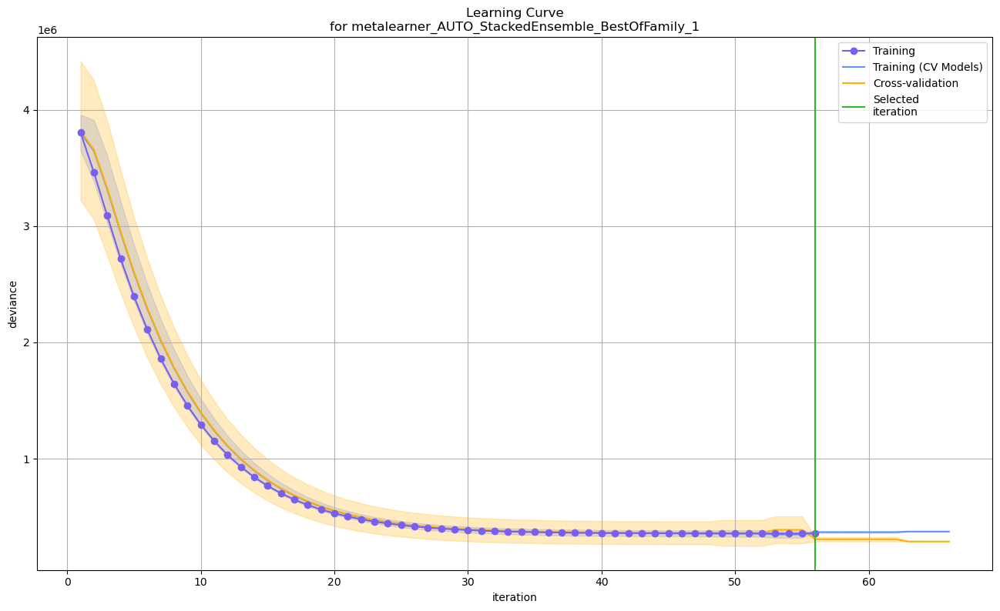

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

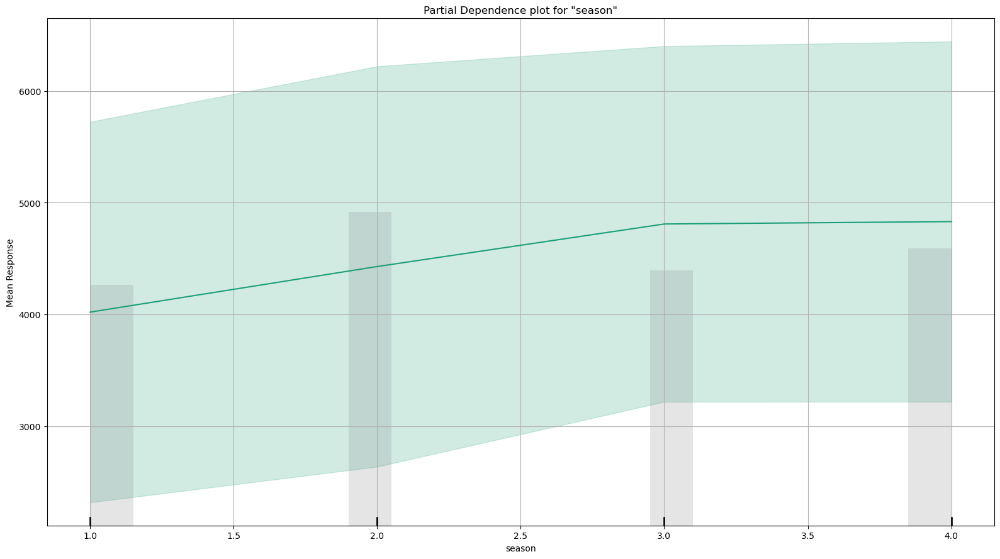

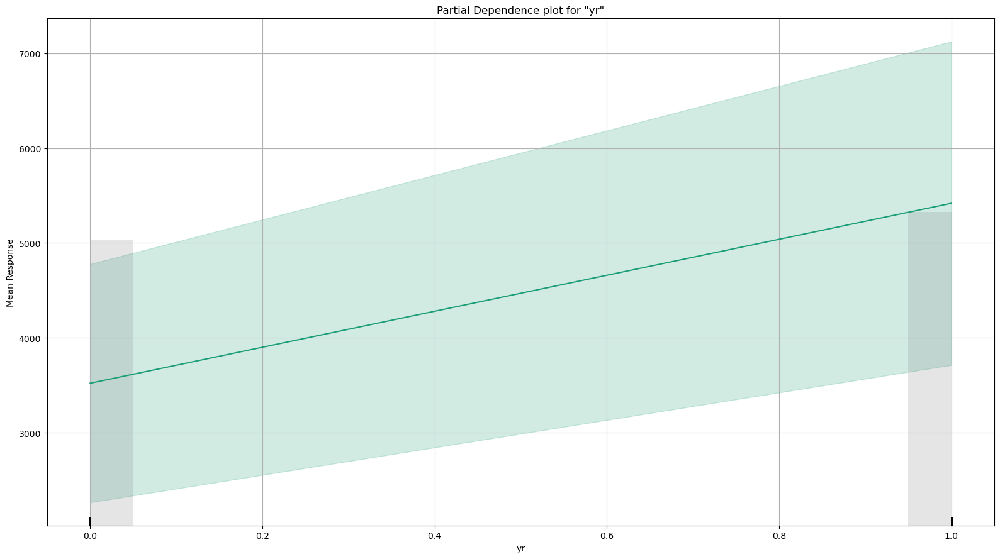

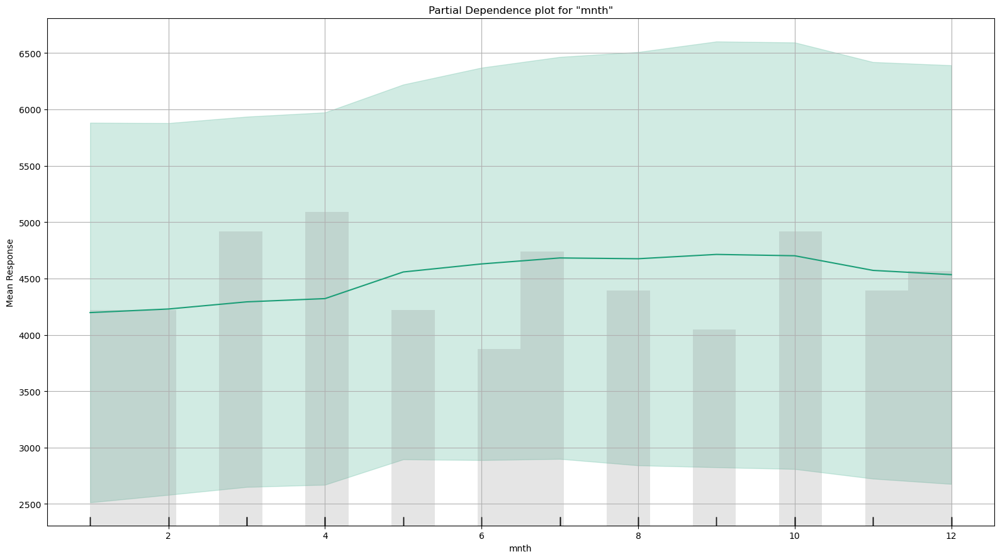

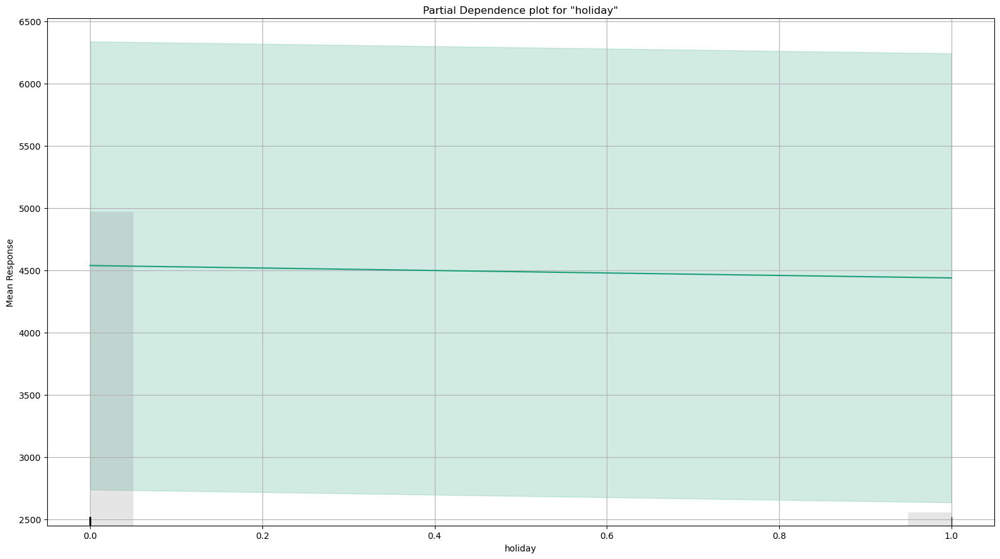

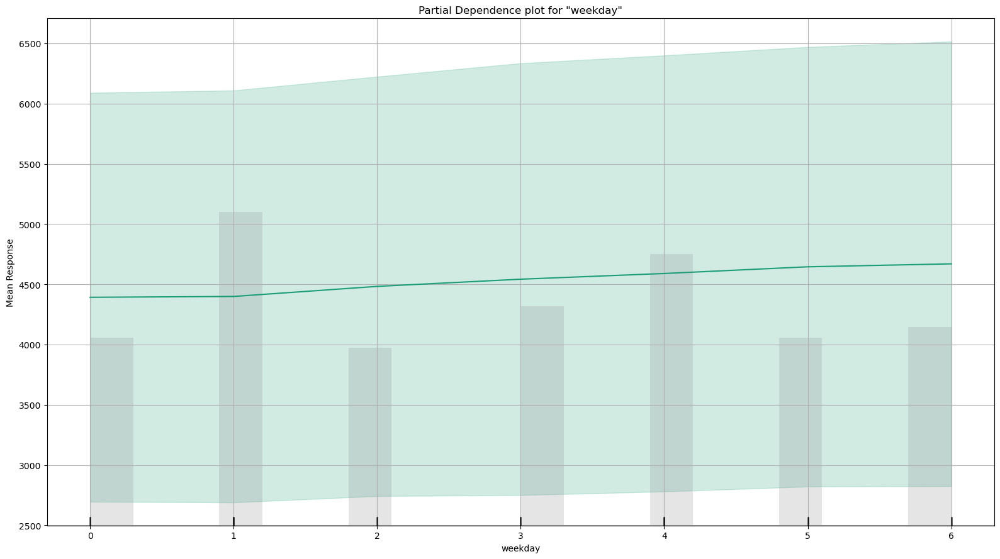

...

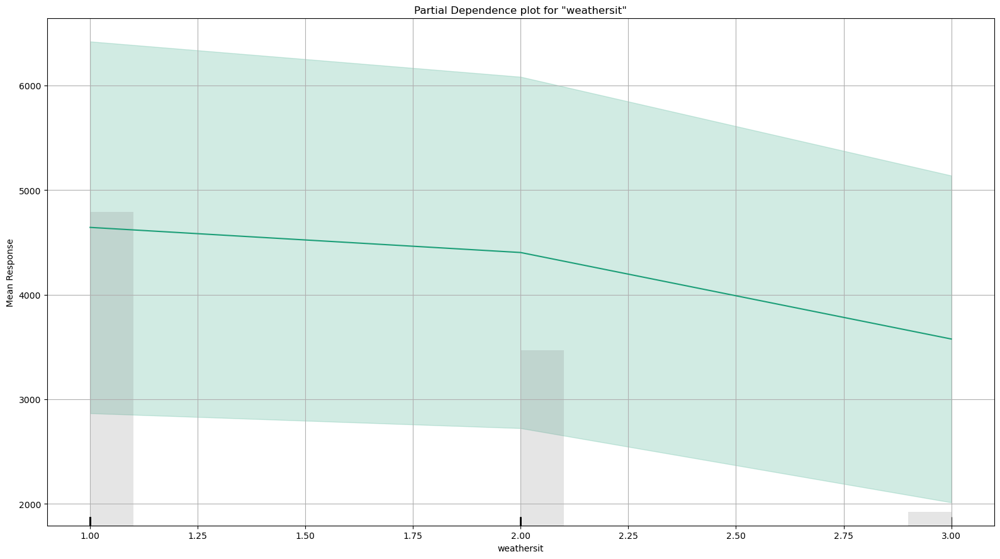

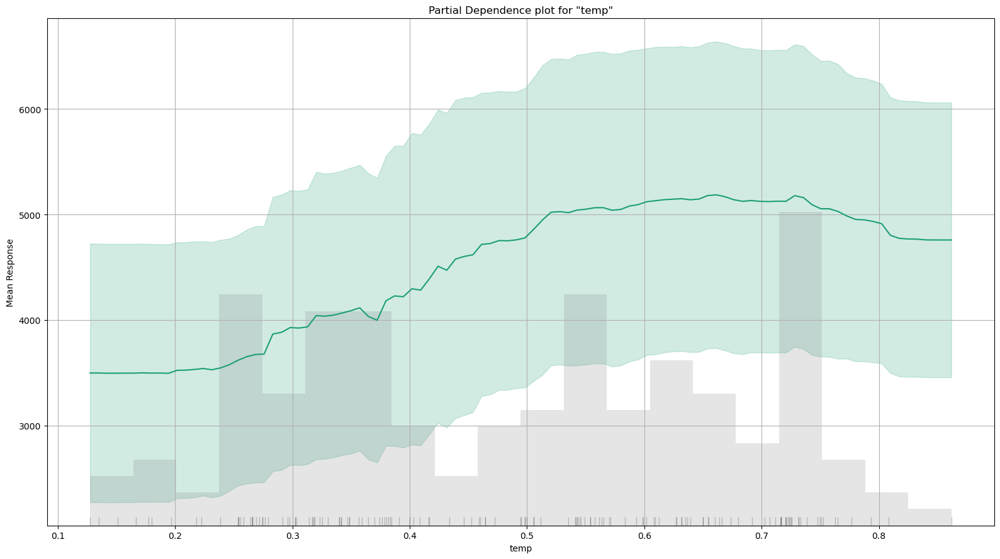

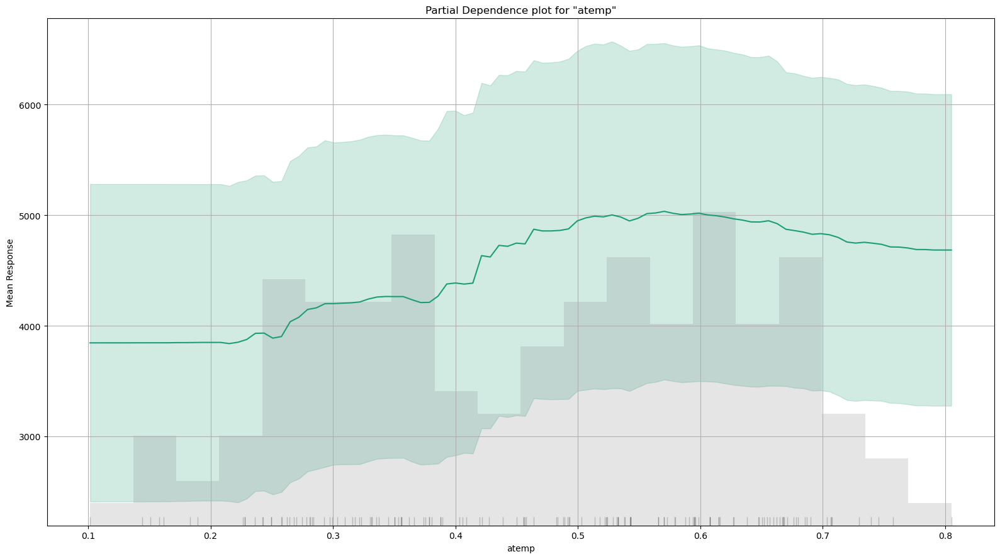

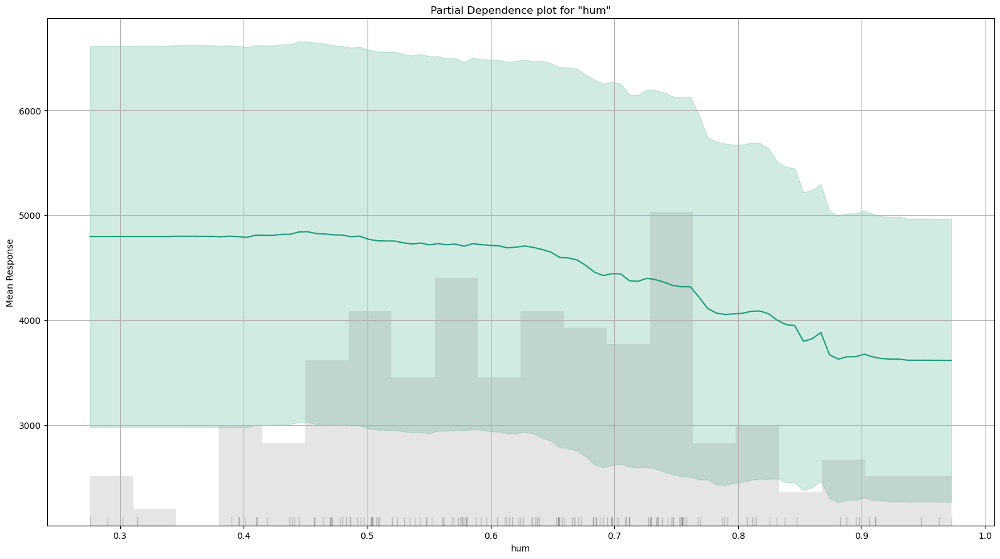

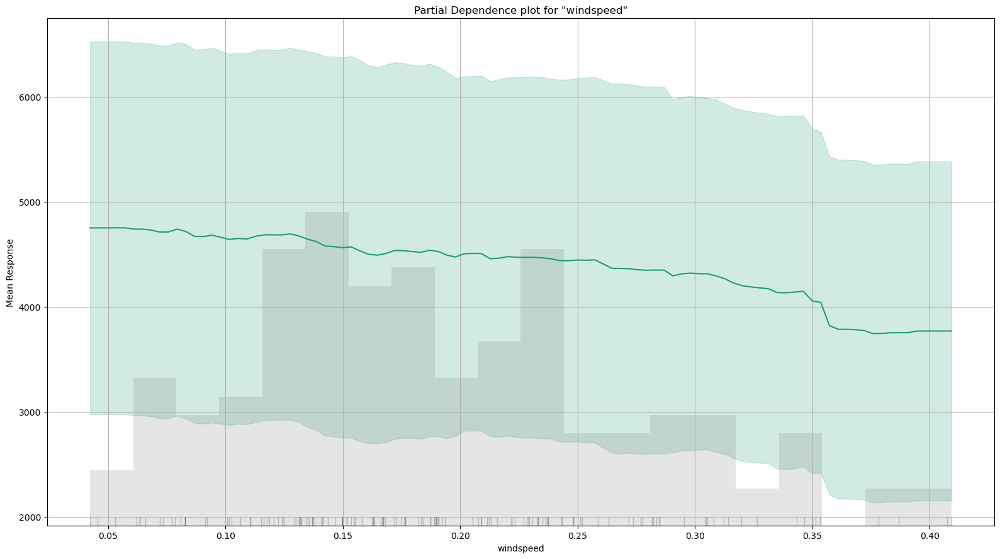

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

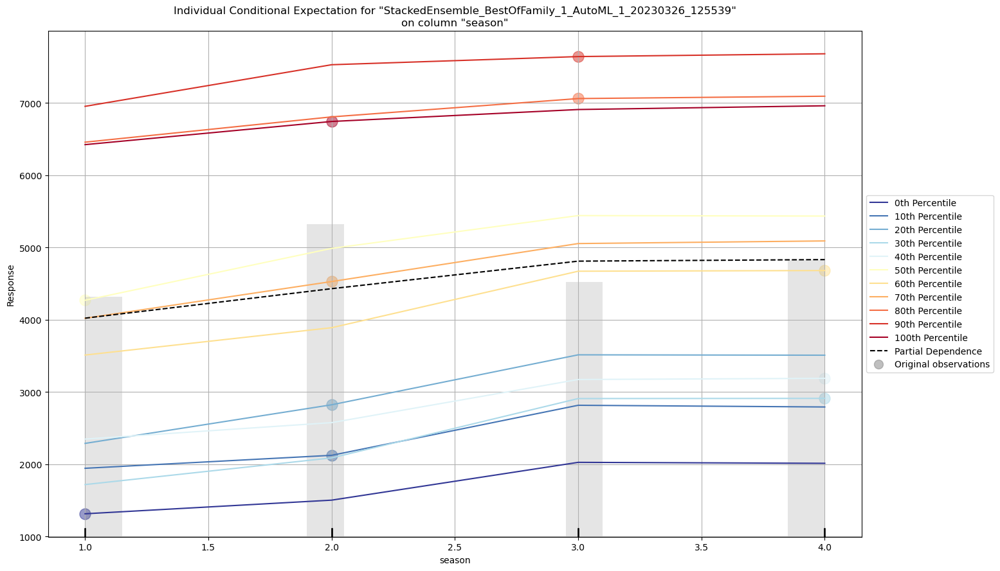

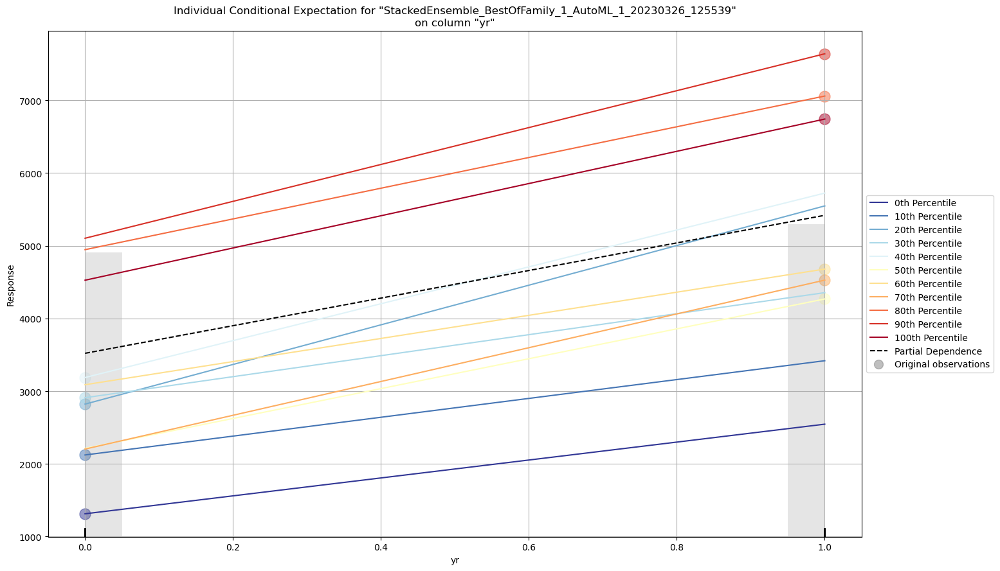

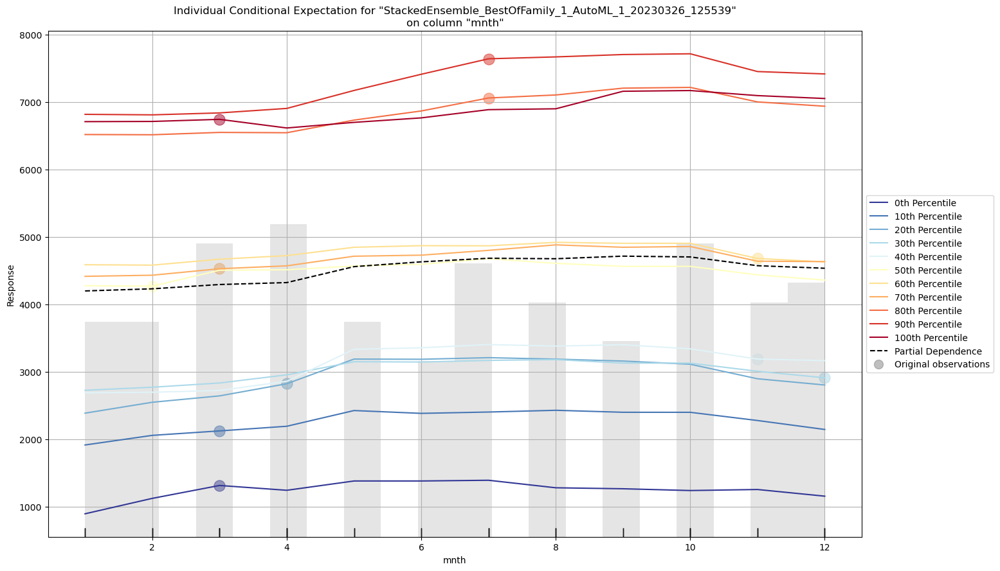

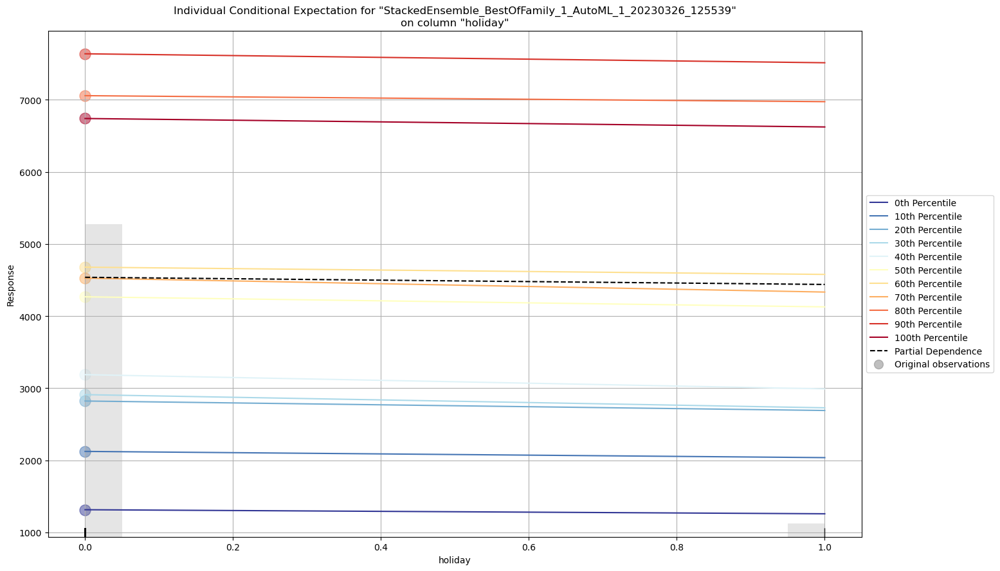

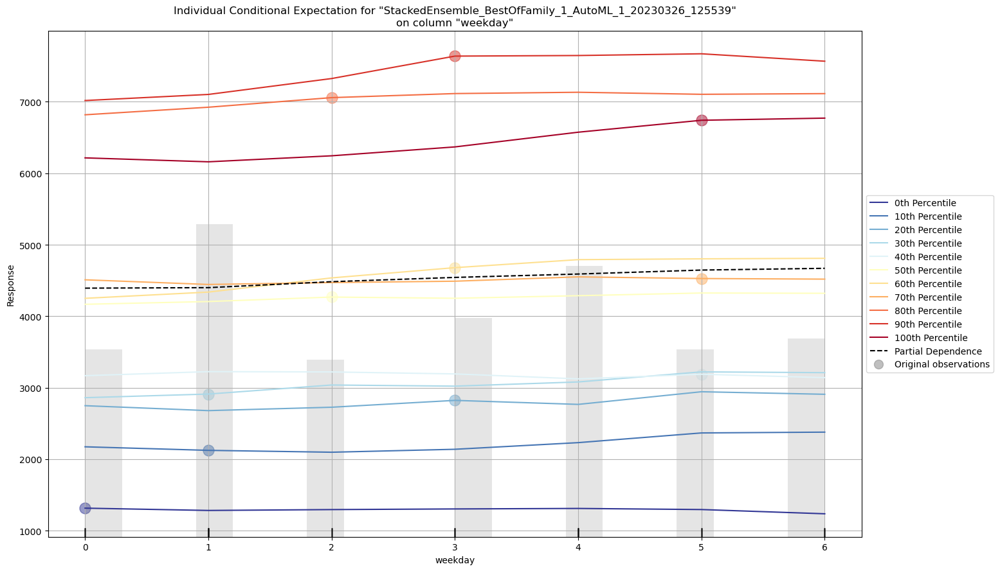

...

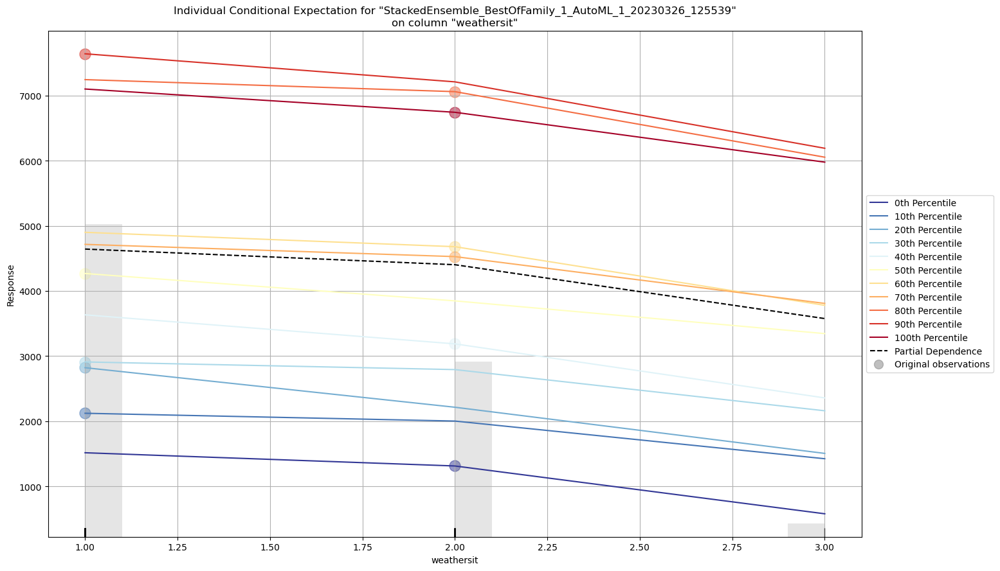

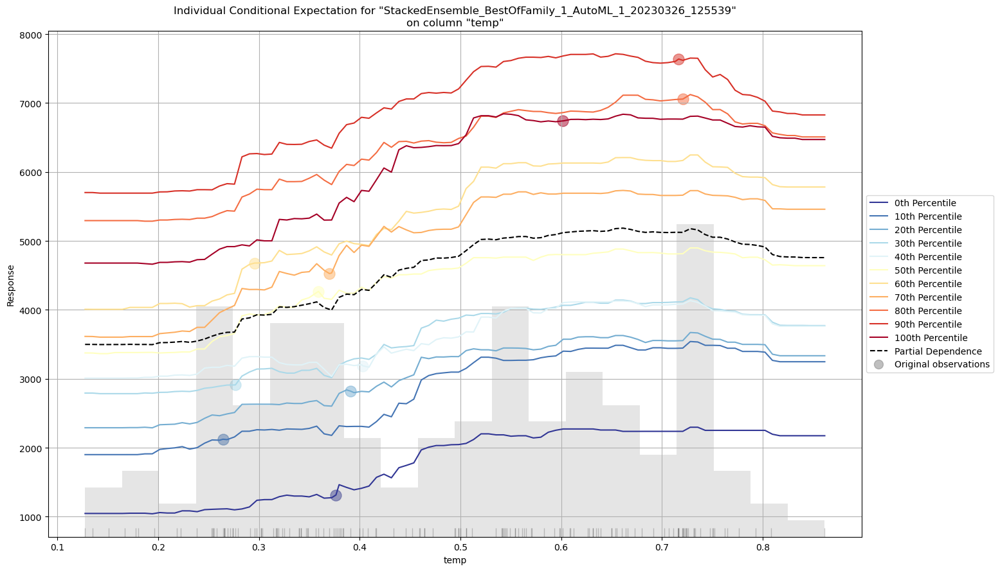

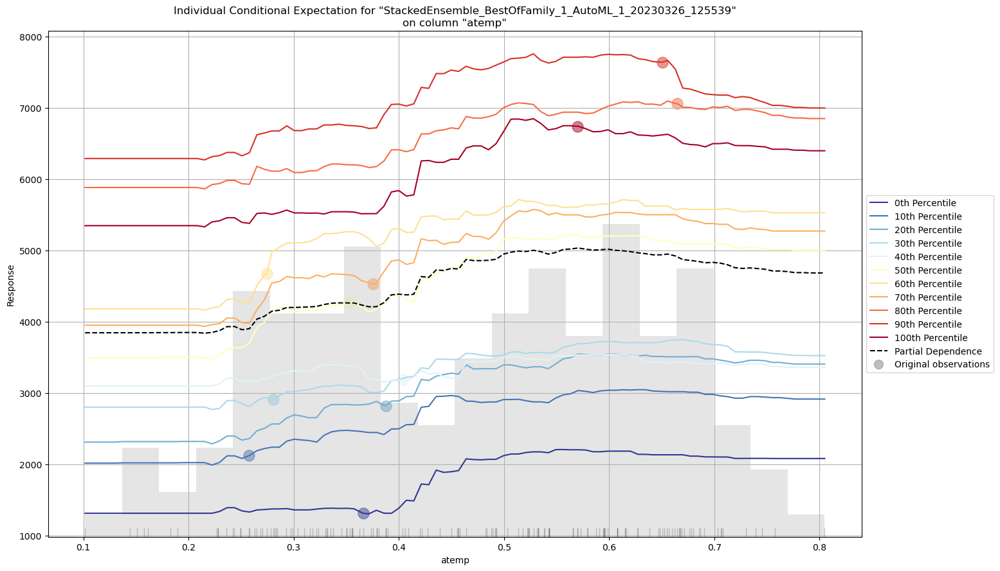

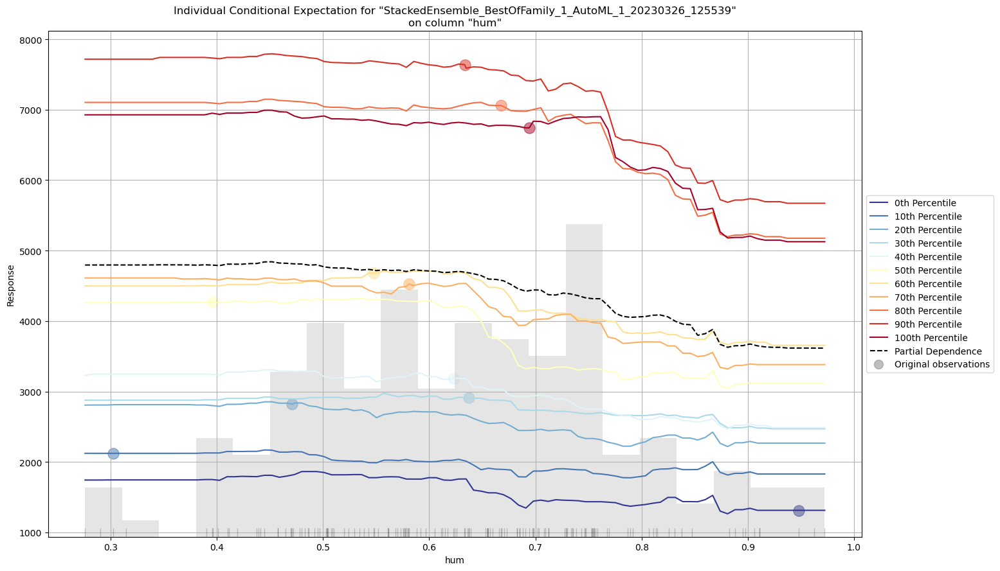

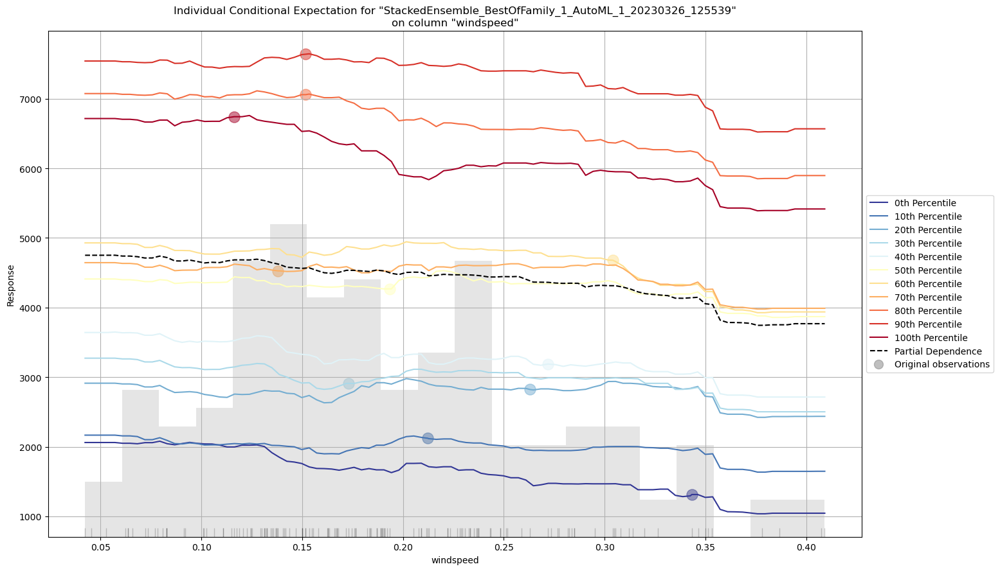

In [11]:
# Explain a single H2O model (e.g. leader model from AutoML)
exm_d = aml_d.leader.explain(test_day)

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_1_AutoML_1_20230326_125539,704.43,496221,477.742,0.225125,496221,809,0.195616,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20230326_125539,706.216,498741,472.633,0.227797,498741,776,0.1672,StackedEnsemble
GBM_2_AutoML_1_20230326_125539,714.263,510172,497.58,0.231929,510172,446,0.037859,GBM
GBM_3_AutoML_1_20230326_125539,714.797,510935,489.404,0.235226,510935,447,0.03621,GBM
DRF_1_AutoML_1_20230326_125539,720.253,518764,502.845,0.250184,518764,482,0.02661,DRF
GBM_4_AutoML_1_20230326_125539,727.166,528771,507.249,0.231949,528771,382,0.05002,GBM
XGBoost_3_AutoML_1_20230326_125539,766.502,587526,548.003,0.233468,587526,202,0.047933,XGBoost
XGBoost_1_AutoML_1_20230326_125539,776.069,602282,528.837,0.229284,602282,429,0.012077,XGBoost
GBM_1_AutoML_1_20230326_125539,777.737,604874,558.186,0.257237,604874,477,0.030936,GBM
XGBoost_2_AutoML_1_20230326_125539,780.492,609168,534.99,0.254557,609168,376,0.014854,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

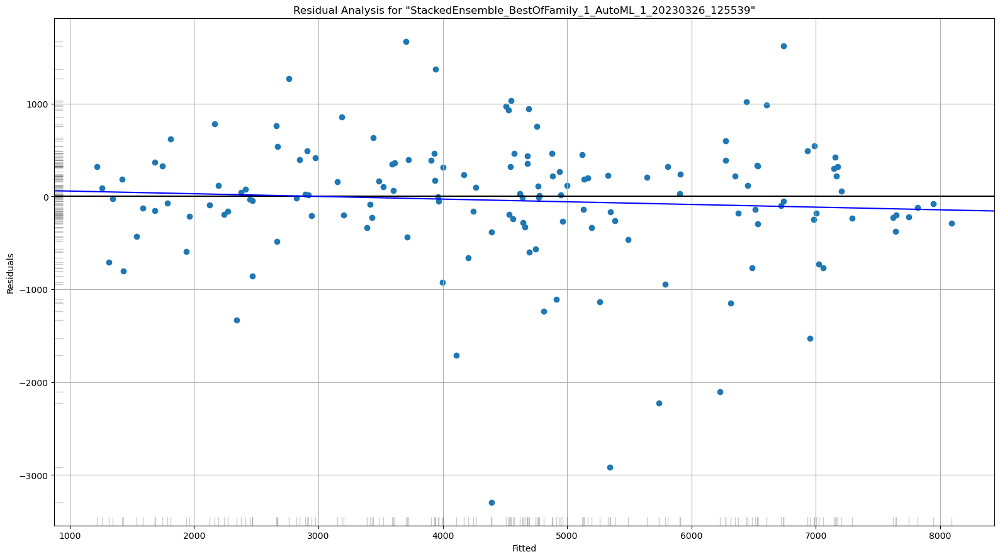

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

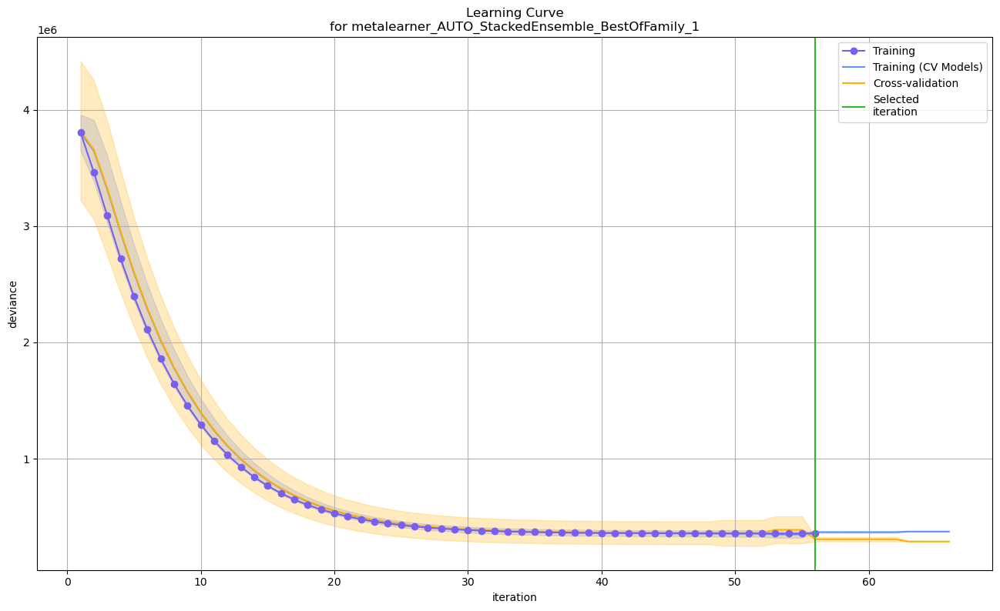

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

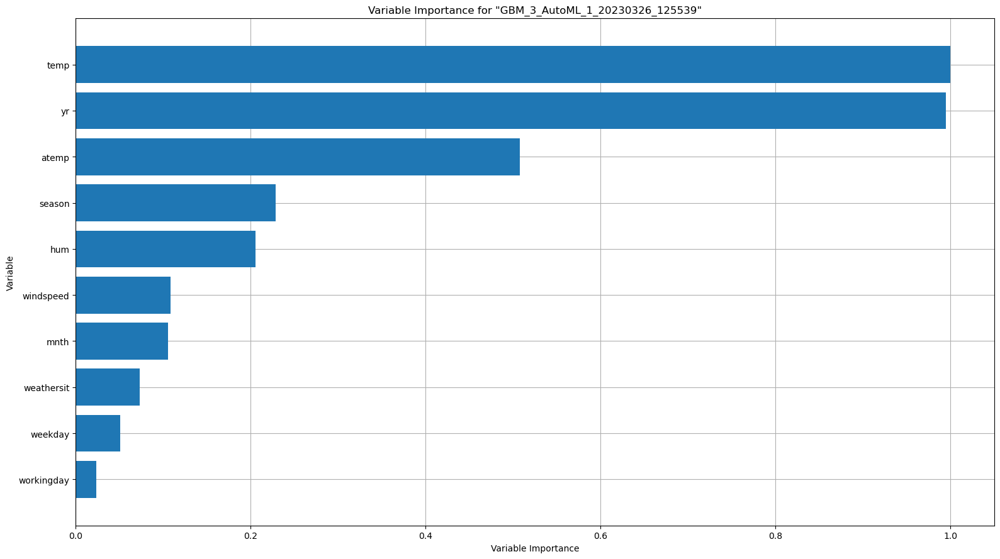

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

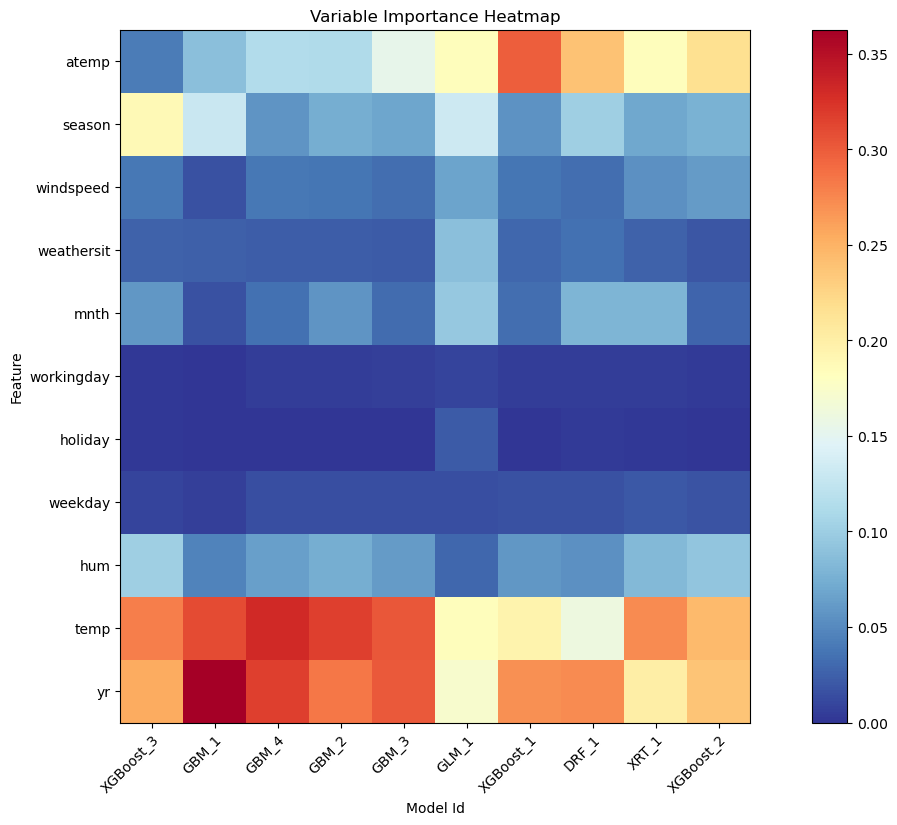

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

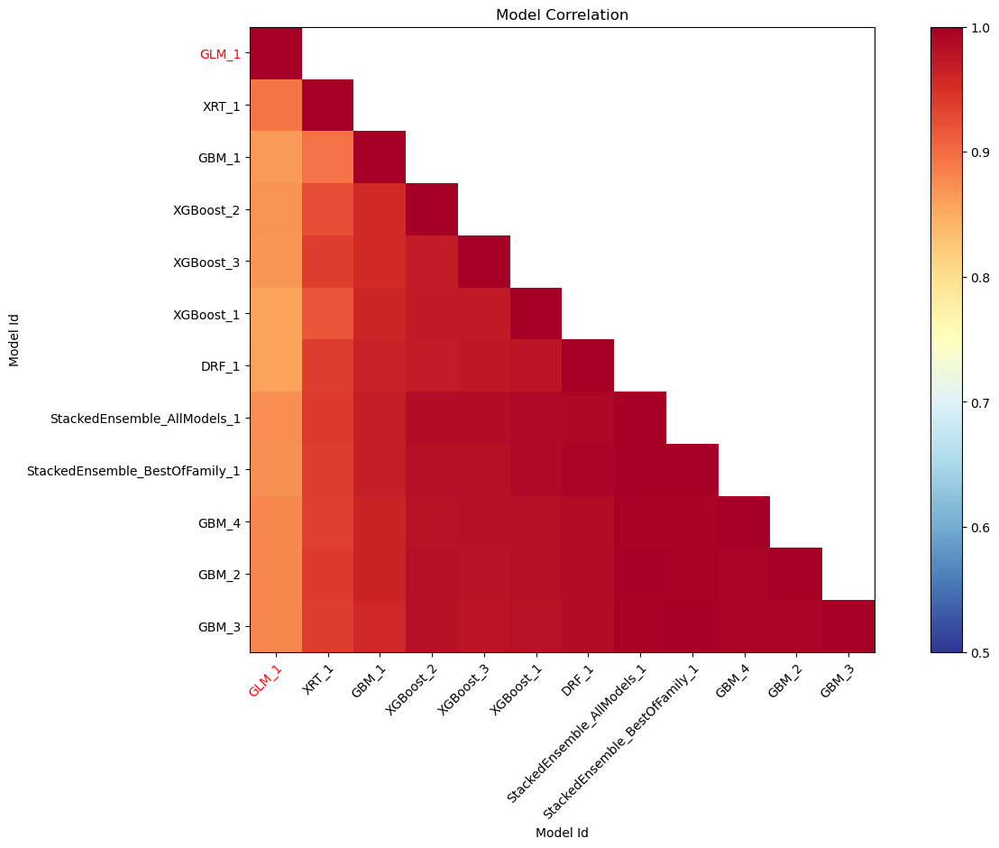

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

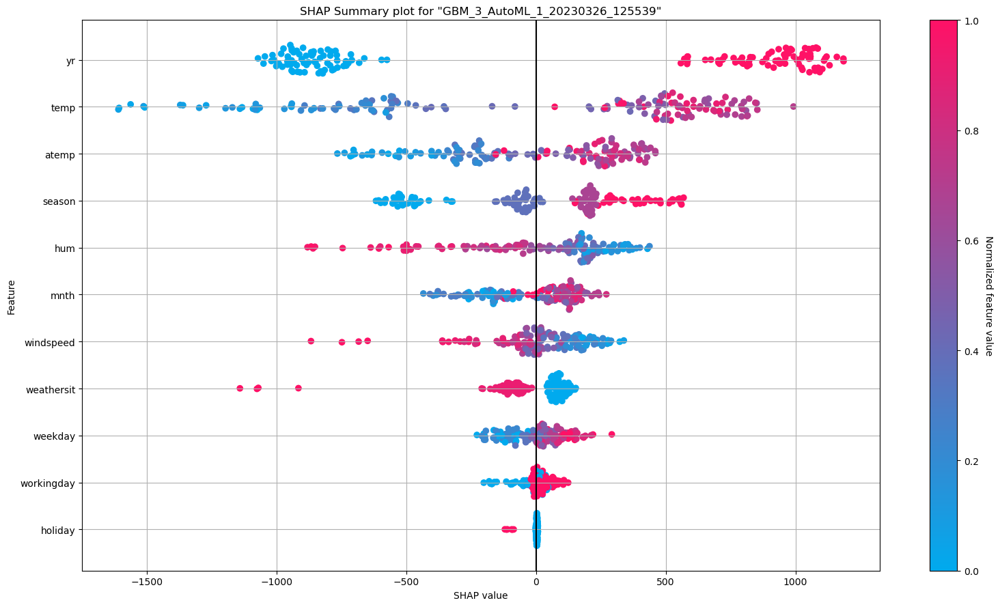

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

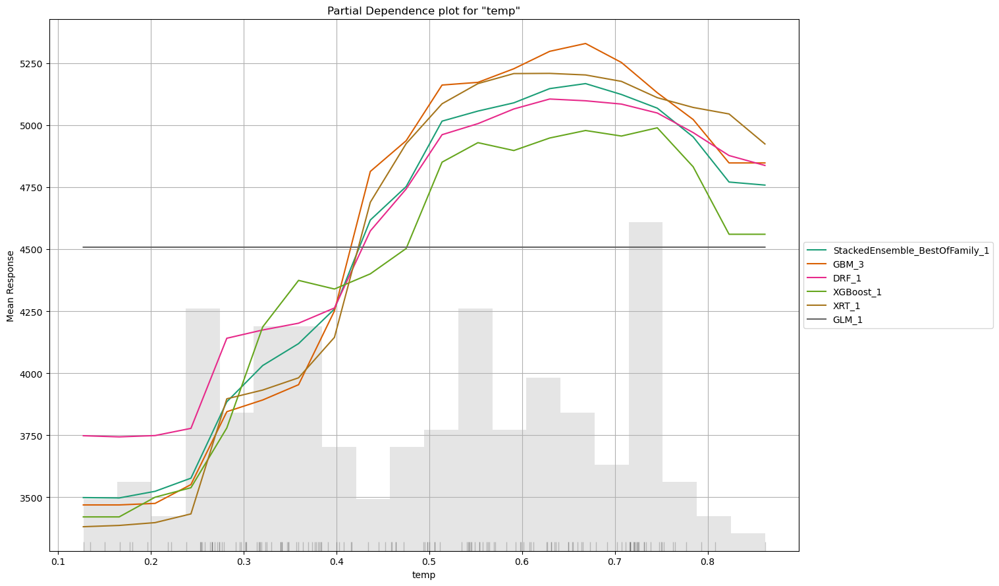

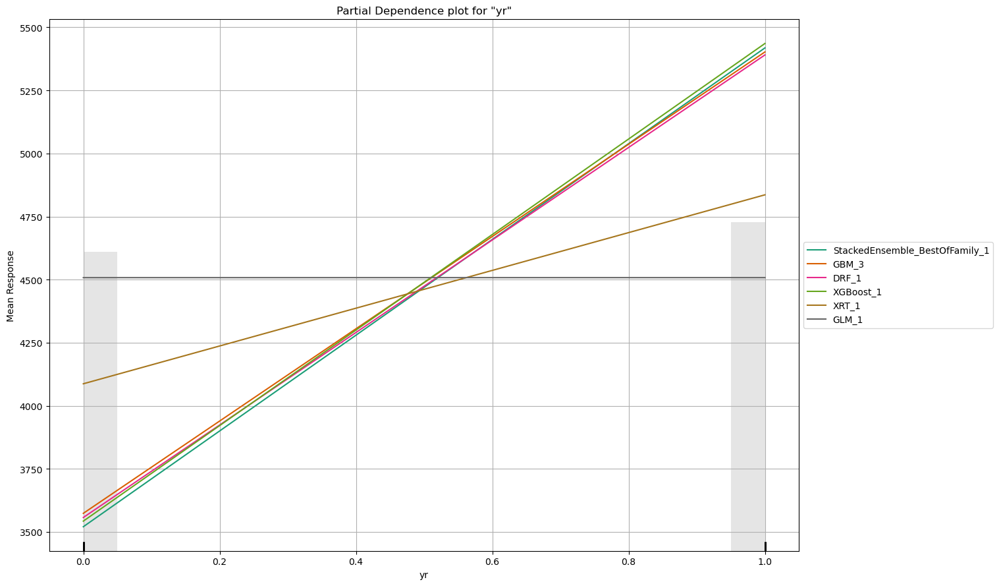

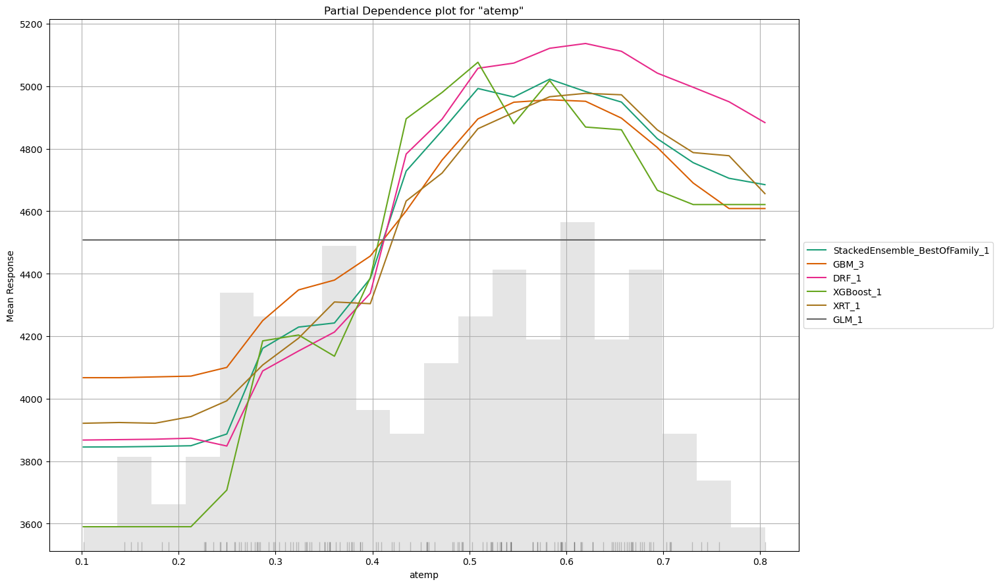

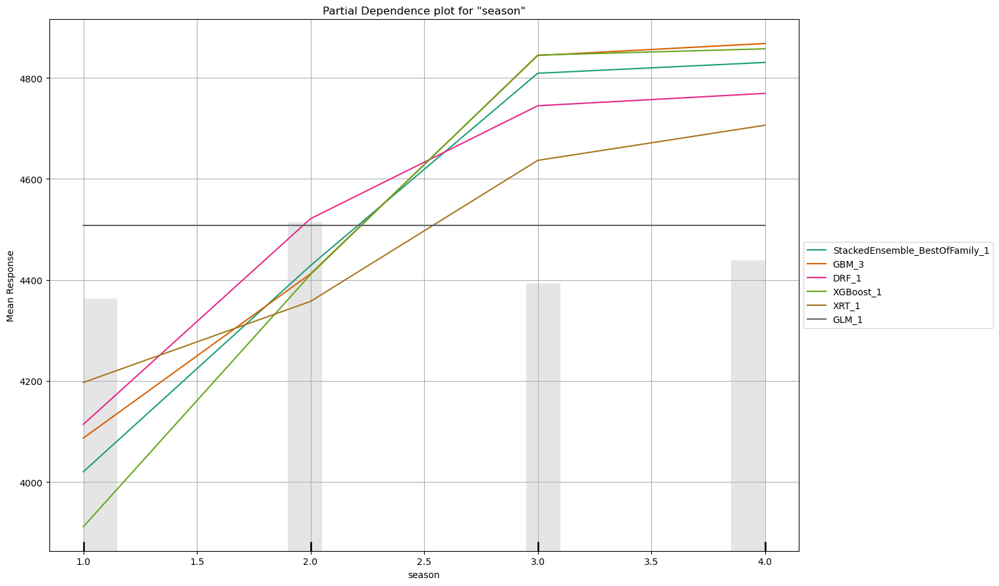

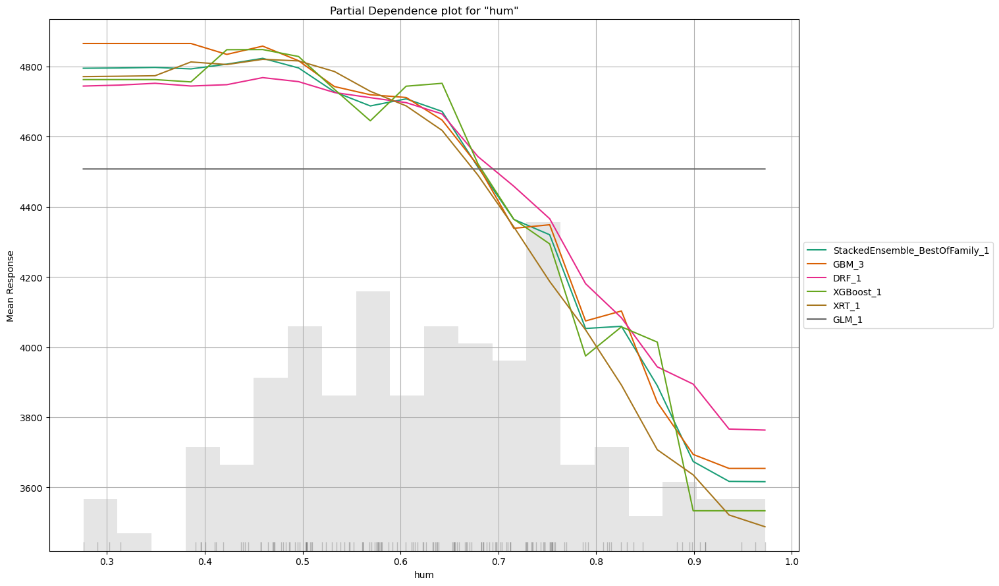

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

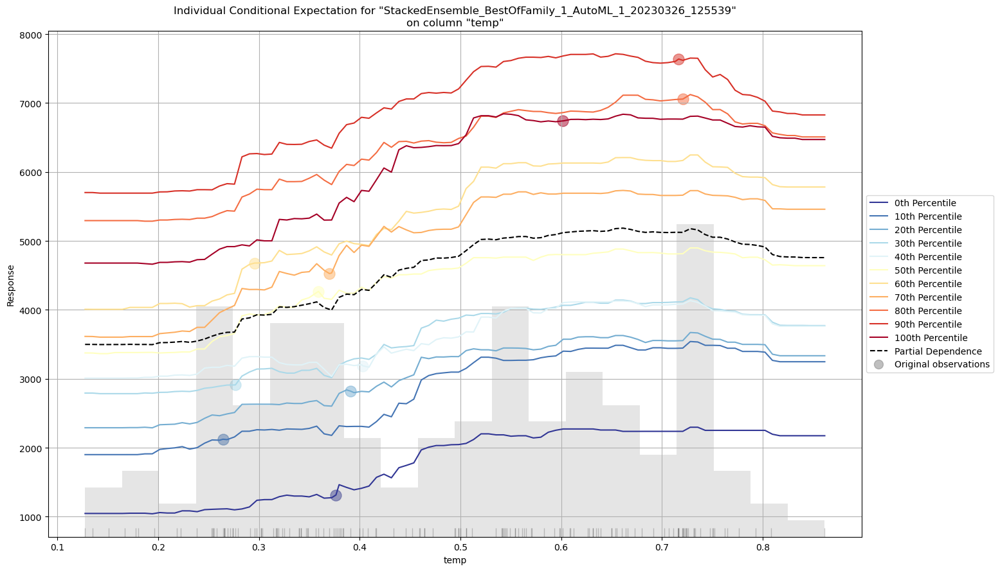

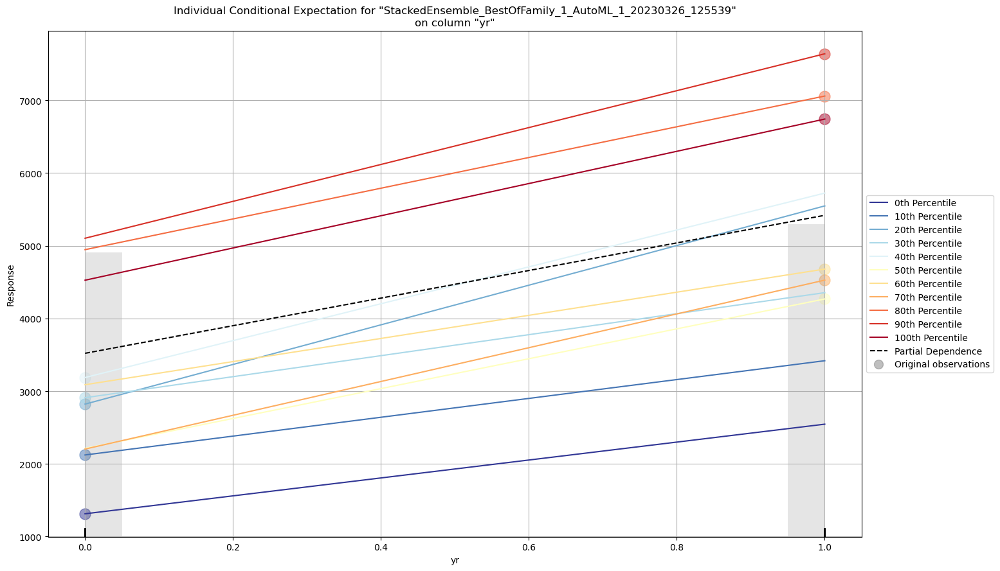

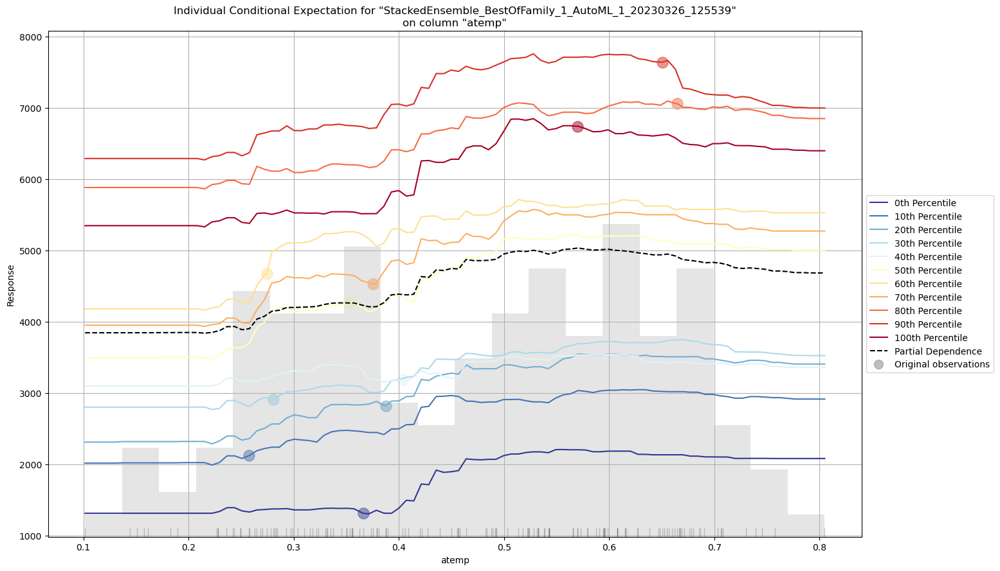

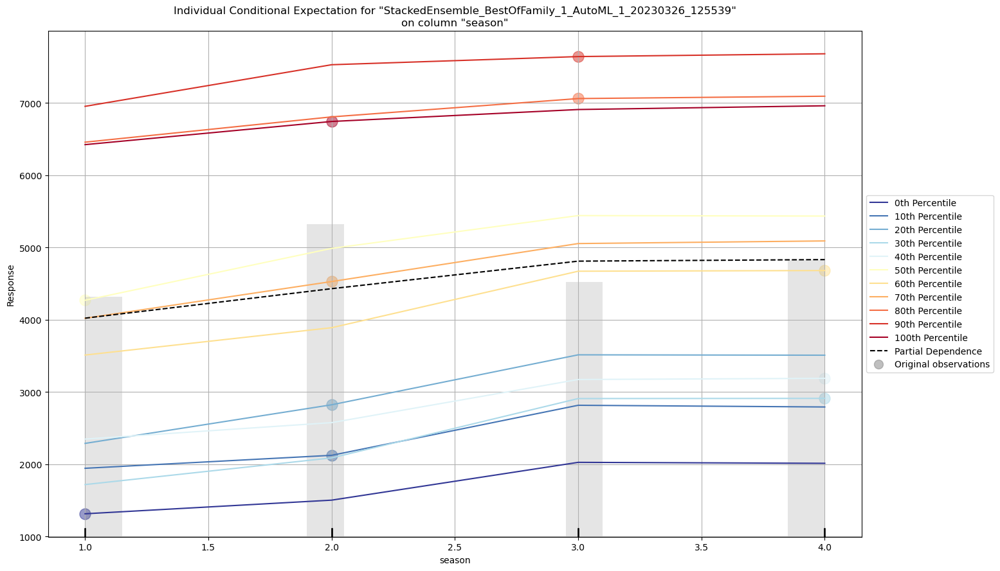

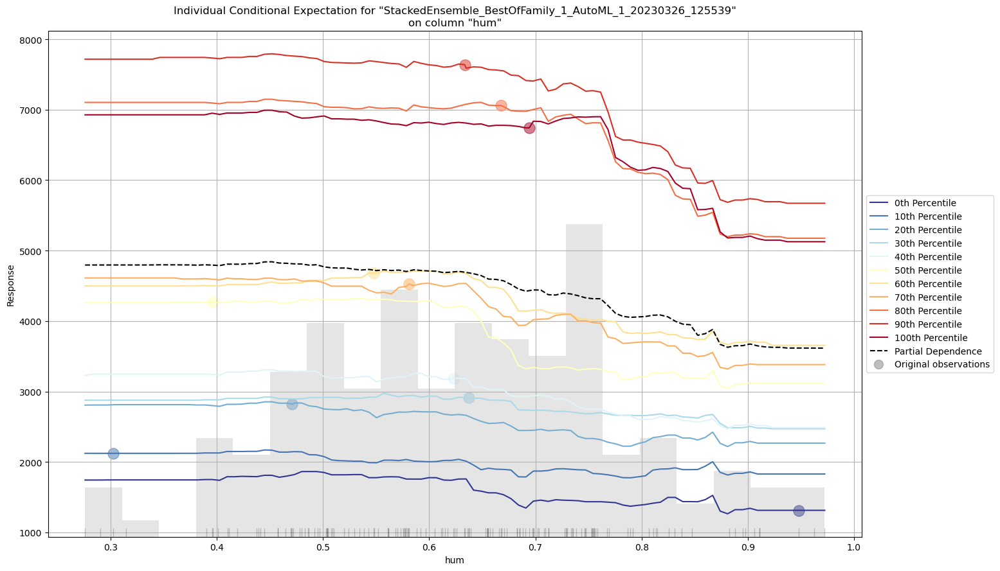

In [12]:
# Explain a generic list of models
exg_d = h2o.explain(aml_d, test_day)

In [13]:
# GBM Model
from h2o.estimators.gbm import H2OGradientBoostingEstimator
gbm = H2OGradientBoostingEstimator(distribution='poisson', ntrees=100, max_depth=10, learn_rate=0.1)
gbm.train(y=y, training_frame=train_day)

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_model_python_1679835329793_13


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    100                100                         47868                  9            10           9.9           16            50            33.24

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 39205.55157694362
RMSE: 198.00391808482885
MAE: 135.02011832650106
RMSLE: 0.19762905952588333
Mean Residual Deviance: -67752.36788554947

Scoring History: 
     timestamp            duration    number_of_trees    training_rmse       training_mae        training_deviance
---  -------------------  ----------  -----------------  ------------------  ------------------  -------------------
     2023-03-26 13:00:16  0.003 sec   0.0                1950.3445707432008  1588.9673362383428  -66840.05676045842
     2023-03-26 13:00:16  0.042 sec   1.0                1753.2379230184379  1426.7276240565677  -67005.62194090169
     2023-03-26 13:00:16  0.054 sec   2.0                1589.212847699157   1290.5722676133762  -67134.50382829494
     2023-03-26 13:00:16  0.066 sec   3.0                1446.3938260640434  1171.2183054993286  -67238.81597611128
     2023-03-26 13:00:16  0.078 sec   4.0                1321.202563266846   1066.064640631875   -67323.46009977731
     2023-03-26 13:00:16  0.090 sec   5.0                1214.4070583813777  976.0659331062951   -67389.85688331303
     2023-03-26 13:00:16  0.101 sec   6.0                1120.6279670029492  895.9999232956568   -67444.04185077666
     2023-03-26 13:00:16  0.112 sec   7.0                1035.573758681139   820.8521800720871   -67489.15940150197
     2023-03-26 13:00:16  0.123 sec   8.0                960.0308526711937   755.270329663665    -67526.05094150615
     2023-03-26 13:00:16  0.133 sec   9.0                892.9699925062694   697.8595221290806   -67556.7371933514
---  ---                  ---         ---                ---                 ---                 ---
     2023-03-26 13:00:17  0.930 sec   91.0               208.5642897540285   142.24834923968987  -67750.83887817517
     2023-03-26 13:00:17  0.939 sec   92.0               206.8717937222373   141.15428530017323  -67751.10510937341
     2023-03-26 13:00:17  0.948 sec   93.0               205.68676368929067  140.4876865196802   -67751.26708473072
     2023-03-26 13:00:17  0.959 sec   94.0               204.96997859240537  140.19935853984214  -67751.4065804554
     2023-03-26 13:00:17  0.968 sec   95.0               203.67214003857674  139.22849774316956  -67751.59800528397
     2023-03-26 13:00:17  0.977 sec   96.0               202.44110569868073  138.28224614412082  -67751.74495572151
     2023-03-26 13:00:17  0.986 sec   97.0               201.51180003820645  137.7295092183047   -67751.90596258952
     2023-03-26 13:00:17  0.994 sec   98.0               200.5329240211298   136.976006072402    -67752.03959429303
     2023-03-26 13:00:17  1.004 sec   99.0               198.63192608563799  135.3675368136218   -67752.27211618218
     2023-03-26 13:00:17  1.013 sec   100.0              198.00391808482885  135.02011832650106  -67752.36788554947
[101 rows x 7 columns]


Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
temp        4.19868e+09            1                    0.383417
yr          3.63074e+09            0.864732             0.331553
hum         7.63985e+08            0.181958             0.0697659
season      6.52349e+08            0.15537              0.0595714
atemp       6.13328e+08            0.146076             0.0560082
windspeed 

### 2. For Hour dataset
#### Using H2O AutoML to build a model and also a Deep Learning (DL) model for the Hour dataset

In [14]:
# Run AutoML for 1 minute
aml_h = H2OAutoML(max_models=10, seed=1, max_runtime_secs=60)
aml_h.train(y=y, training_frame=train_hour)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_1_AutoML_2_20230326_130018


Model Summary: 
    number_of_trees
--  -----------------
    50

ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 293.84084035620344
RMSE: 17.14178638171073
MAE: 11.55291277238263
RMSLE: NaN
Mean Residual Deviance: 293.84084035620344

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 1783.8913721130084
RMSE: 42.23613822442824
MAE: 27.83906777006521
RMSLE: NaN
Mean Residual Deviance: 1783.8913721130084

Cross-Validation Metrics Summary: 
                        mean      sd          cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ----------  ------------  ------------  ------------  ------------  ------------
mae                     27.8392   1.216       27.0396       27.8448       26.7445       27.7128       29.8544
mean_residual_deviance  1783.9    134.251     1694.32       1923.27       1667.21       1697.37       1937.33
mse                     1783.9    134.251     1694.32       1923.27       1667.21       1697.37       1937.33
r2                      0.946547  0.00387731  0.948967      0.943539      0.95121       0.947264      0.941754
residual_deviance       1783.9    134.251     1694.32       1923.27       1667.21       1697.37       1937.33
rmse                    42.2126   1.57995     41.1621       43.8552       40.8315       41.1992       44.0151
rmsle                   nan       0           nan           nan           nan           nan           nan

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-03-26 13:00:30  12.579 sec  0                  263.425          189.776         69392.8
    2023-03-26 13:00:30  12.729 sec  5                  69.3484          44.7315         4809.2
    2023-03-26 13:00:31  12.834 sec  10                 37.6491          24.2401         1417.45
    2023-03-26 13:00:31  12.964 sec  15                 30.195           19.3512         911.735
    2023-03-26 13:00:31  13.095 sec  20                 27.0135          17.4428         729.729
    2023-03-26 13:00:31  13.253 sec  25                 24.3342          15.9214         592.152
    2023-03-26 13:00:31  13.429 sec  30                 22.5409          14.9128         508.093
    2023-03-26 13:00:31  13.613 sec  35                 20.9716          13.9676         439.809
    2023-03-26 13:00:32  13.823 sec  40                 19.7286          13.1844         389.217
    2023-03-26 13:00:32  14.034 sec  45                 18.4277          12.3469         339.582
    2023-03-26 13:00:32  14.261 sec  50                 17.1418          11.5529         293.841

Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
hr          3.23863e+08            1                    0.58965
temp        4.81146e+07            0.148565             0.0876012
yr          4.29858e+07            0.132728             0.0782633
atemp       3.9297e+07             0.121339             0.0715473
workingday  1.93306e+07            0.0596877            0.0351949
hum         1.93135e+07            0.0596349            0.0351637
weekday     1.88849e+07            0.0583113            0.0343833
season      1.35412e+07            0.0418115            0.0246542
weathersit  9.79642e+06            0.0302487            0.0178361
windspeed   7.30968e+06            0.0225703            0.0133086
mnth        6.2283e+06             0.0192313            0.0113397
holiday     580869                 0.00179357           0.00105758

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
XGBoost_1_AutoML_2_20230326_130018,42.8722,1838.03,27.366,nan,1838.03,1845,0.005233,XGBoost
GLM_1_AutoML_2_20230326_130018,137.017,18773.7,101.898,nan,18773.7,98,0.000674,GLM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

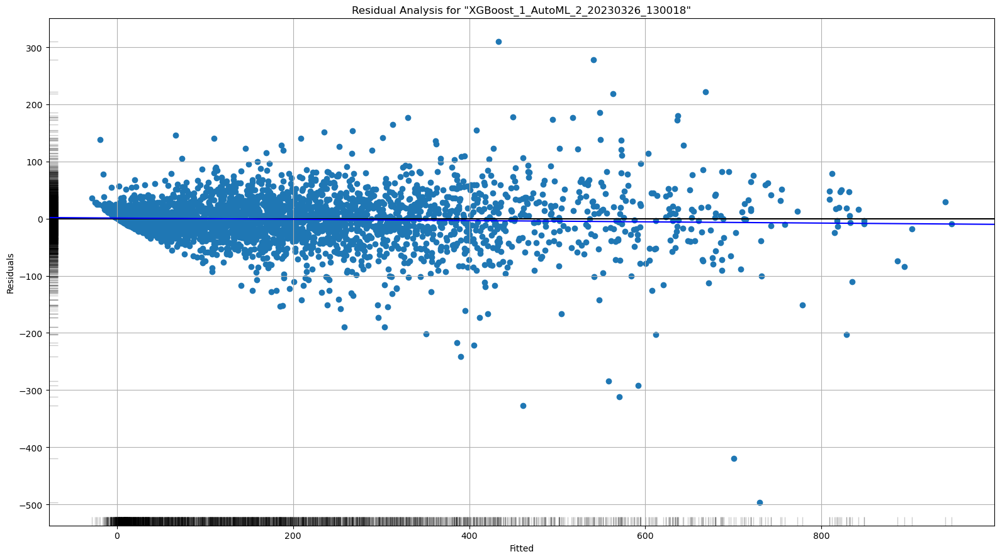

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

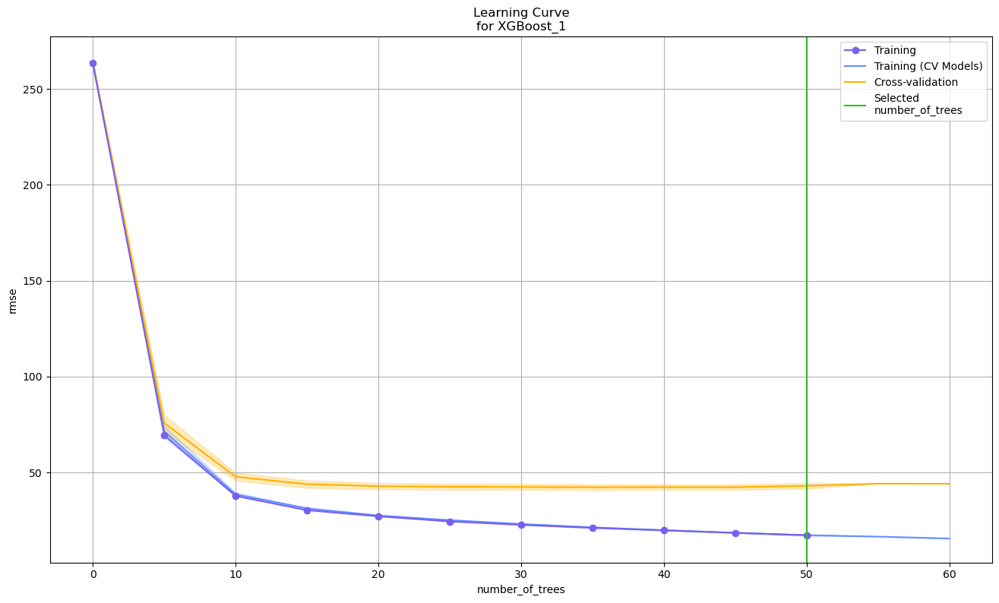

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

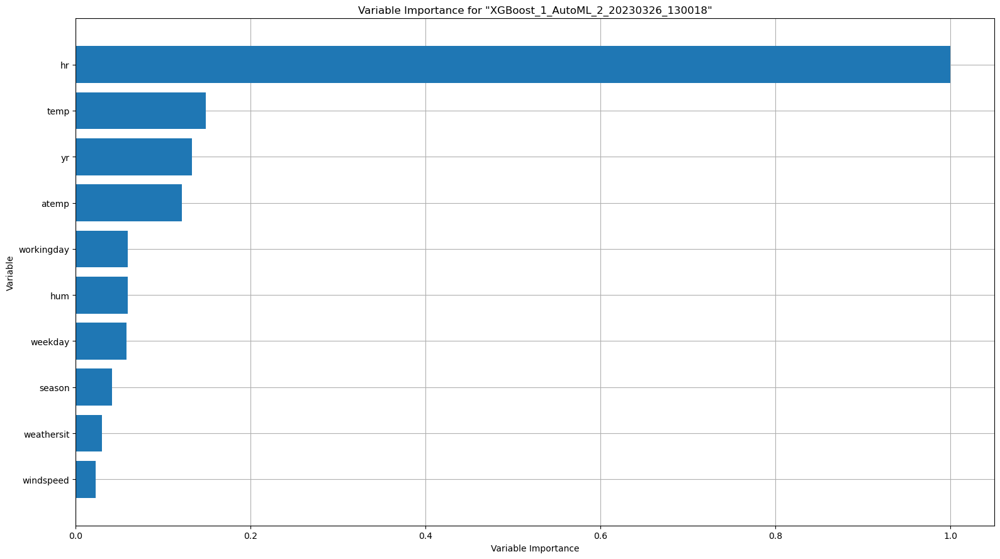

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

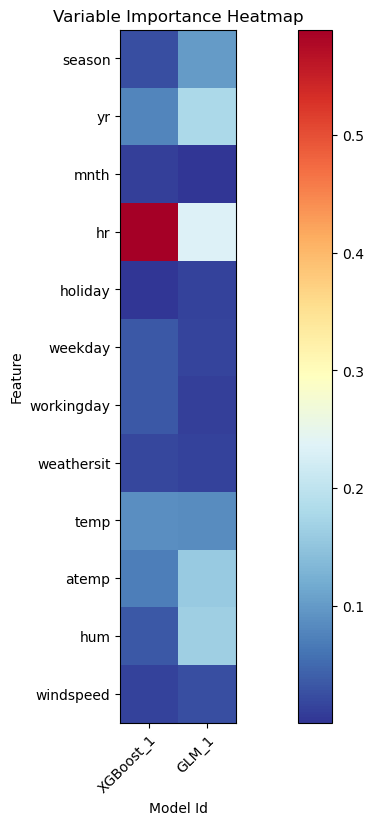

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

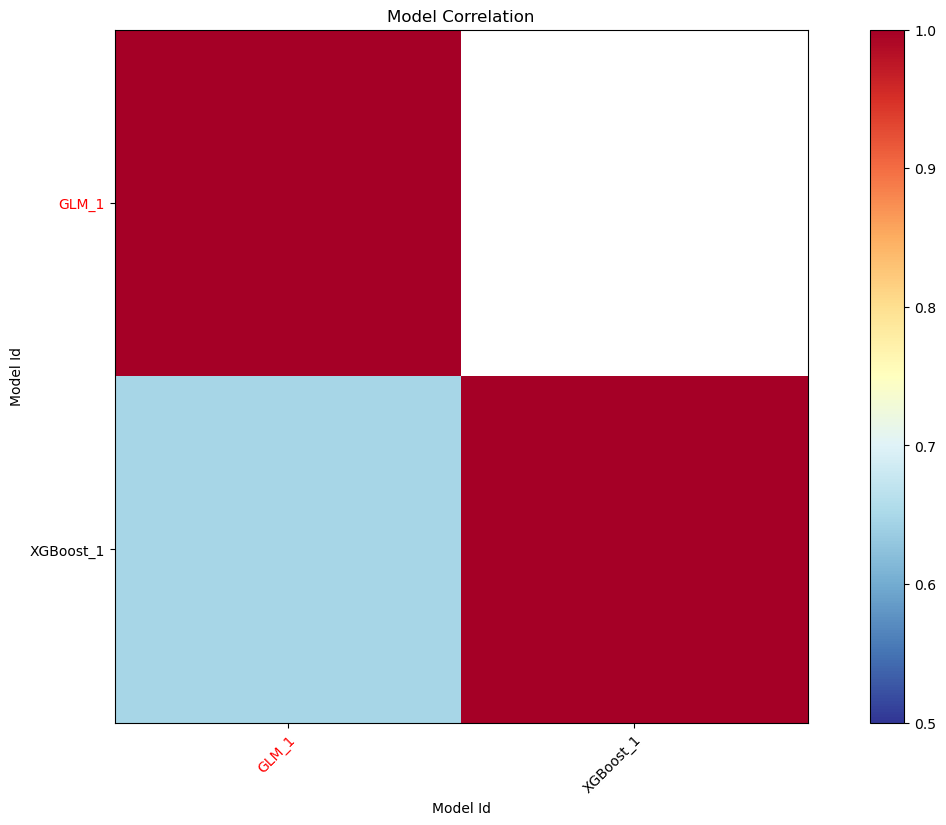

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

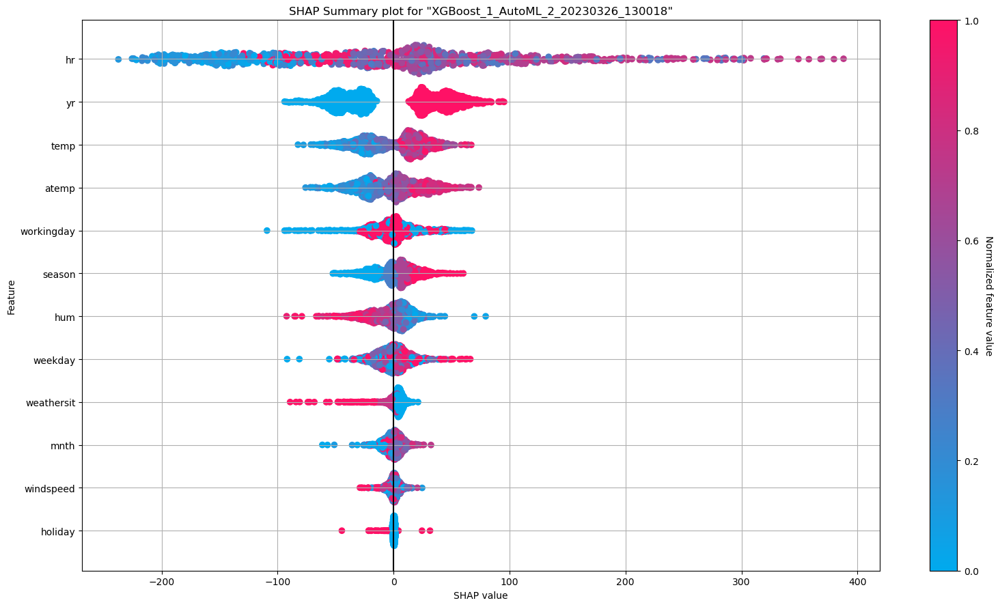

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

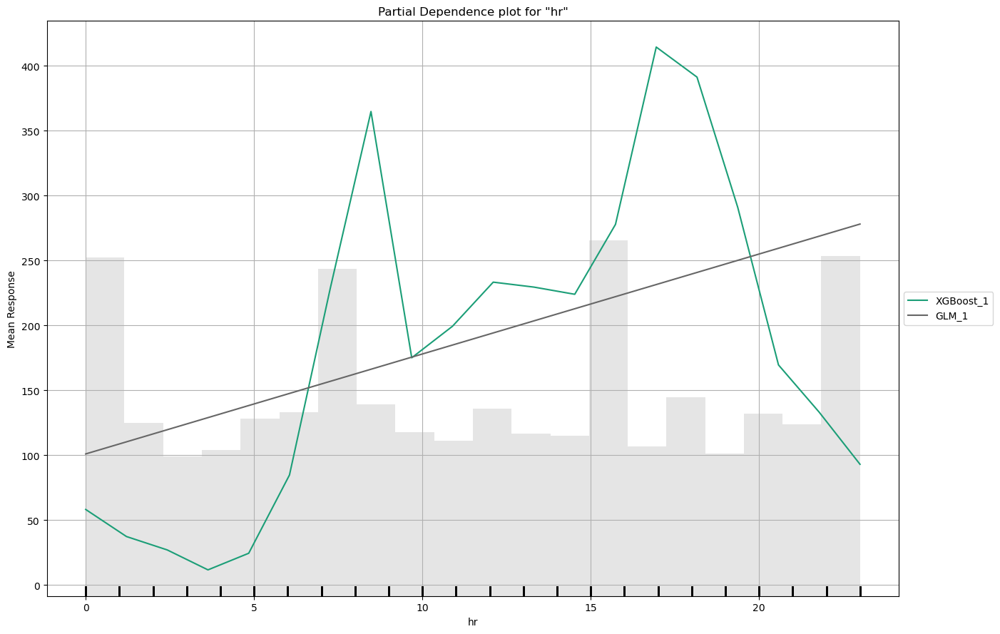

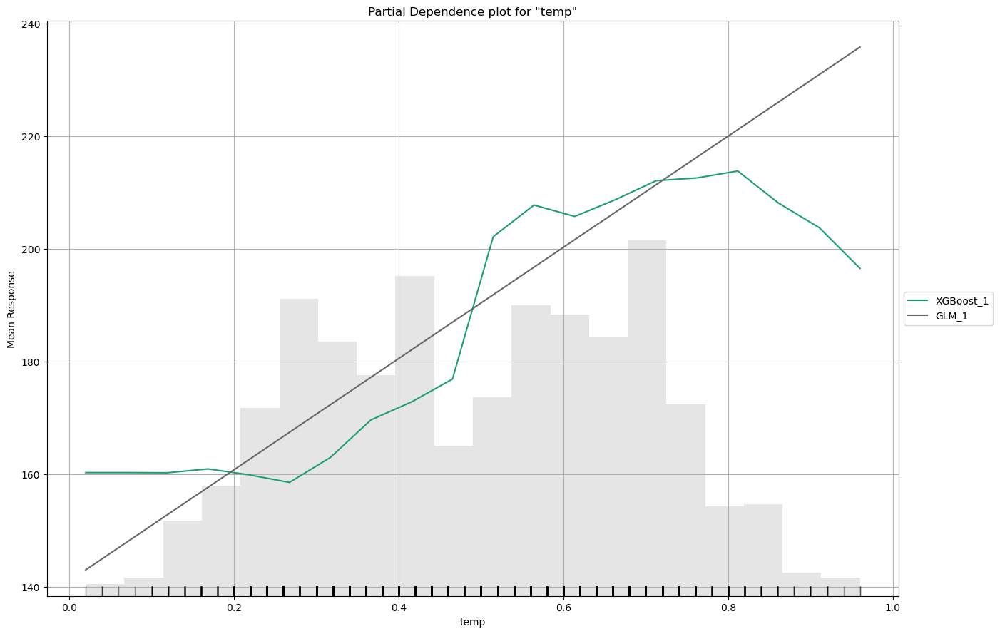

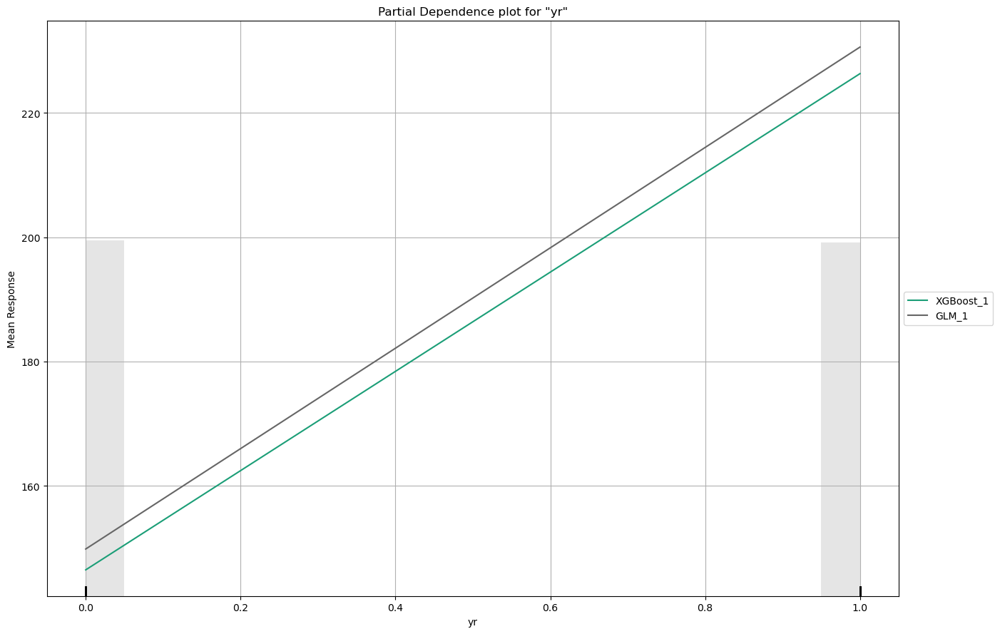

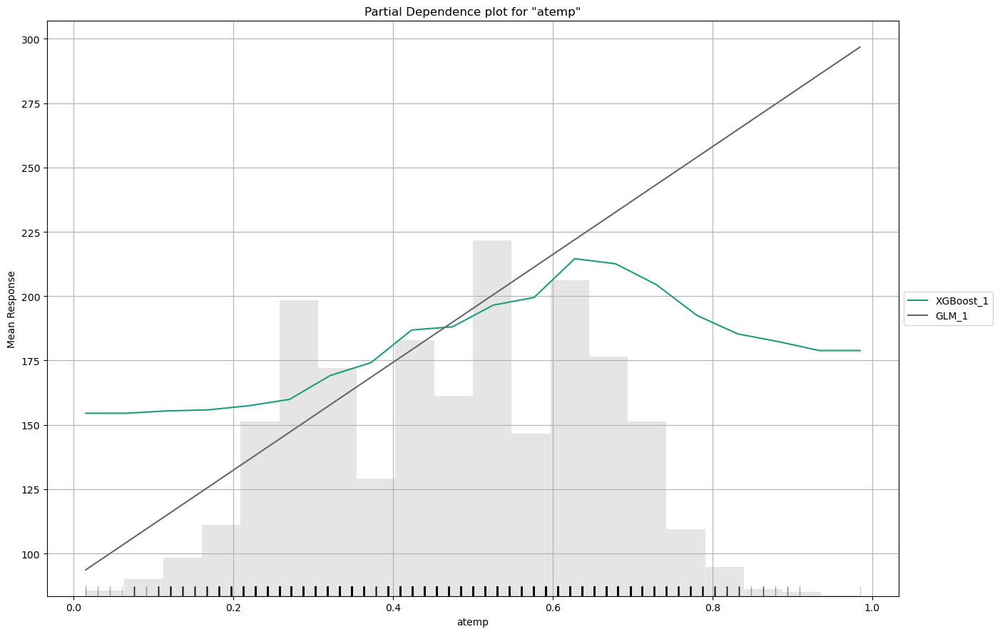

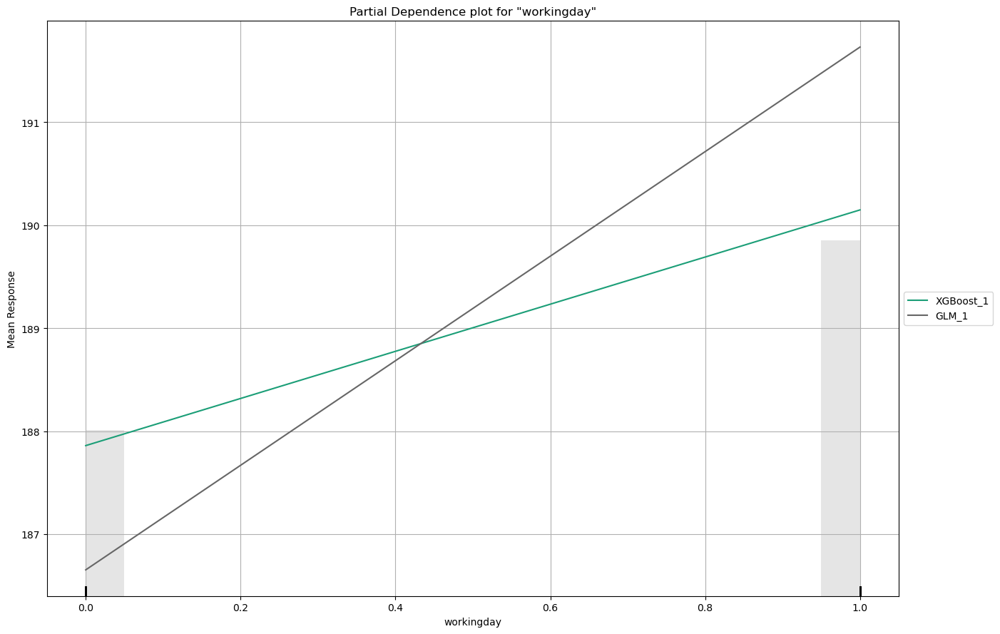

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

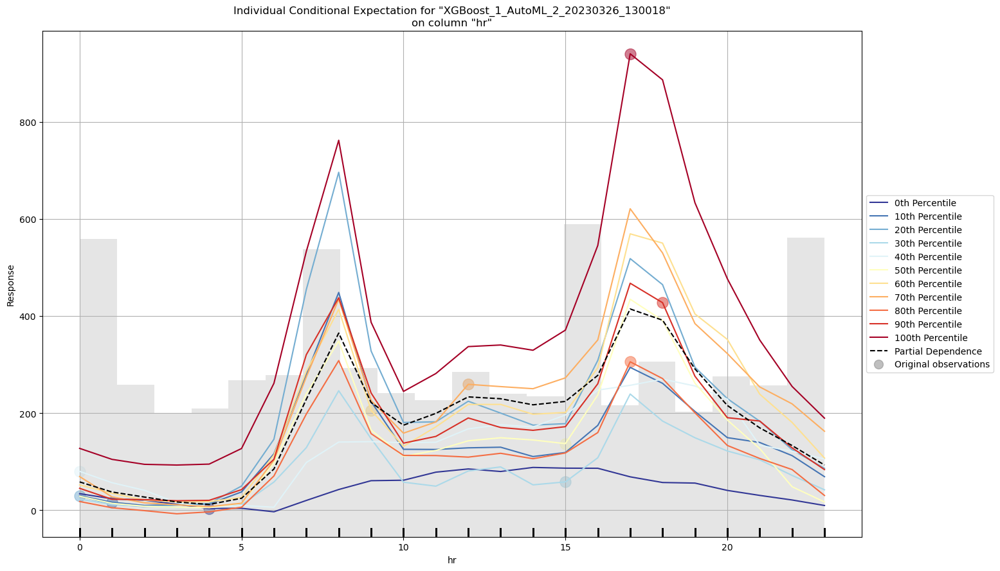

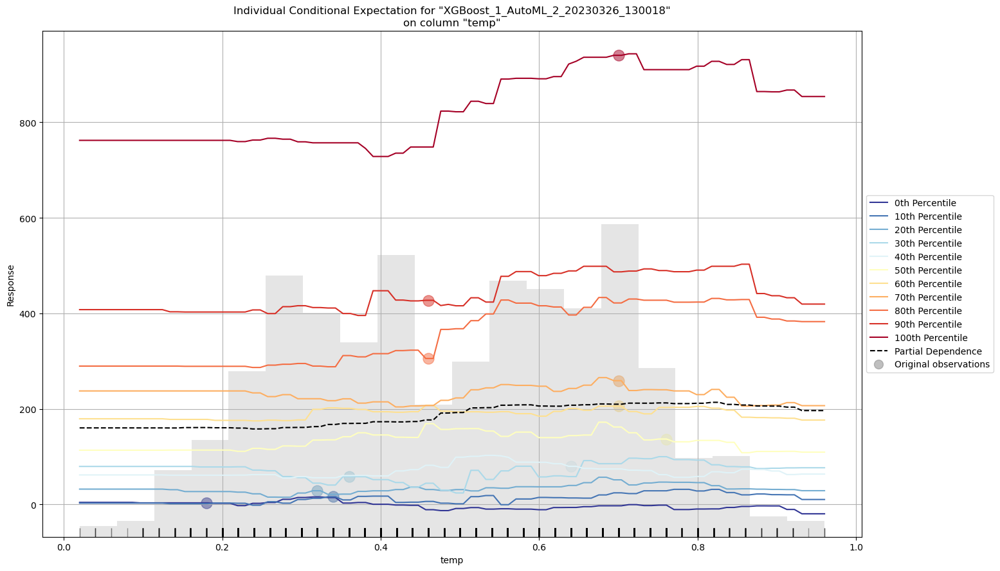

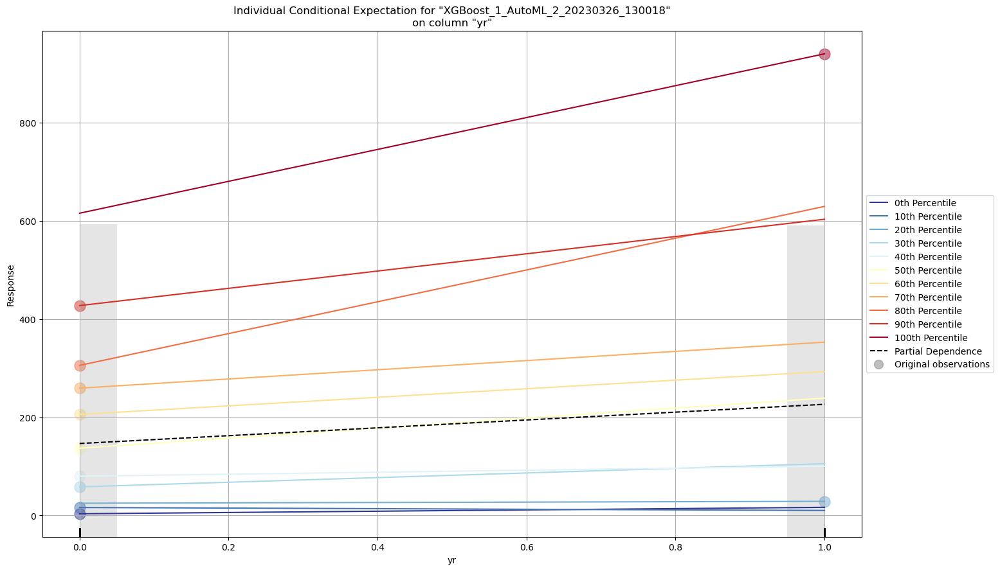

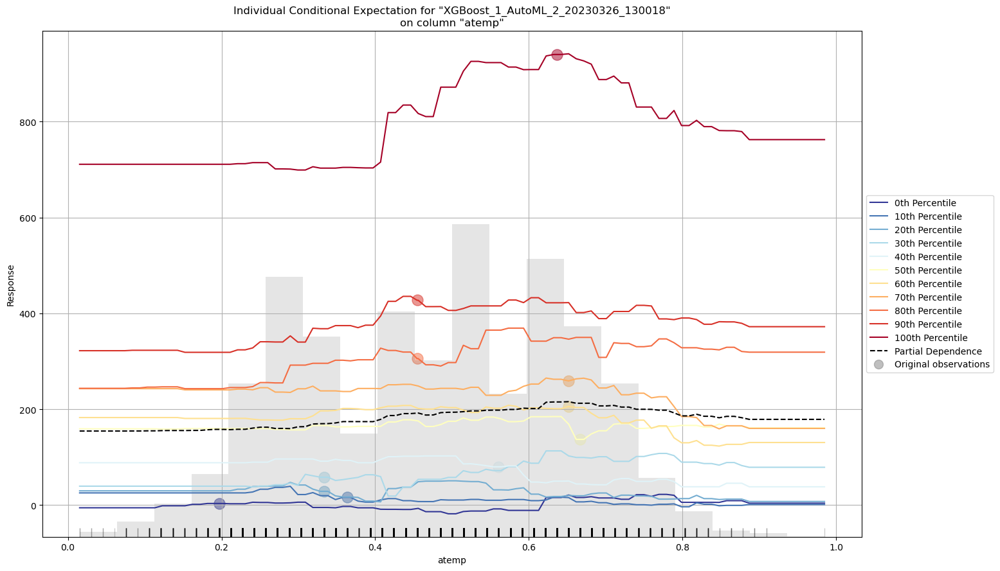

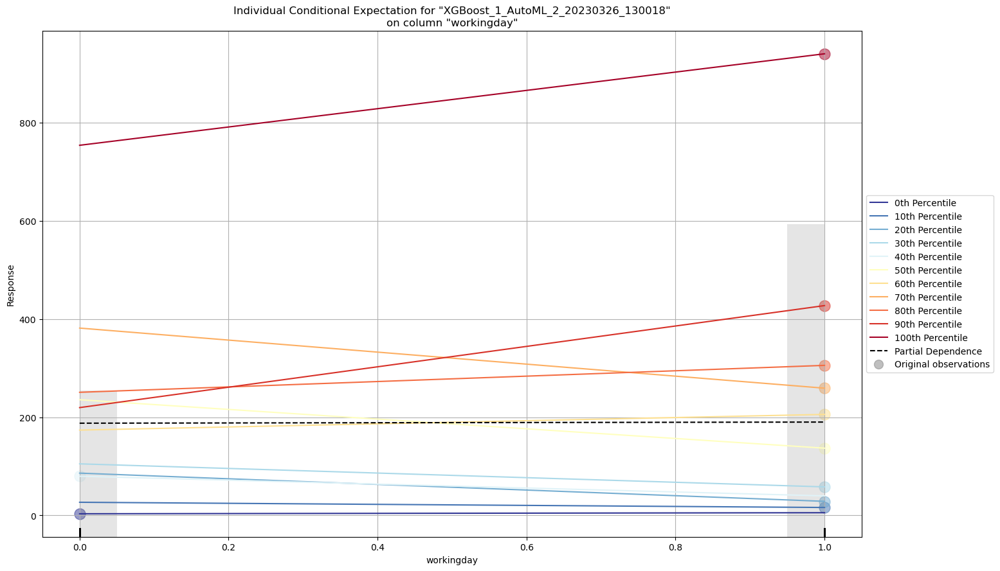

In [15]:
# Explain leader model & compare with all AutoML models
exa_h = aml_h.explain(test_hour)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

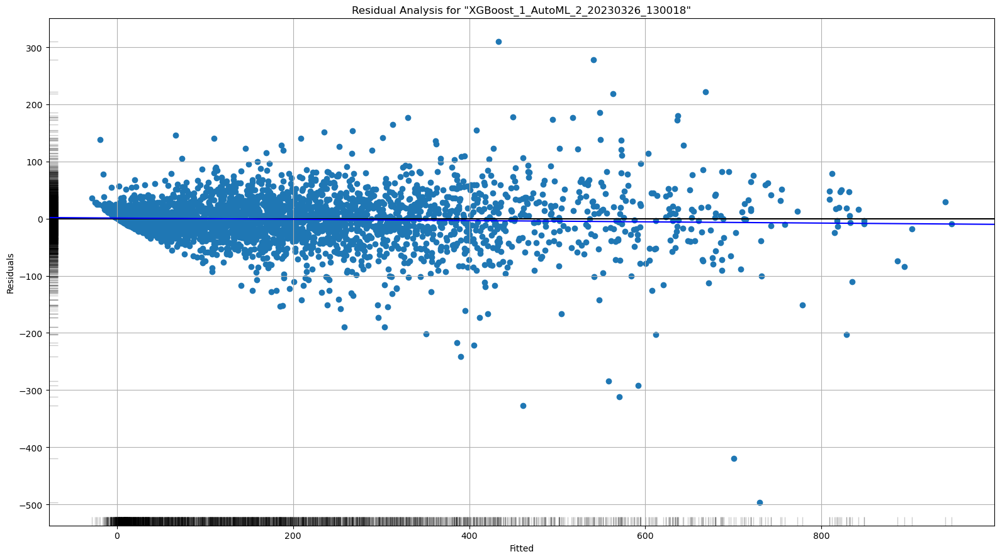

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

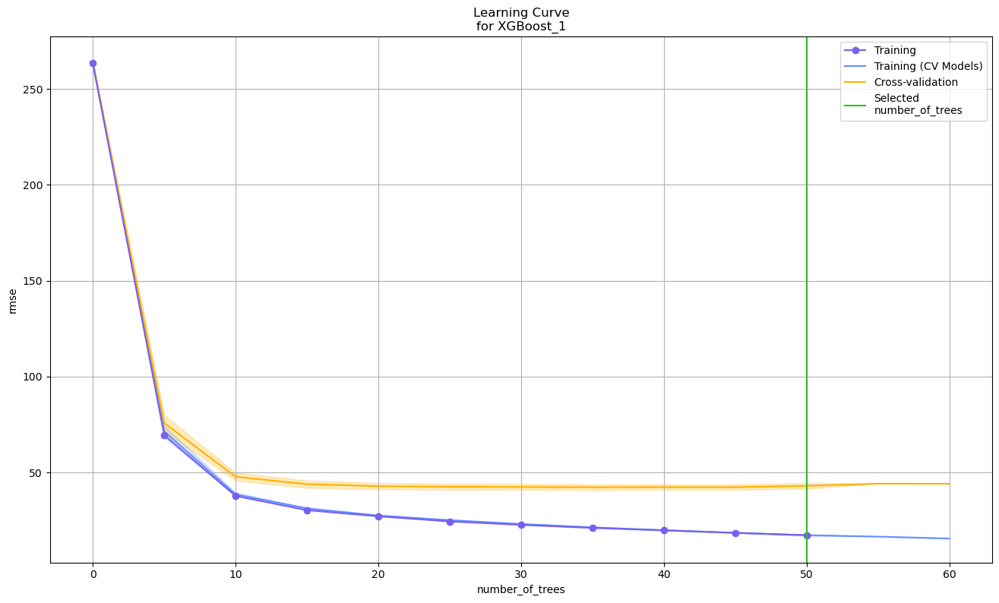

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

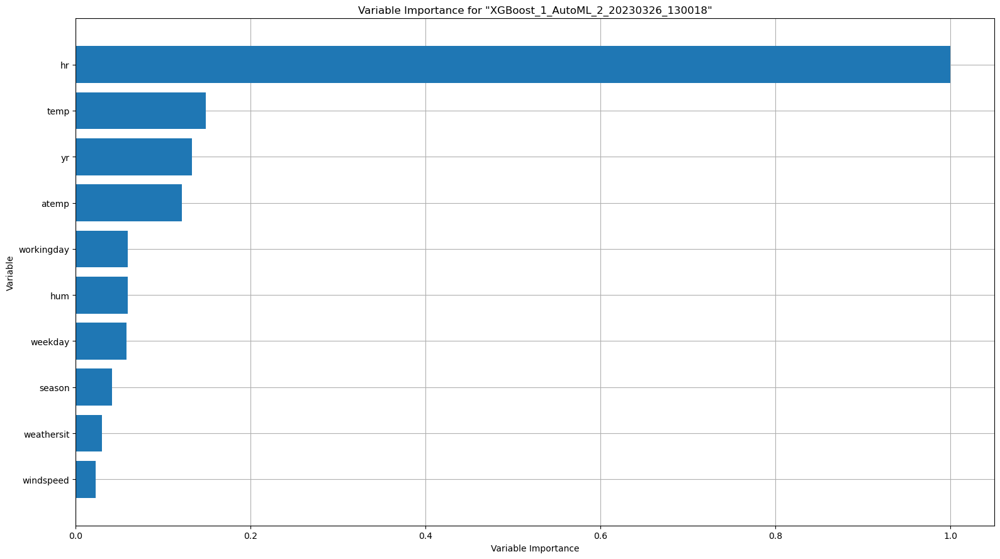

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

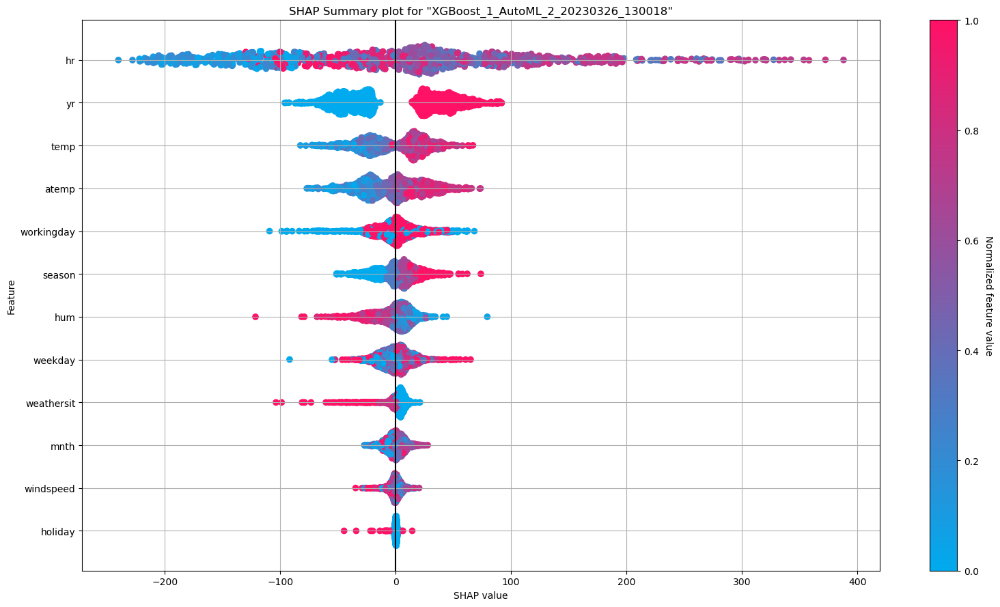

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

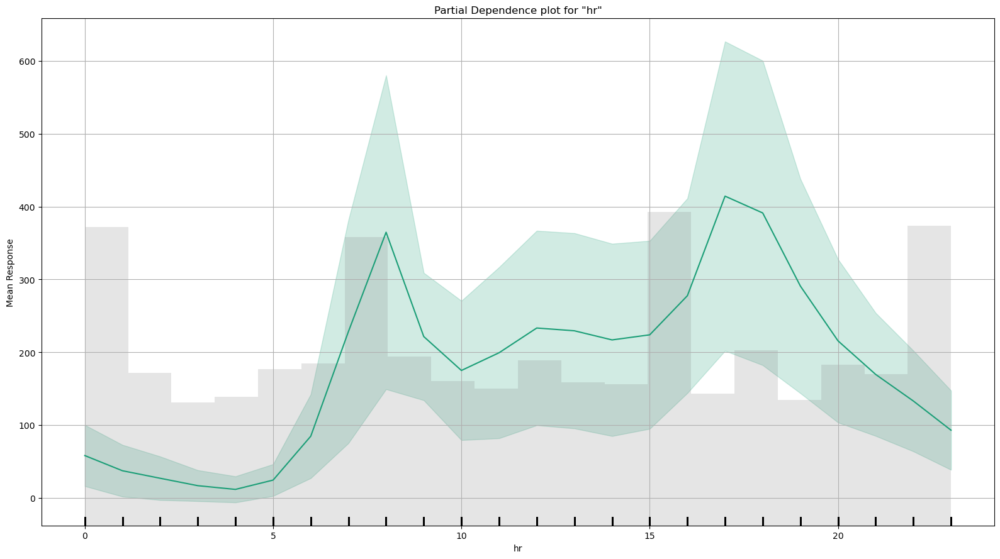

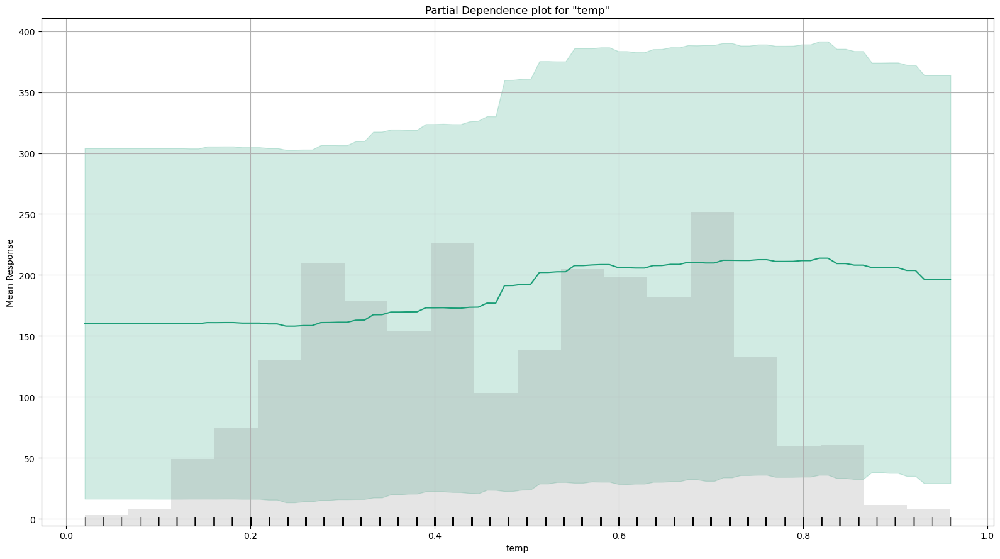

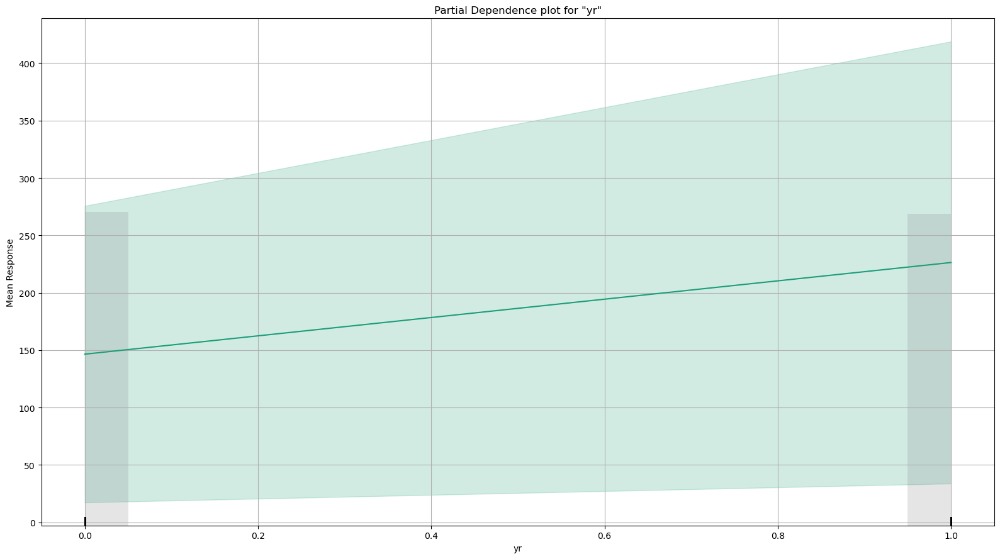

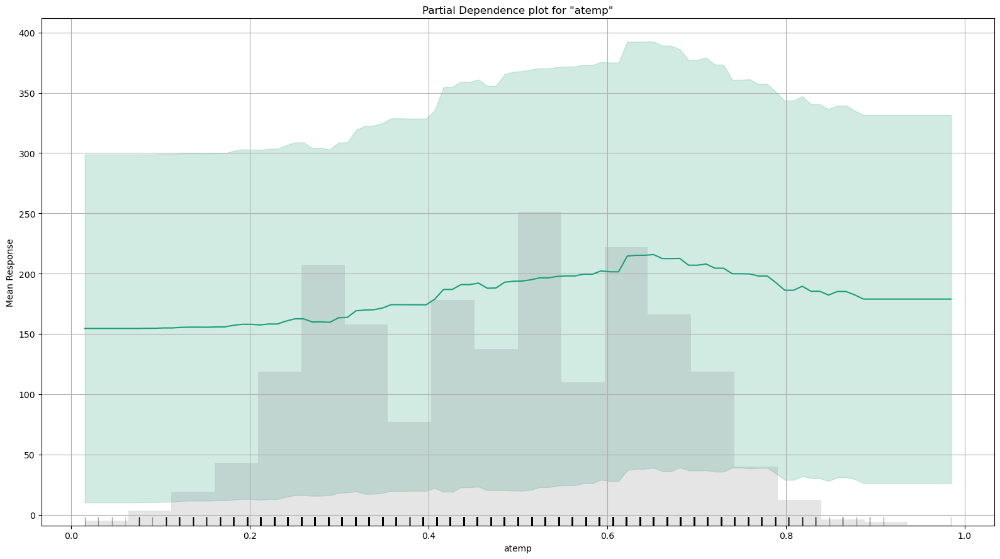

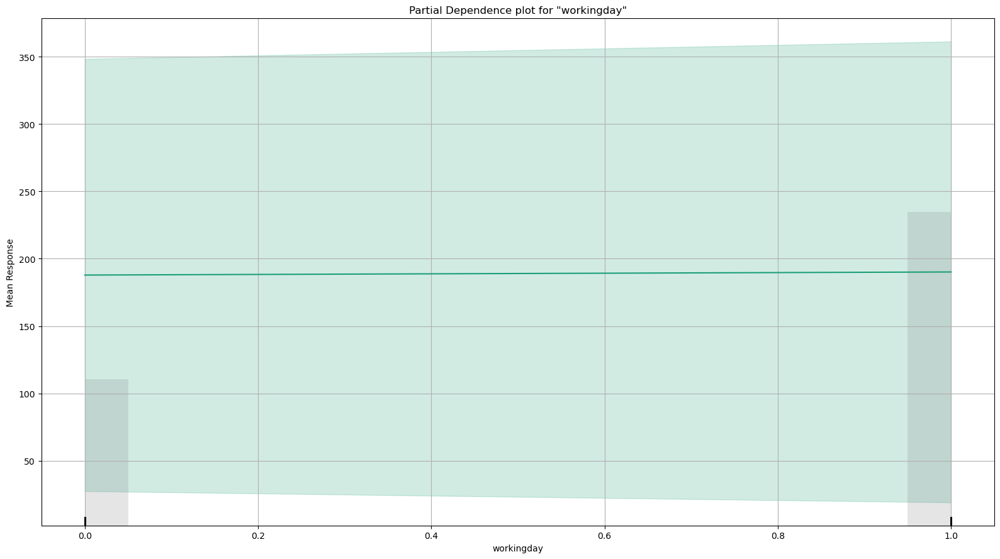

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

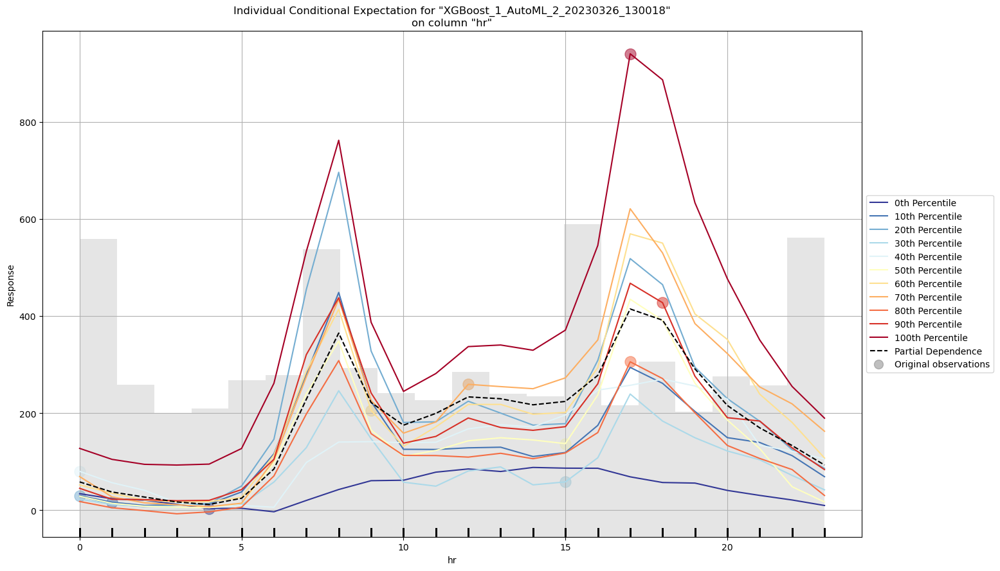

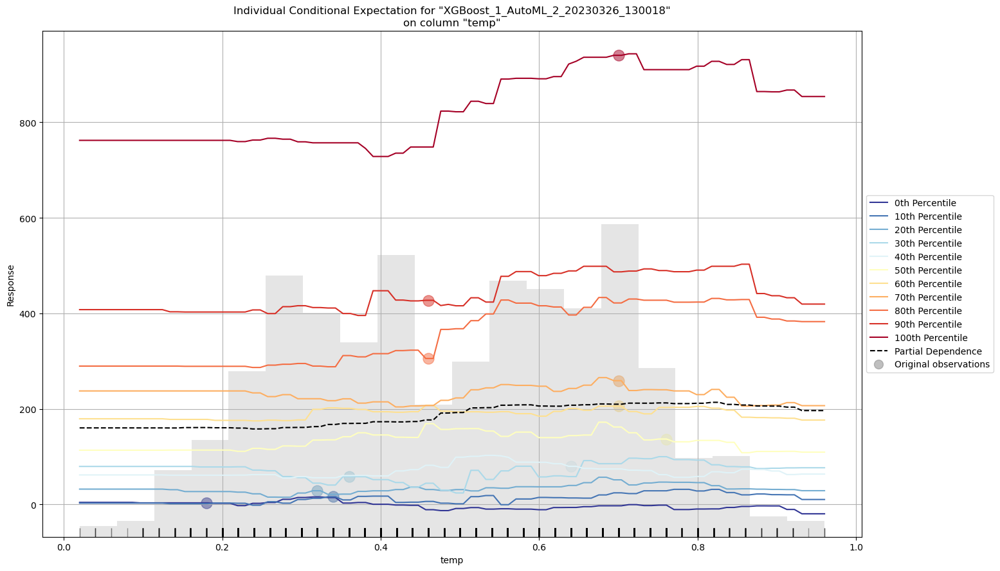

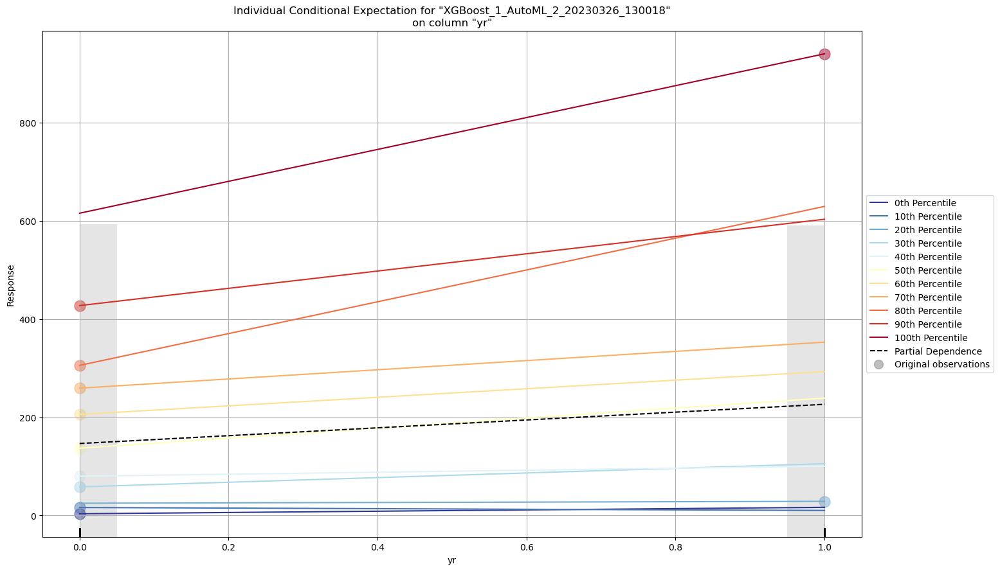

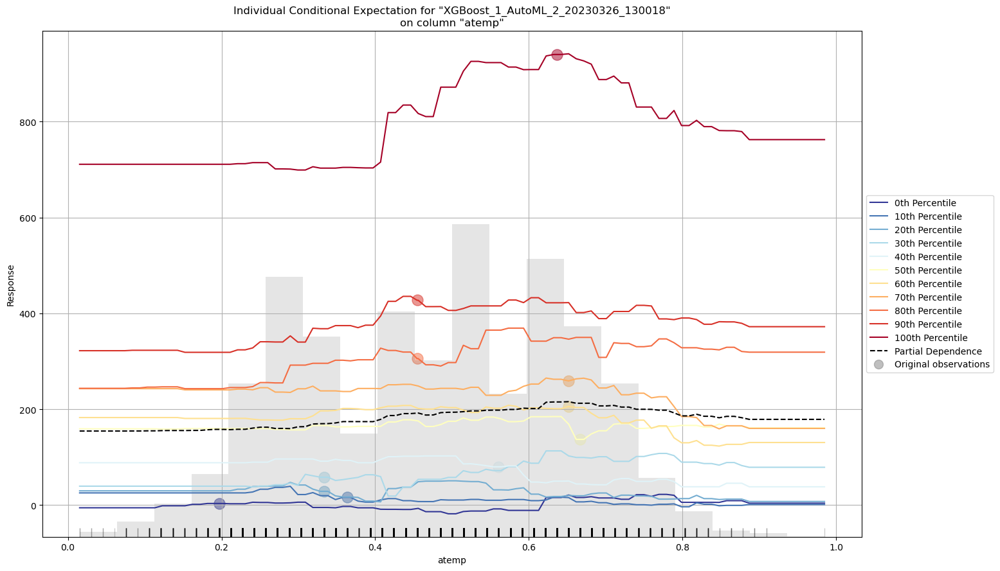

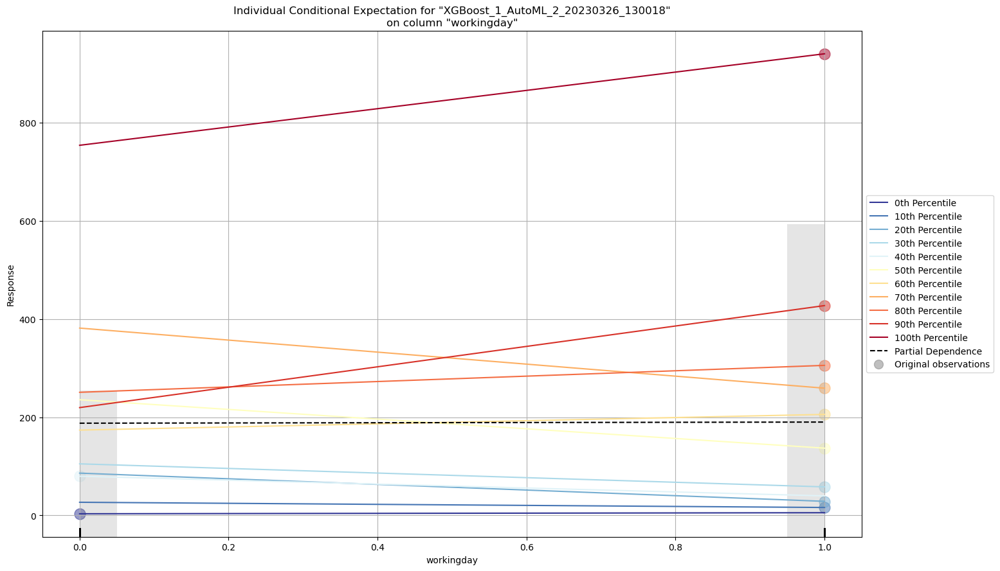

In [16]:
# Explain a single H2O model (e.g. leader model from AutoML)
exm_h = aml_h.leader.explain(test_hour)

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
XGBoost_1_AutoML_2_20230326_130018,42.8722,1838.03,27.366,nan,1838.03,1845,0.005233,XGBoost
GLM_1_AutoML_2_20230326_130018,137.017,18773.7,101.898,nan,18773.7,98,0.000674,GLM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

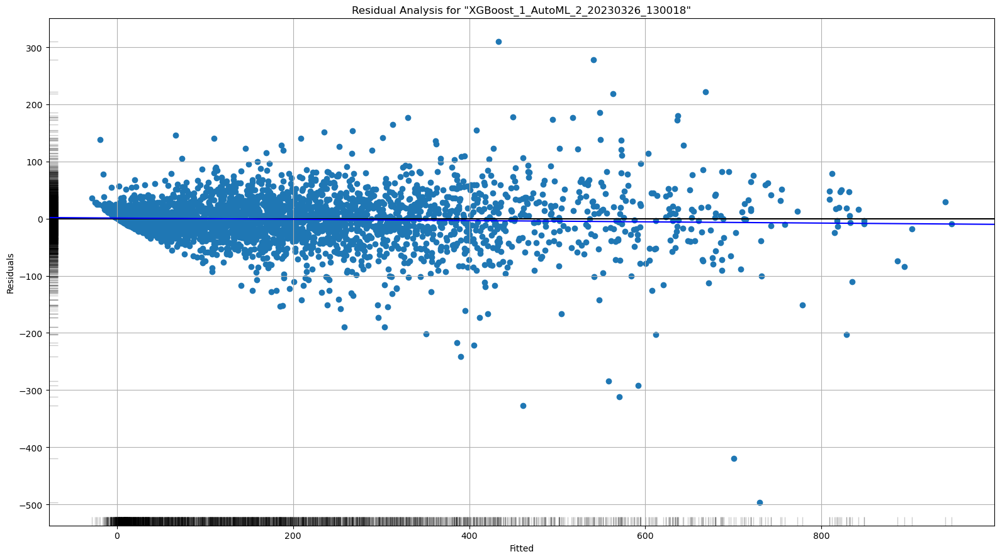

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

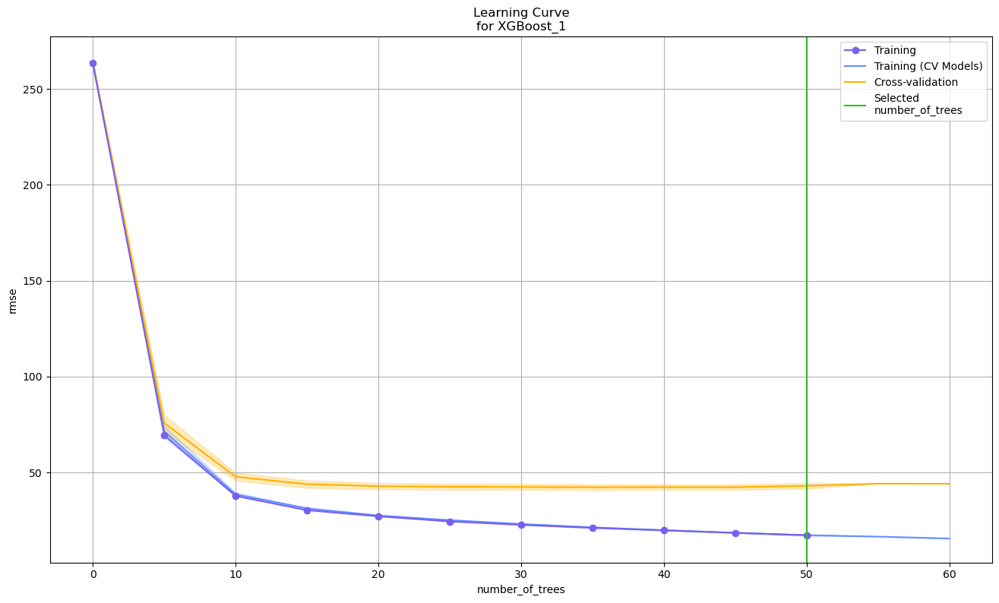

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

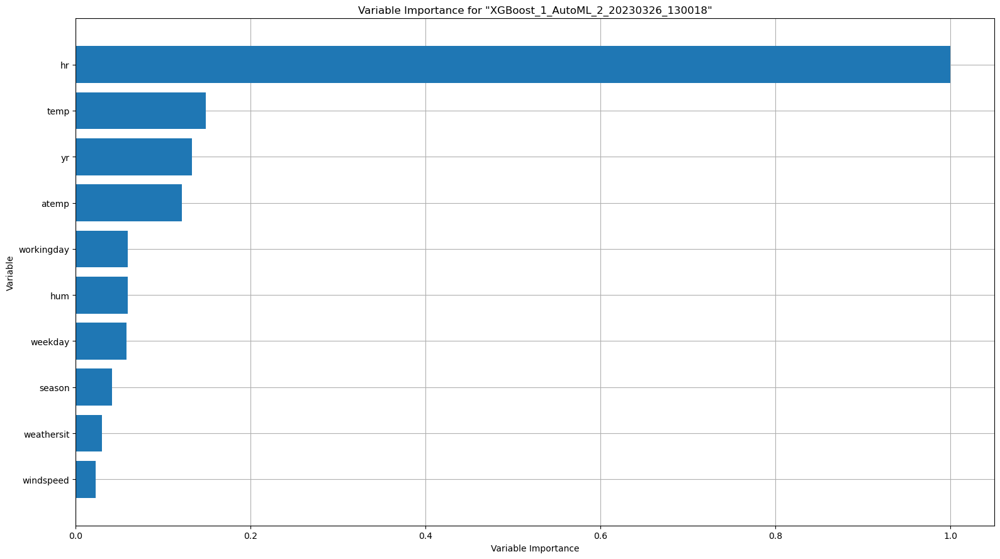

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

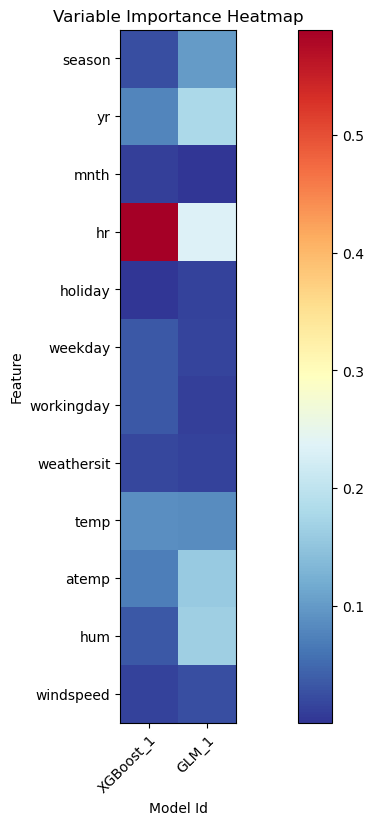

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

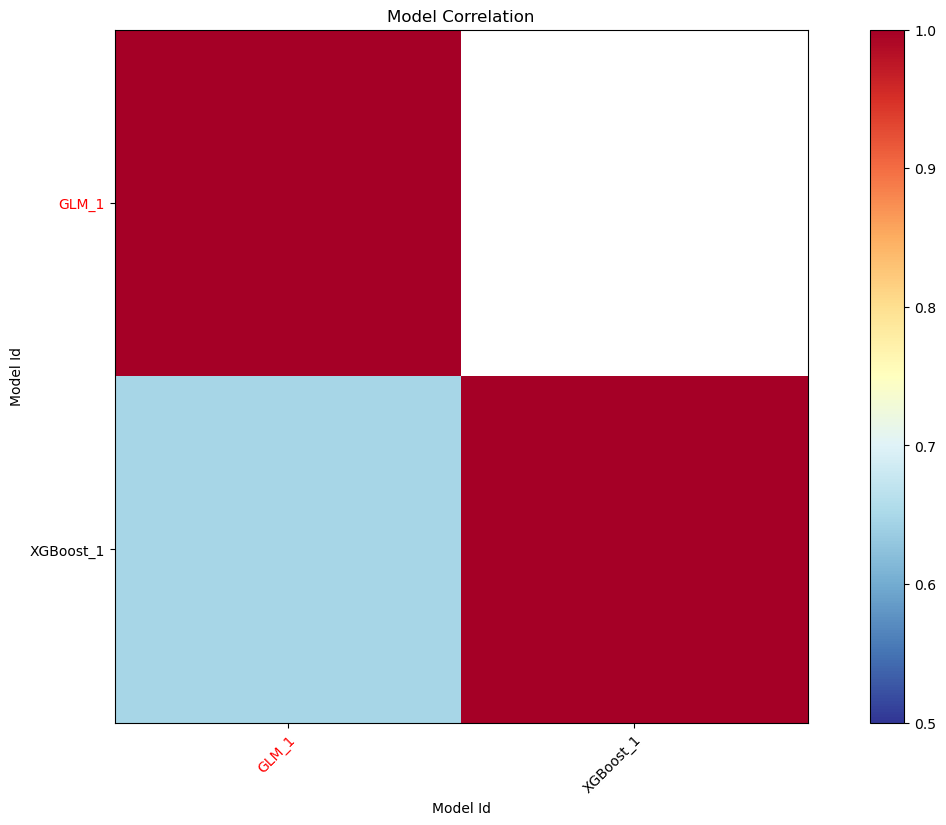

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

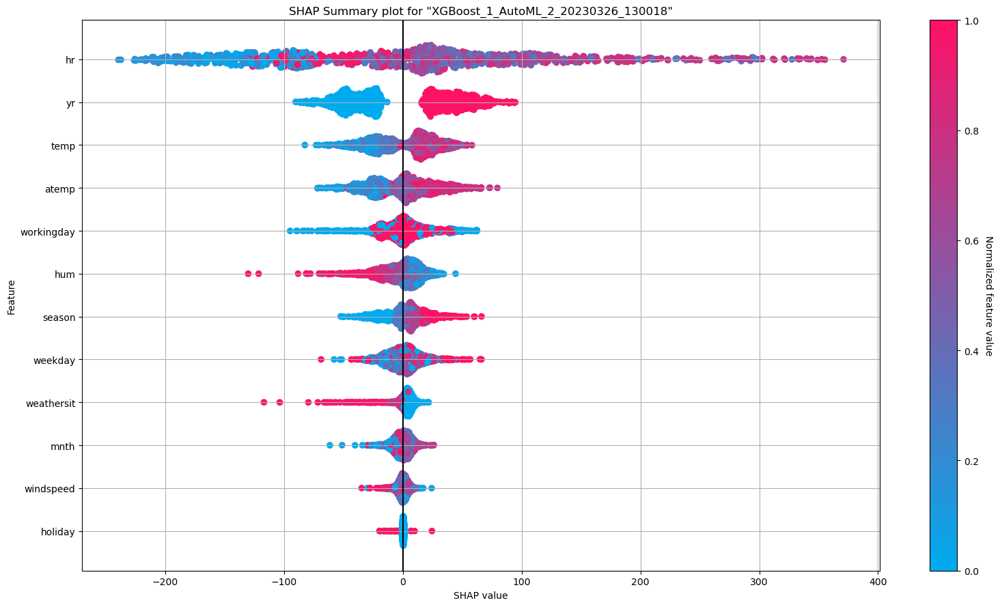

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

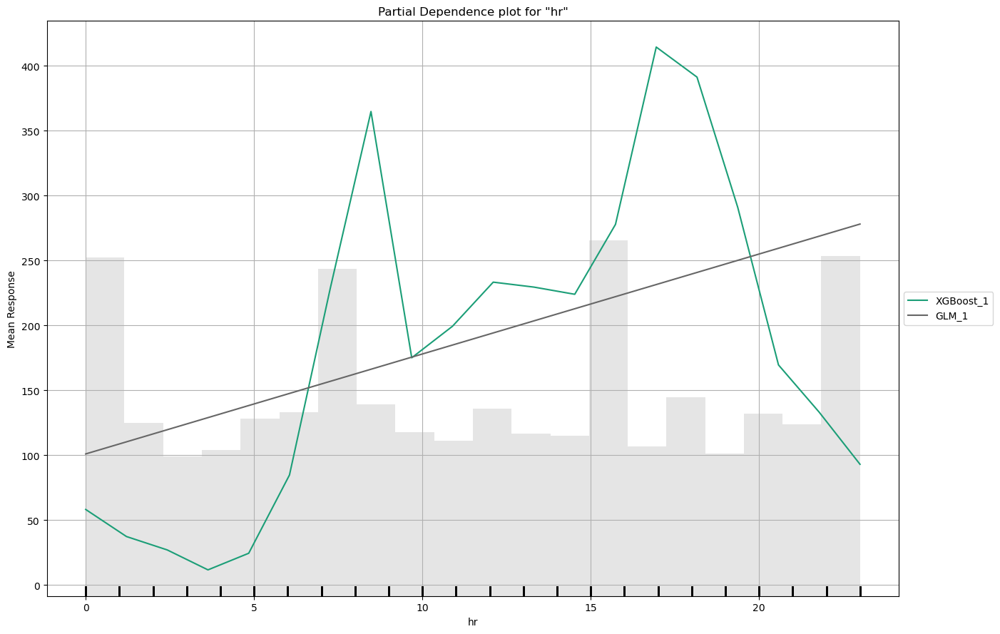

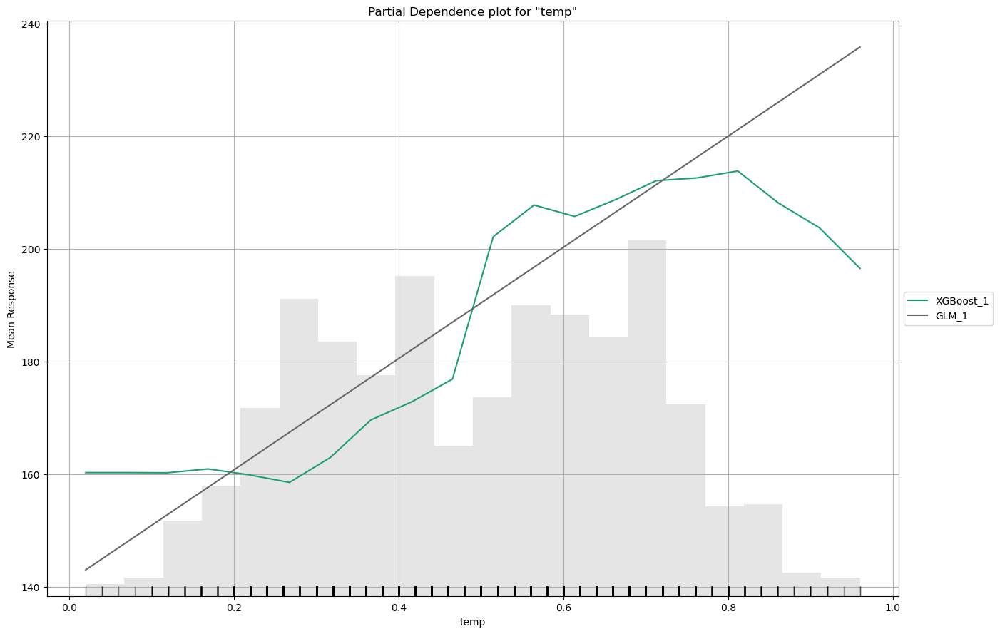

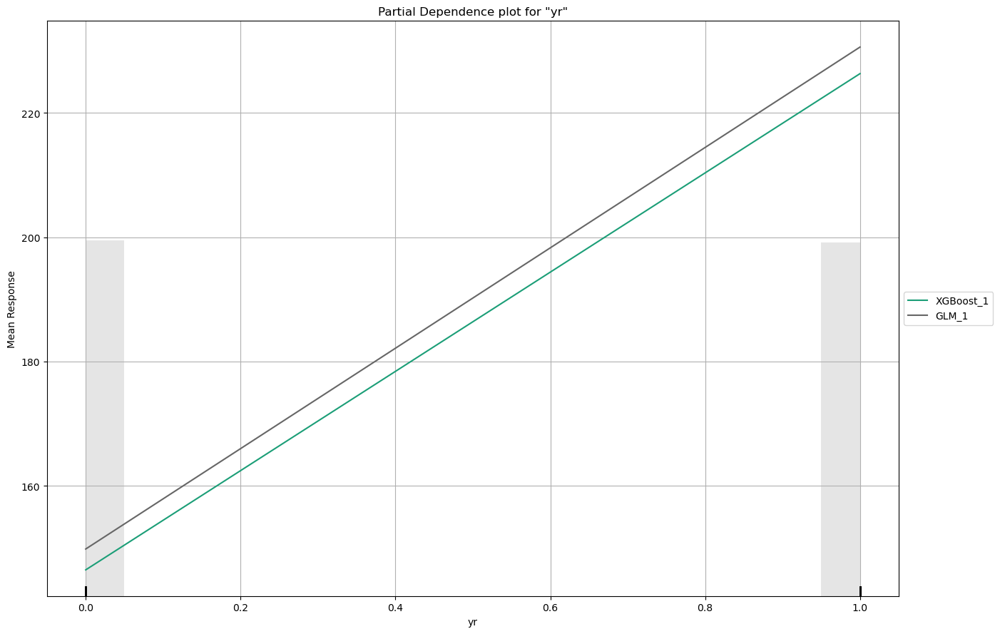

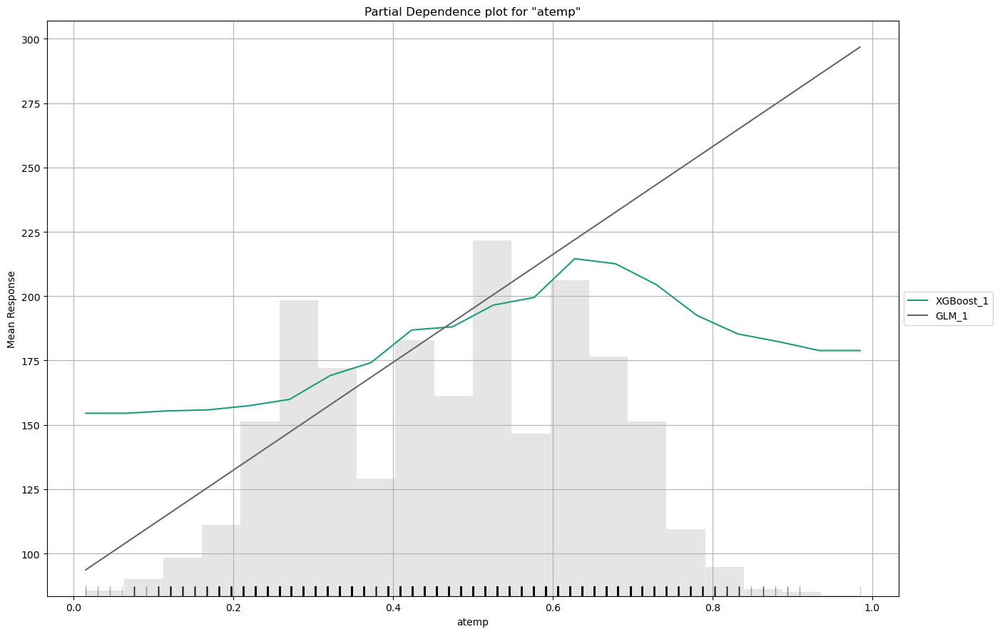

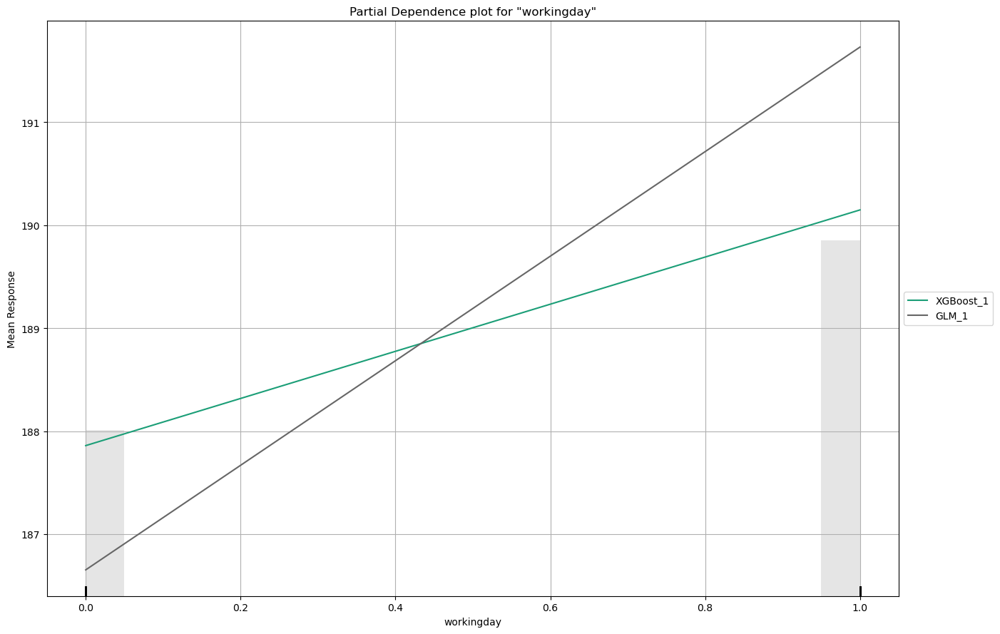

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

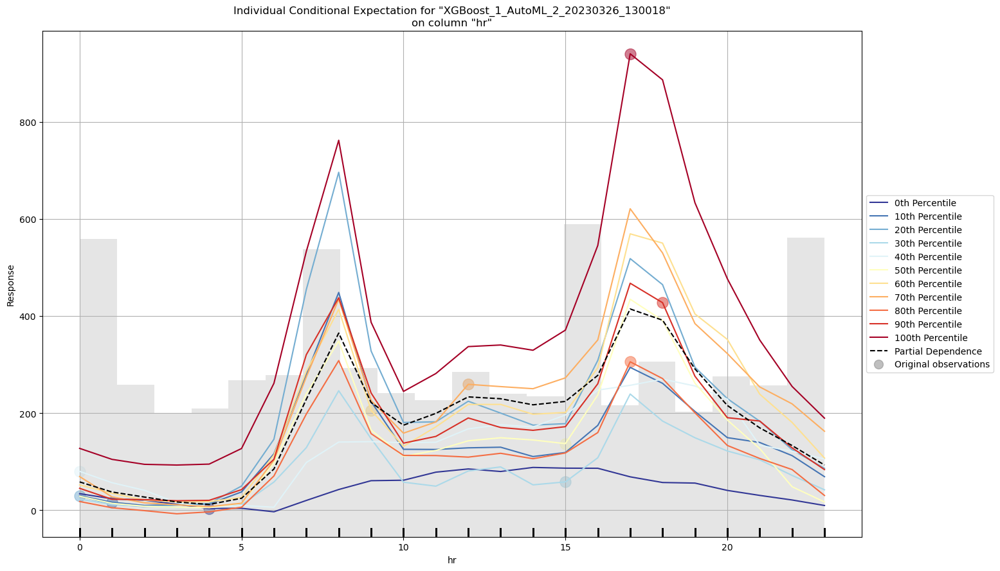

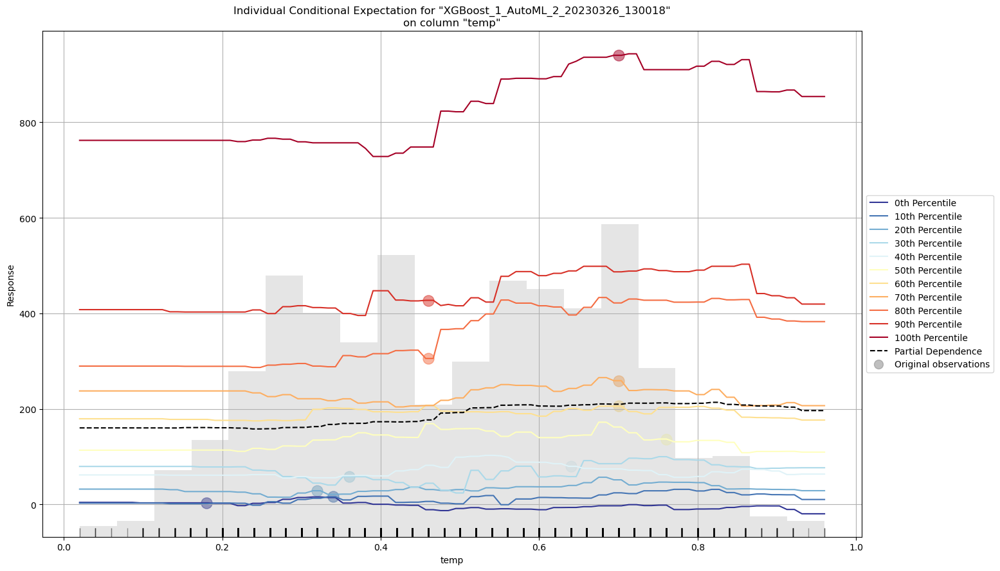

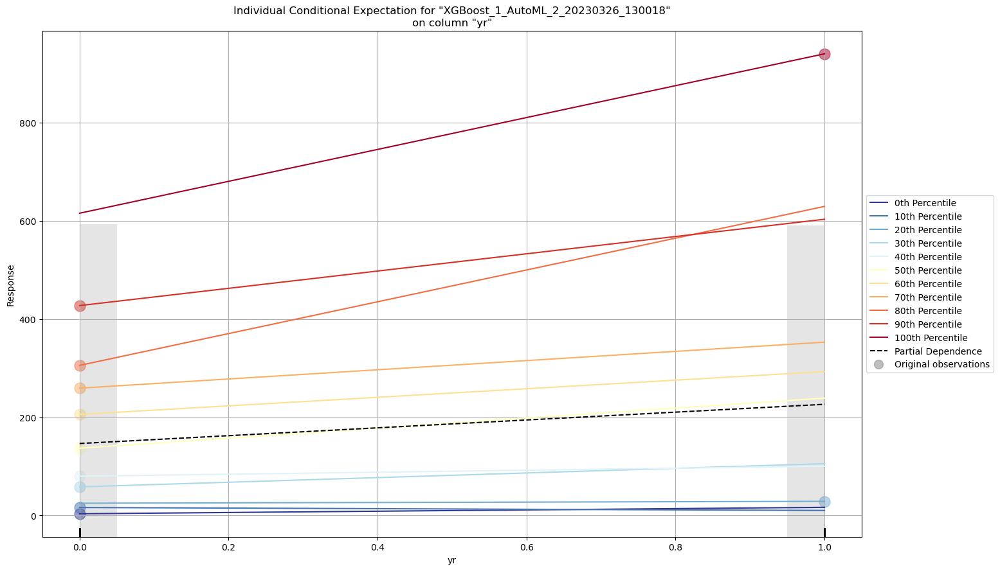

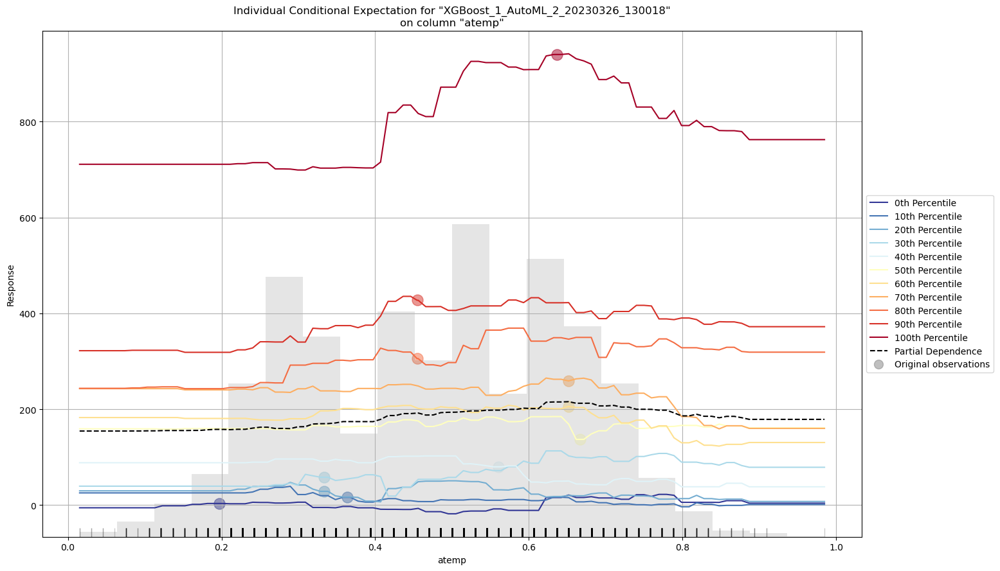

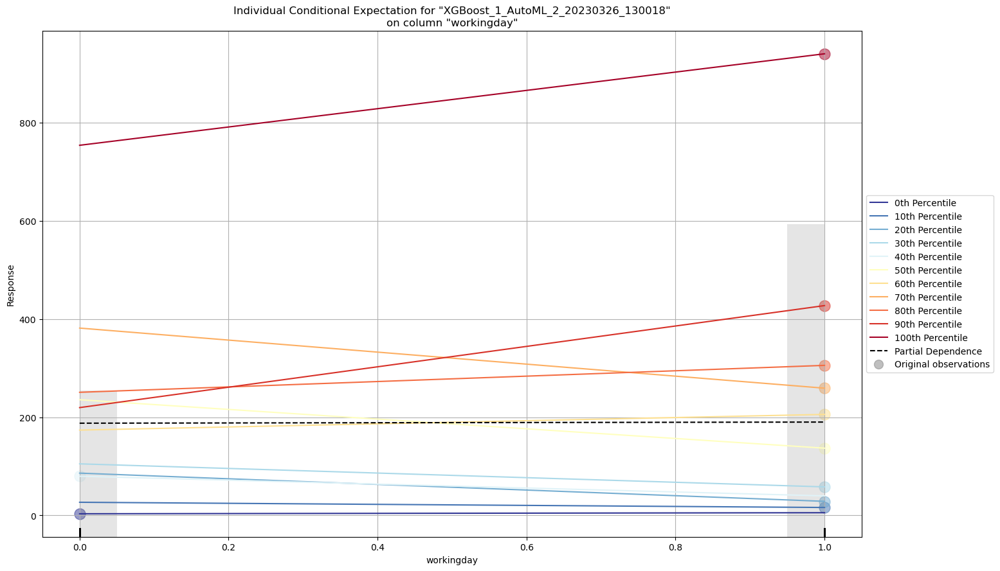

In [17]:
# Explain a generic list of models
exg_h = h2o.explain(aml_h, test_hour)

In [18]:
# DL Model
from h2o.estimators.deeplearning import H2ODeepLearningEstimator
dl = H2ODeepLearningEstimator(hidden=[50,50,50], epochs=100, distribution='poisson')
dl.train(y=y, training_frame=train_hour)

deeplearning Model Build progress: |█████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ODeepLearningEstimator : Deep Learning
Model Key: DeepLearning_model_python_1679835329793_17


Status of Neuron Layers: predicting cnt, regression, poisson distribution, Automatic loss, 5,801 weights/biases, 75.1 KB, 1,399,921 training samples, mini-batch size 1
    layer    units    type       dropout    l1    l2    mean_rate               rate_rms                momentum    mean_weight            weight_rms           mean_bias           bias_rms
--  -------  -------  ---------  ---------  ----  ----  ----------------------  ----------------------  ----------  ---------------------  -------------------  ------------------  -----------------------
    1        12       Input      0.0
    2        50       Rectifier  0.0        0.0   0.0   3.211682918996909e-05   2.073423092951998e-05   0.0         -0.013348511346557644  0.23730581998825073  0.2700163288603345  0.21764272451400757
    3        50       Rectifier  0.0        0.0   0.0   5.2258963500389655e-05  3.8402286008931696e-05  0.0         -0.059374935857632954  0.19628018140792847  1.0273487402143195  0.2847604751586914
    4        50       Rectifier  0.0        0.0   0.0   0.00030469751660566546  0.0006312676705420017   0.0         -0.10454047101259785   0.2380480170249939   0.9483637432106391  0.4366954565048218
    5        1        Linear                0.0   0.0   2.190898795333851e-05   2.390007284702733e-05   0.0         -0.053562038531526926  0.348435640335083    0.7676094228090533  1.0971281125650402e-154

ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 2658.93243970614
RMSE: 51.564837241148545
MAE: 31.447291737302095
RMSLE: 0.3613361847965974
Mean Residual Deviance: -1771.401707934343

Scoring History: 
    timestamp            duration    training_speed    epochs    iterations    samples      training_rmse    training_deviance    training_mae    training_r2
--  -------------------  ----------  ----------------  --------  ------------  -----------  ---------------  -------------------  --------------  -------------
    2023-03-26 13:05:13  0.000 sec                     0         0             0            nan              nan                  nan             nan
    2023-03-26 13:05:17  4.535 sec   23292 obs/sec     7.16936   1             100113       74.0102          -1756.13             48.1341         0.835218
    2023-03-26 13:05:23  10.631 sec  29183 obs/sec     21.499    3             300212       105.135          -1749.29             59.3888         0.667477
    2023-03-26 13:05:29  16.335 sec  31387 obs/sec     35.8109   5             500064       60.4396          -1767.15             36.6214         0.890107
    2023-03-26 13:05:36  23.352 sec  34925 obs/sec     57.2834   8             799905       63.8011          -1765.89             38.5579         0.877543
    2023-03-26 13:05:43  29.830 sec  37522 obs/sec     78.7656   11            1.09988e+06  51.5648          -1771.4              31.4473         0.92001
    2023-03-26 13:05:49  36.250 sec  39236 obs/sec     100.252   14            1.39992e+06  49.5339          -1771.23             30.8054         0.926187
    2023-03-26 13:05:49  36.317 sec  39228 obs/sec     100.252   14            1.39992e+06  51.5648          -1771.4              31.4473         0.92001

Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
hr          1                      1                    0.221961
workingday  0.519242               0.519242             0.115251
mnth        0.368479               0.368479             0.0817879
season      0.359066               0.359066             0.0796987
yr          0.346674               0.346674             0.076948
weekday     0.329457               0.329457             0.0731264
atemp       0.320339               0.320339             0.0711027
temp        0.304499               0.304499             0.0675869
holiday    

### Model Explainability
#### Using various plots to understand how the different features in the dataset affect the target variable.
#### 1. For Day dataset

Partial Dependence Plot:

The Partial Dependence Plot (PDP) shows the relationship between the target variable and a particular feature while holding all other features constant. It helps to understand the impact of a single feature on the target variable


PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |█████████████████

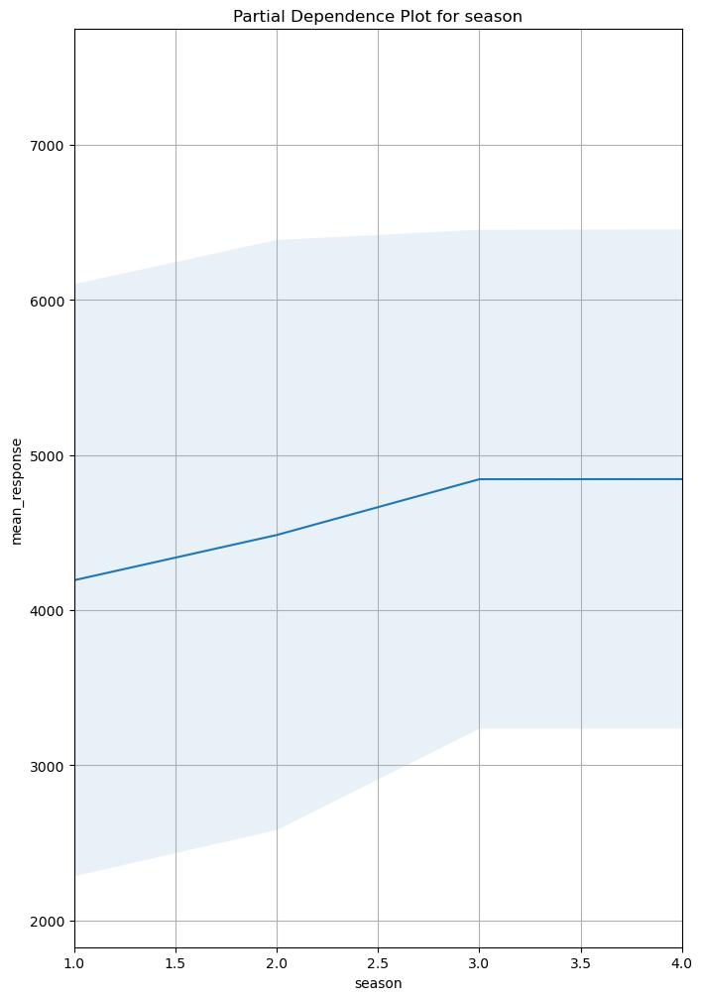

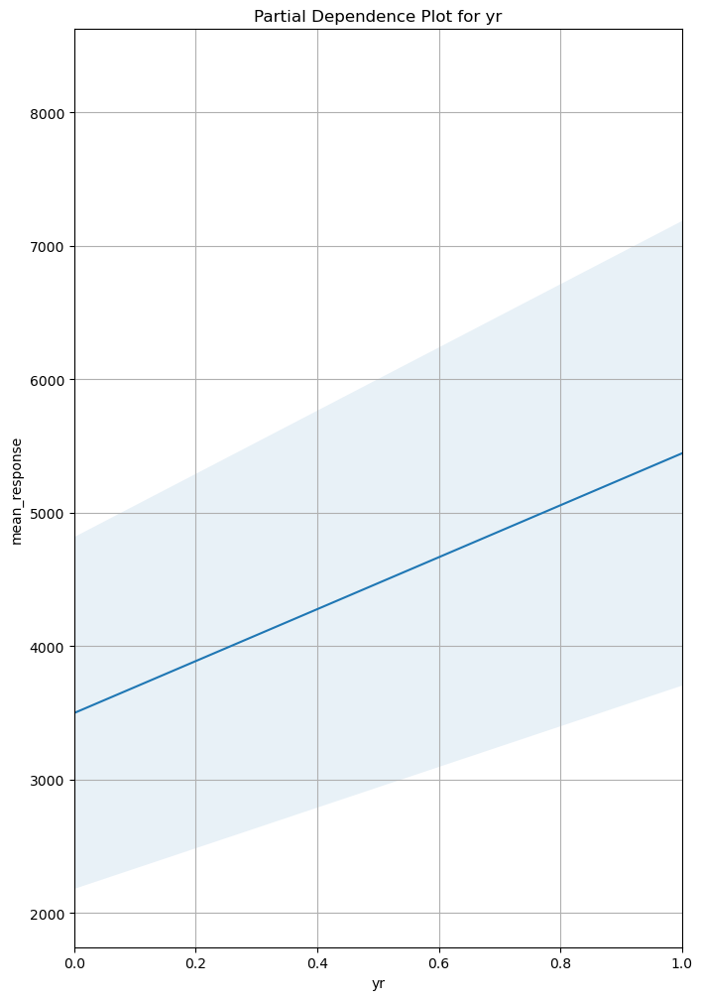

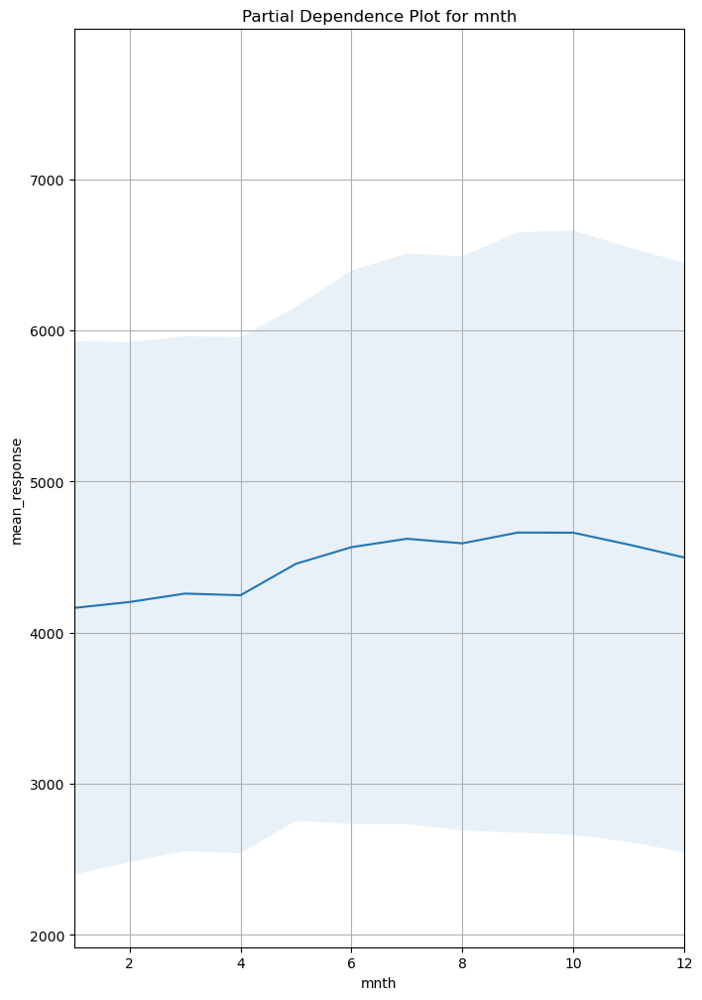

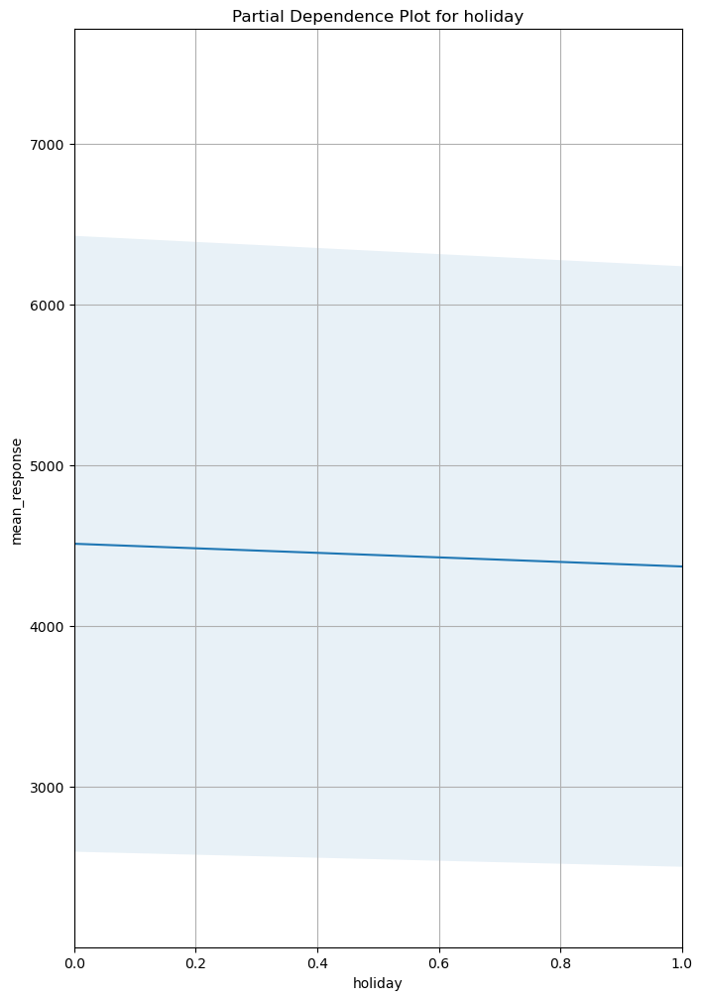

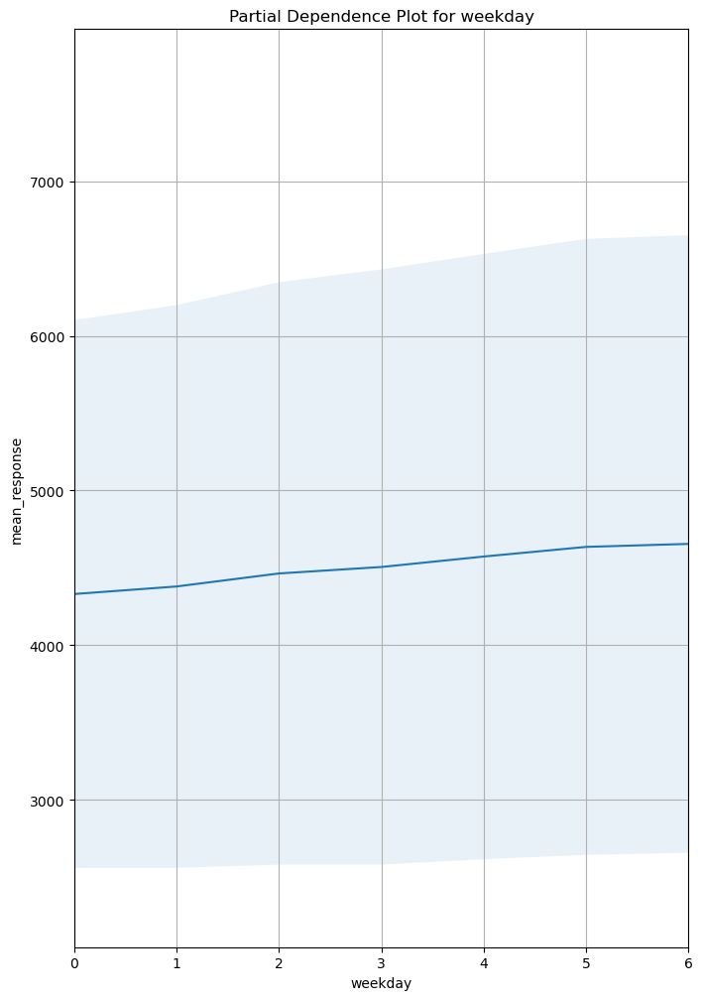

...

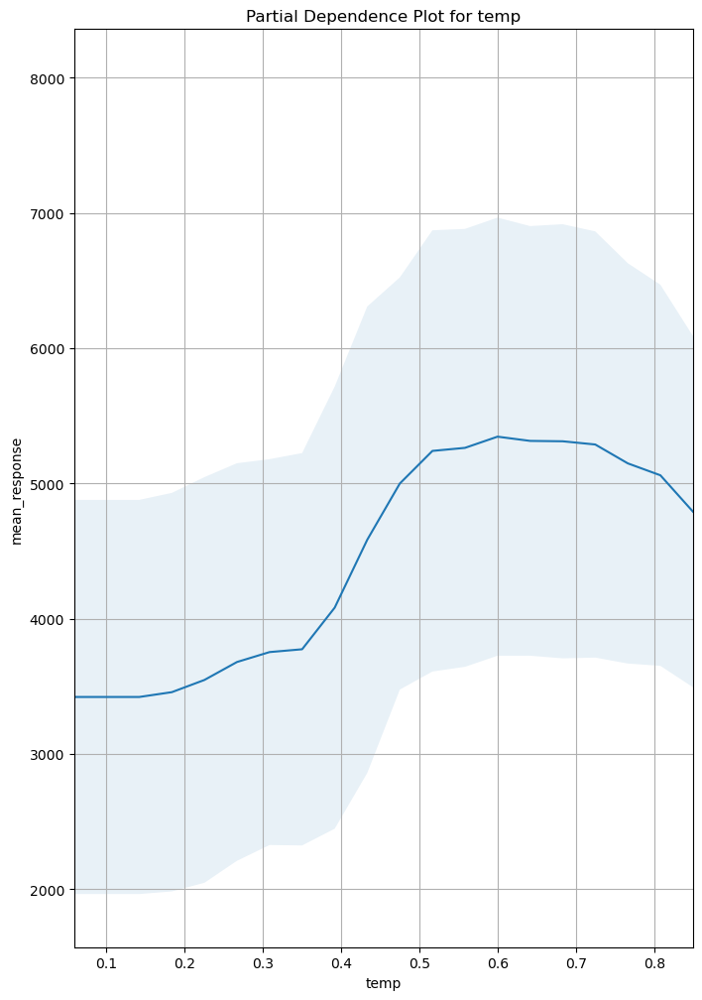

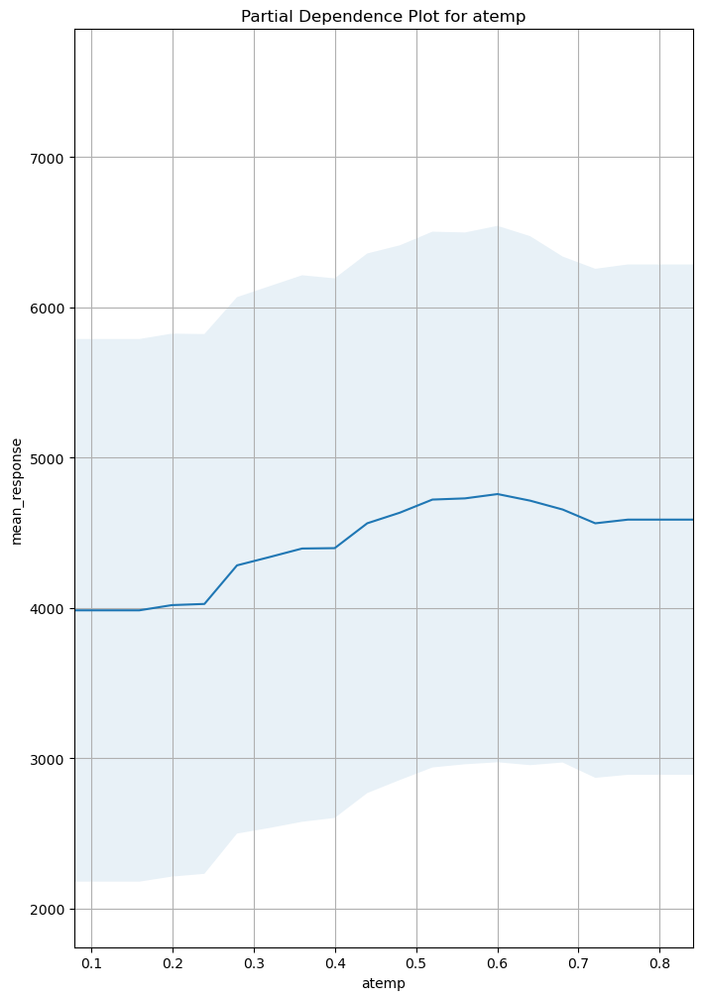

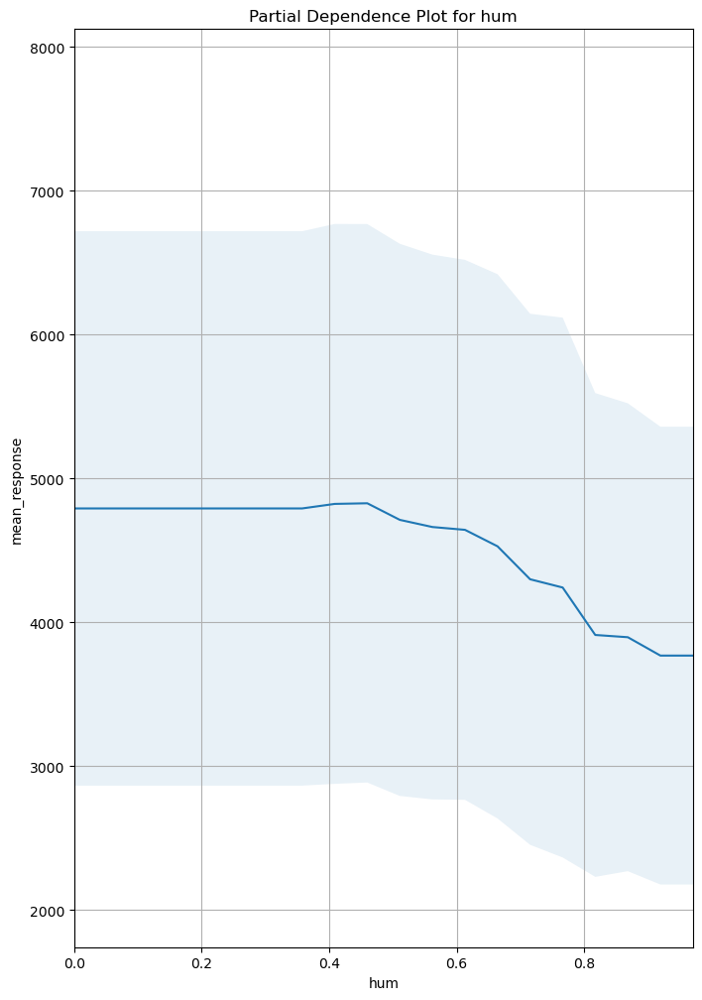

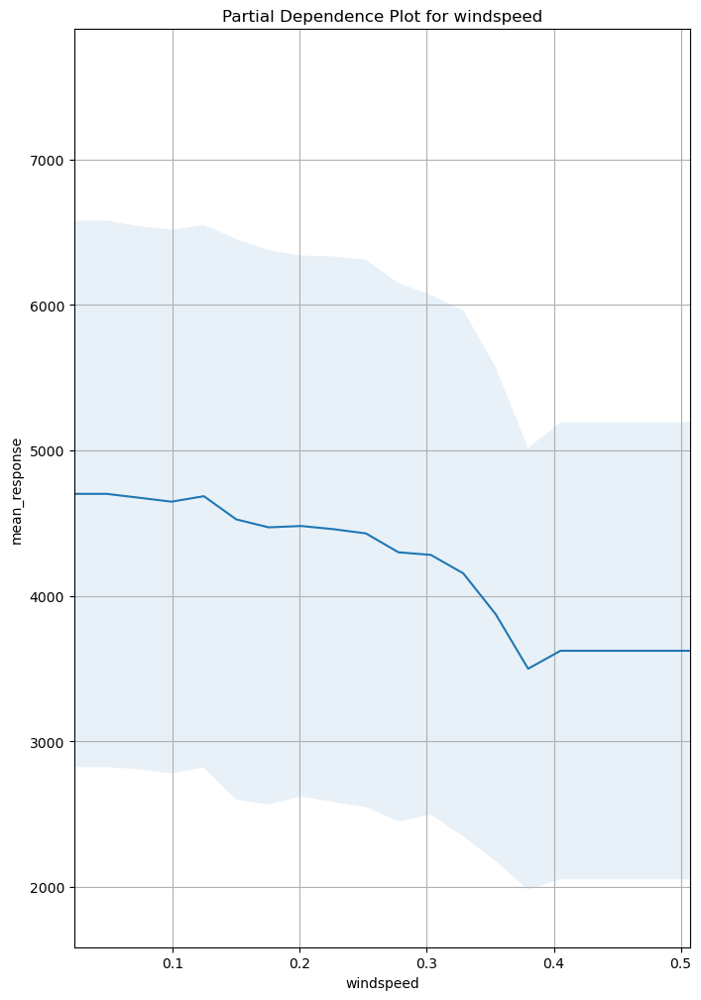

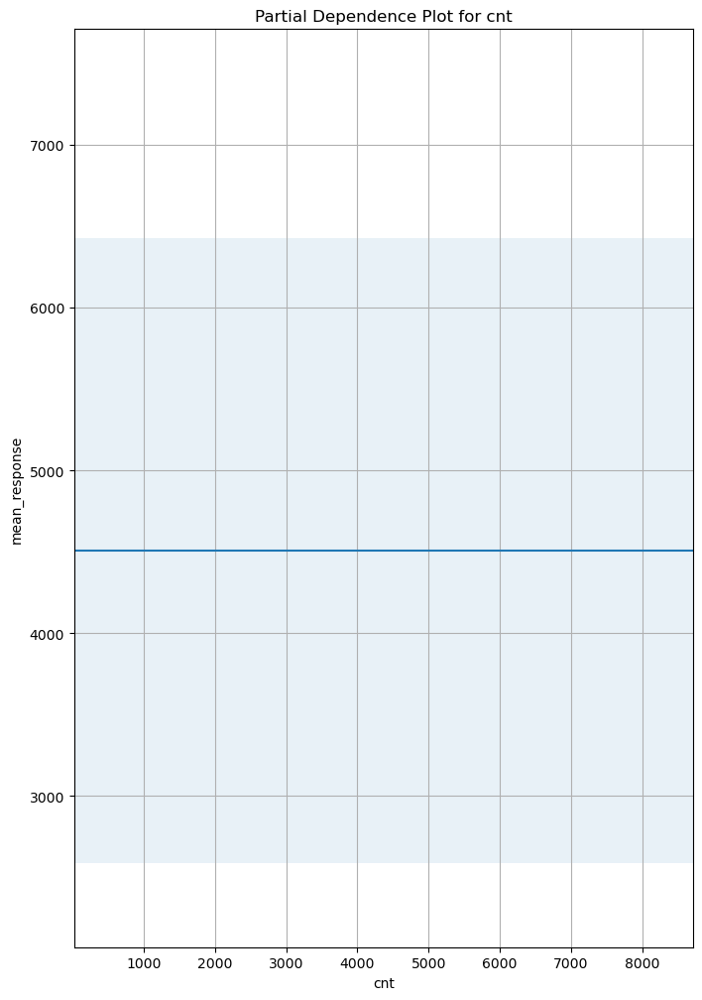

In [19]:
for col in train_day.columns:
    gbm.partial_plot(data=train_day, cols=[col], plot=True, plot_stddev=True)

Variable Importance Plot:

The Variable Importance Plot (VIP) shows the importance of each feature in the model. It helps to understand which features are most important in predicting the target variable.

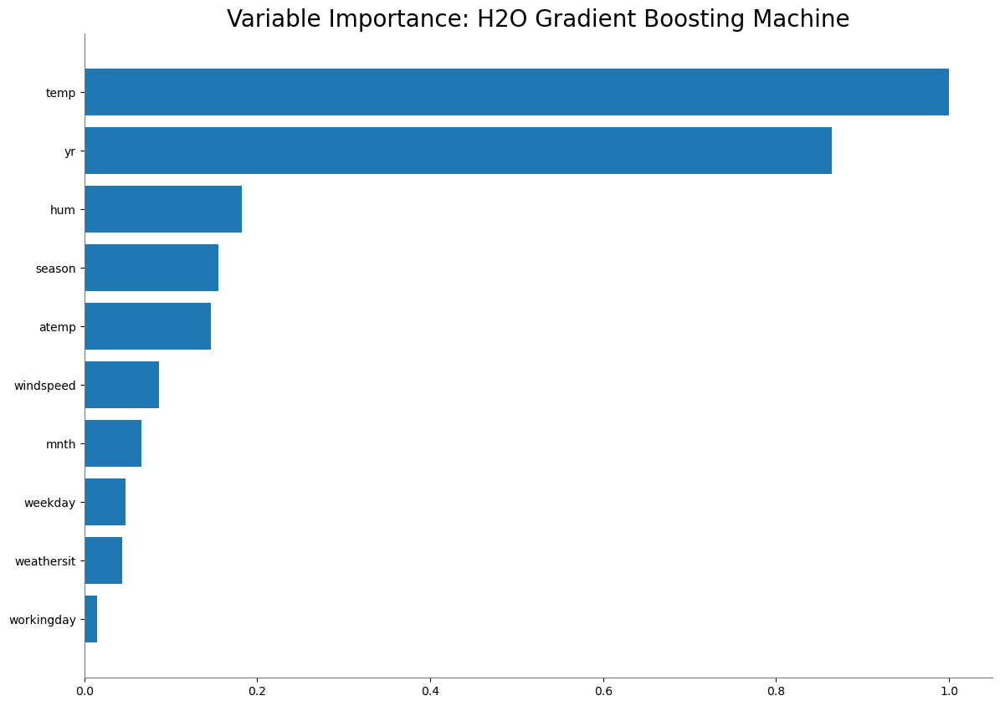

<Figure size 640x480 with 0 Axes>

In [20]:
gbm.varimp_plot()

SHAP Summary Plot:

The SHAP Summary Plot shows the contribution of each feature to the model's output. It helps to understand the positive and negative impacts of a feature on the target variable.

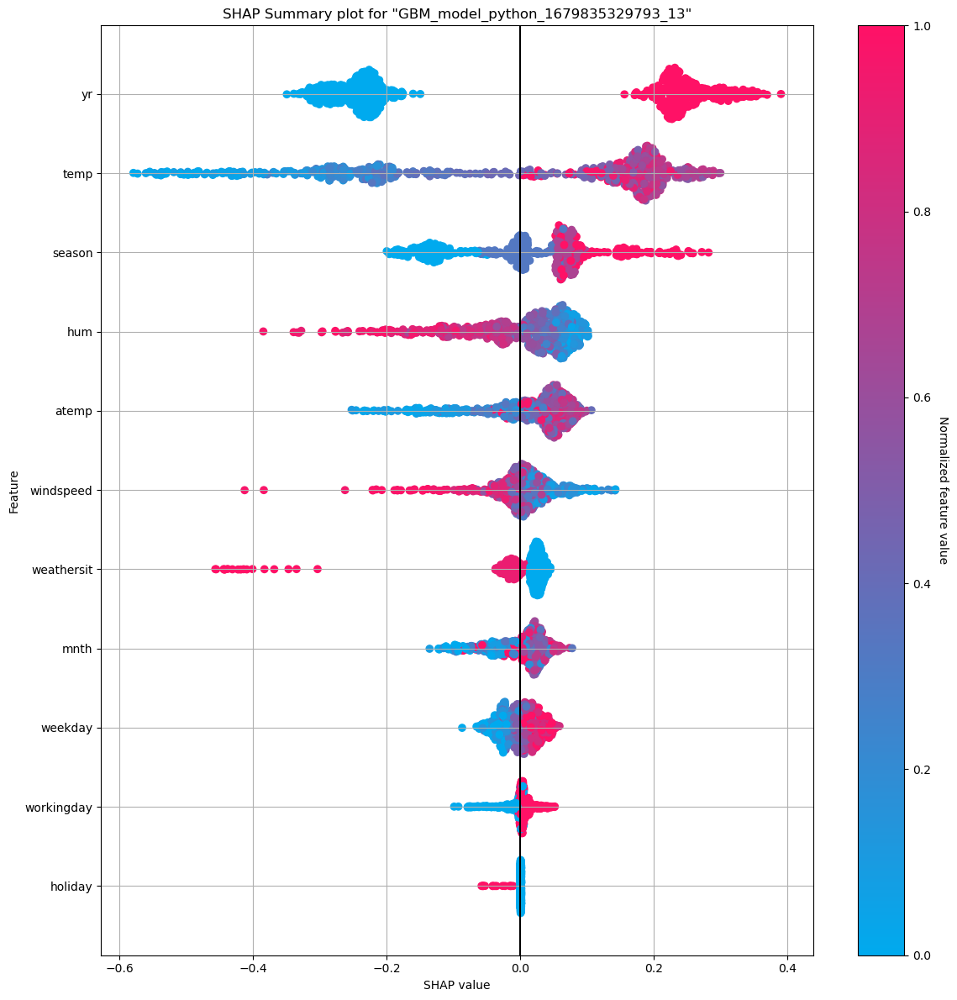

In [21]:
gbm.shap_summary_plot(train_day)

#### 2. For Hour dataset

PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |████████████████████████████████████████████████| (done) 100%
PartialDependencePlot progress: |█████████████████

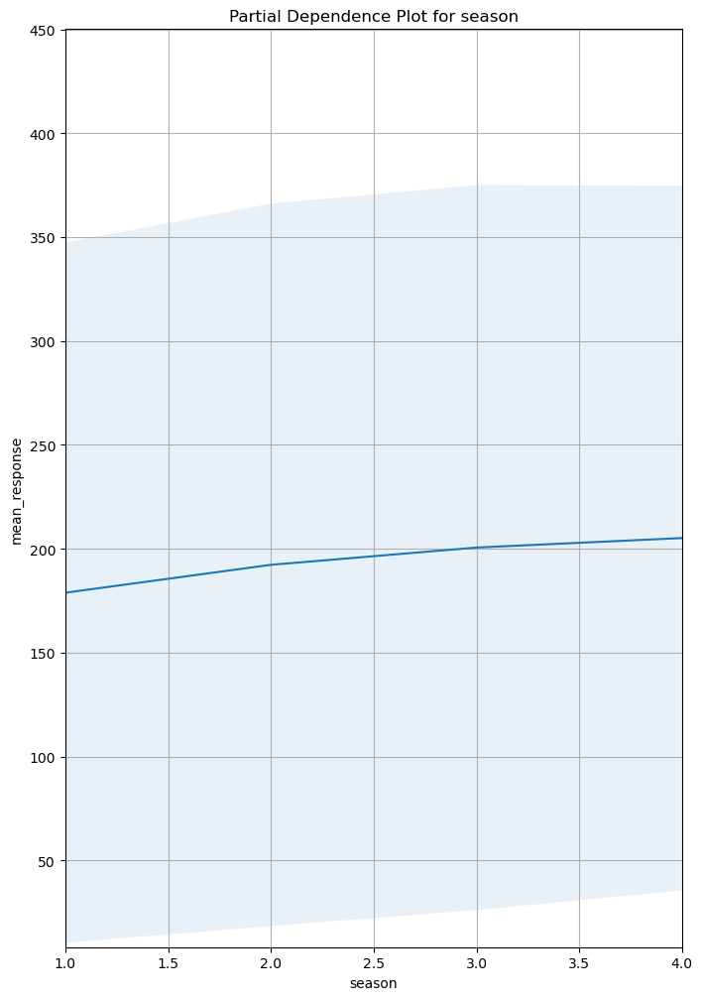

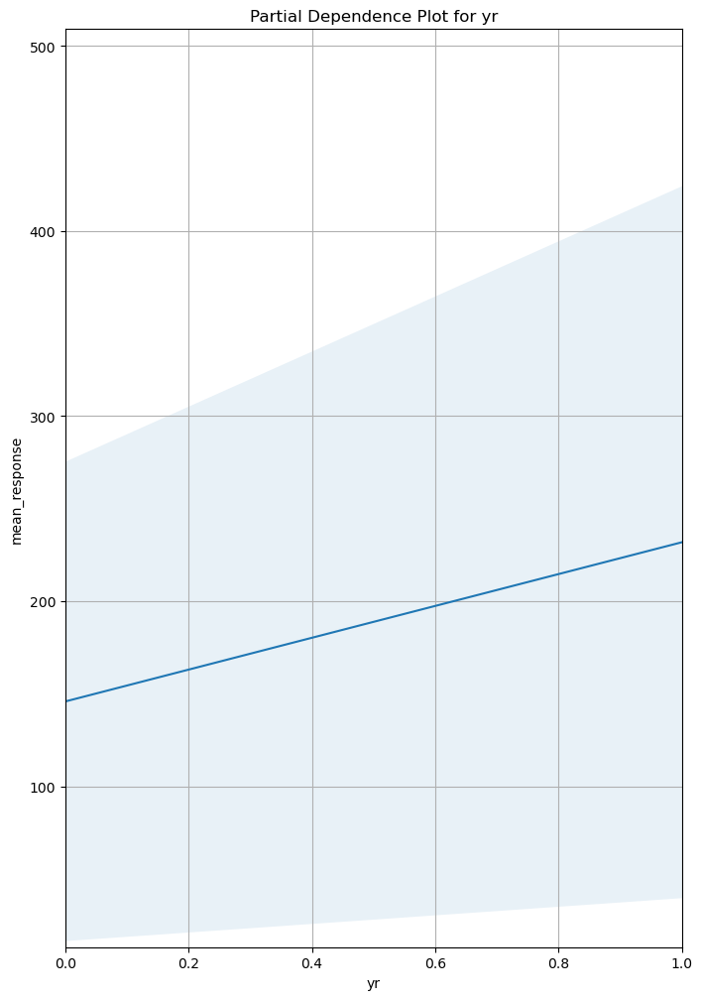

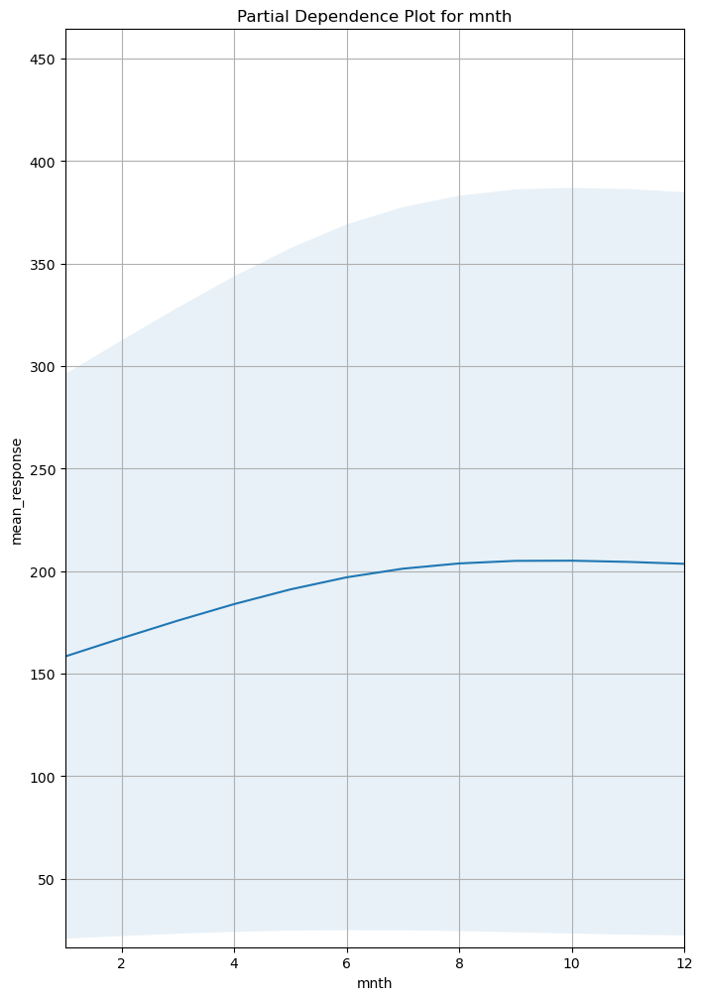

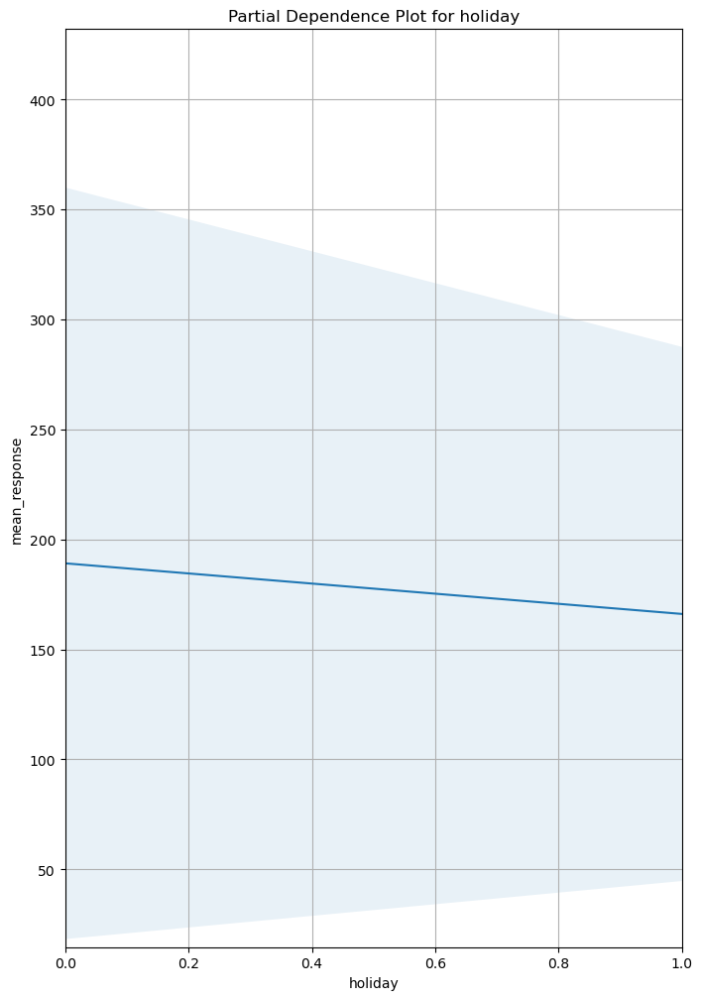

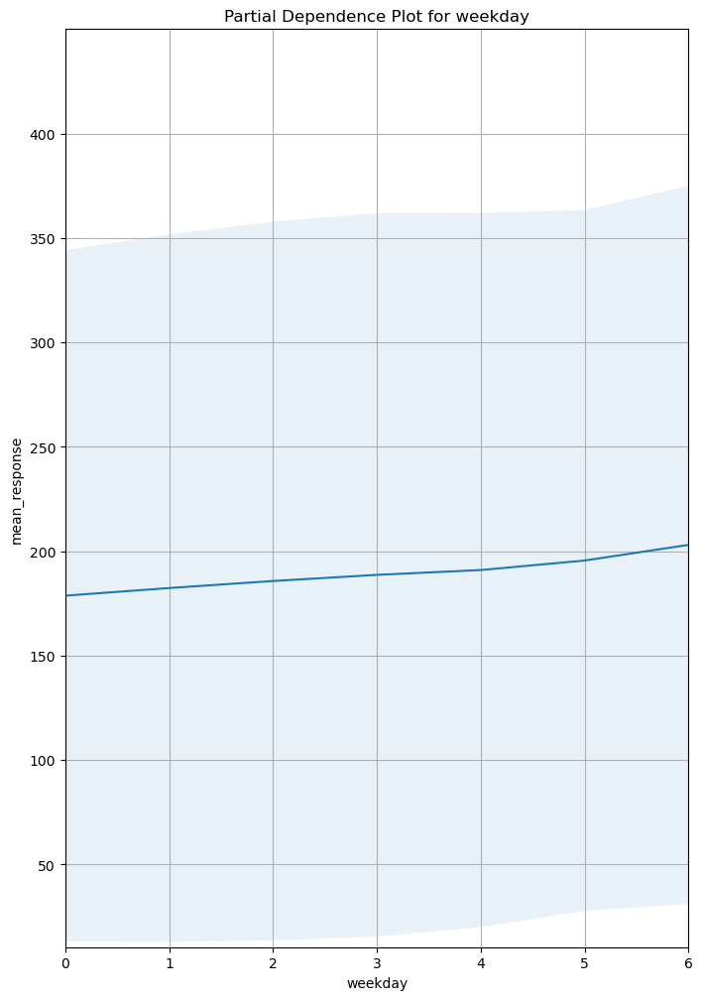

...

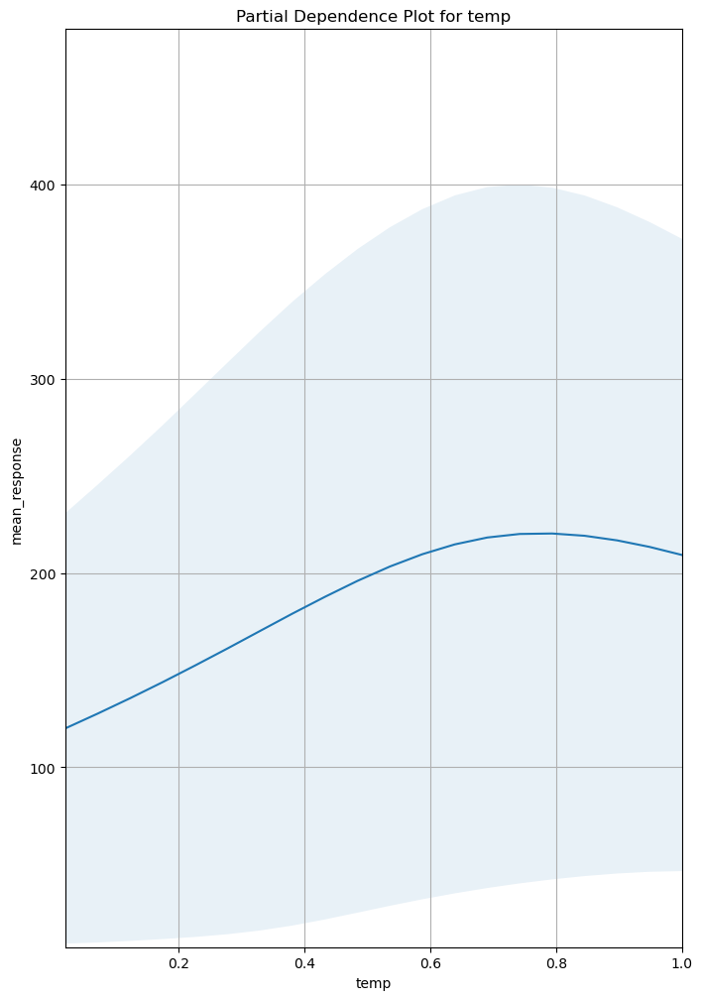

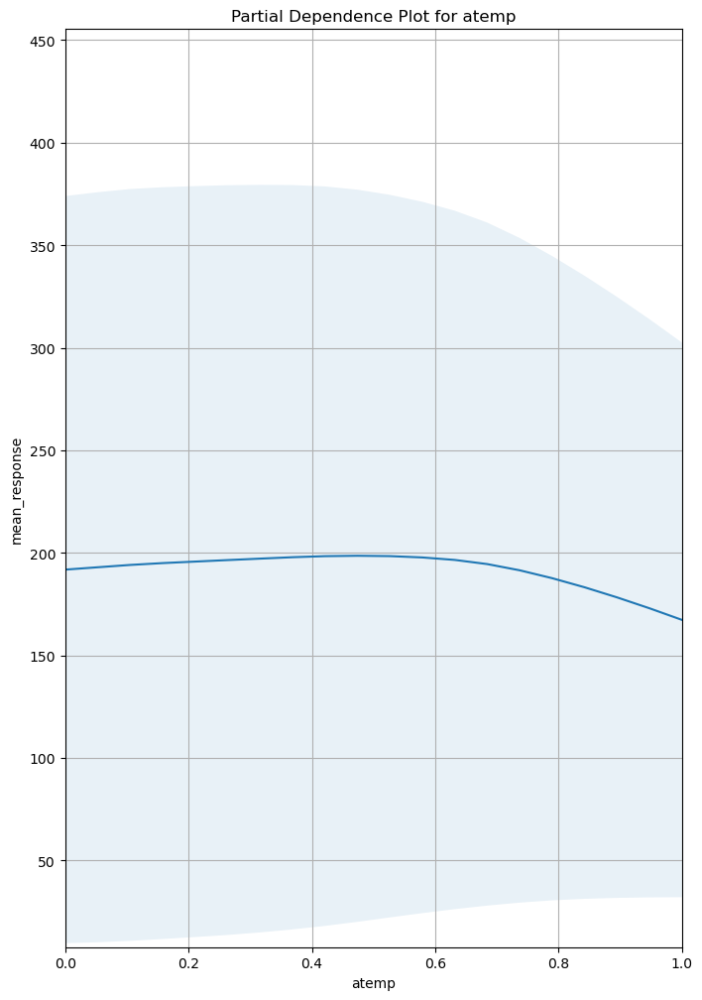

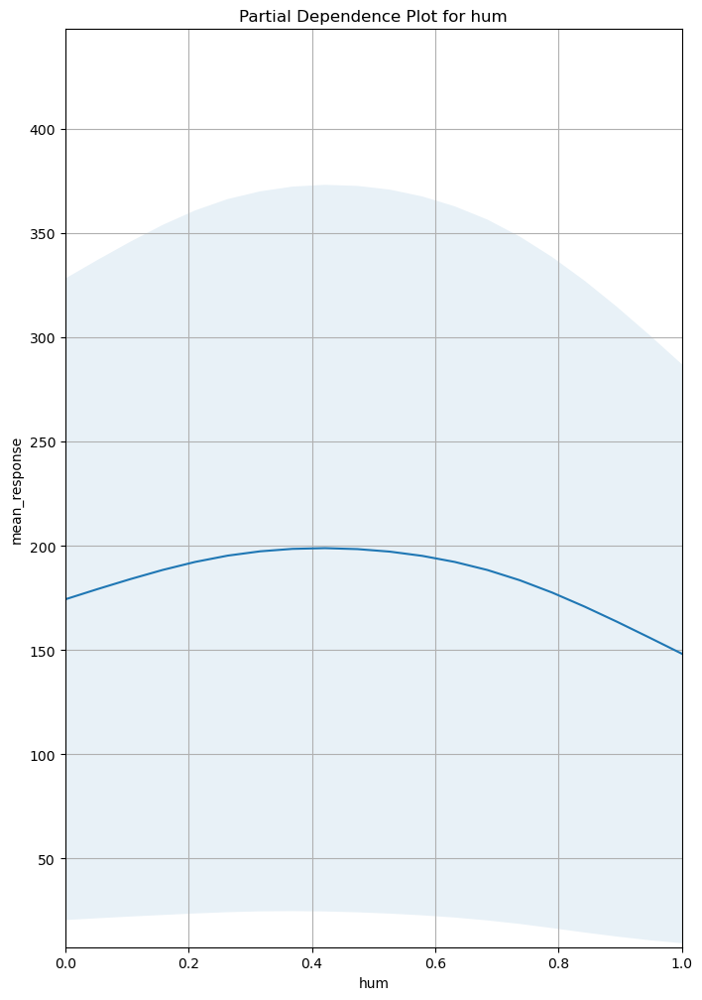

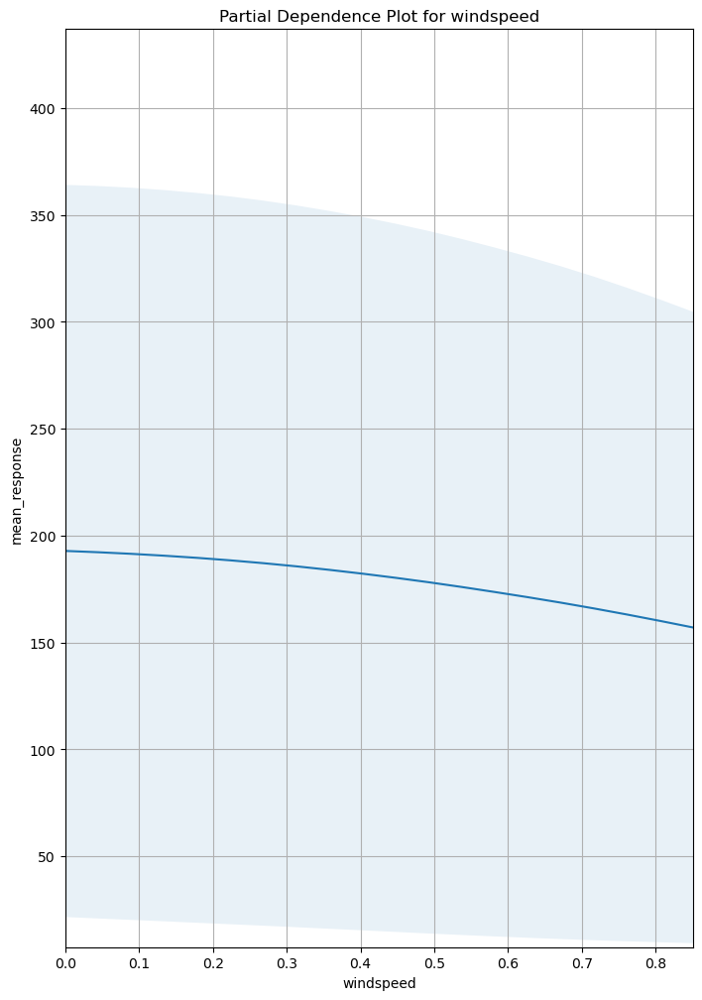

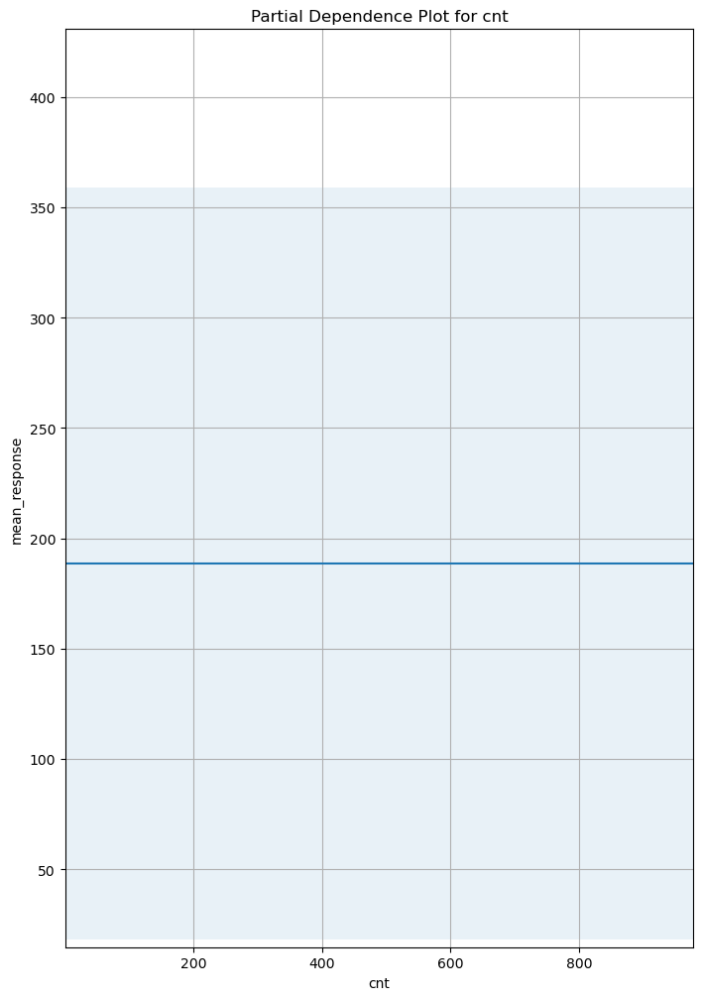

In [22]:
for col in train_day.columns:
    dl.partial_plot(data=train_hour, cols=[col], plot=True, plot_stddev=True)

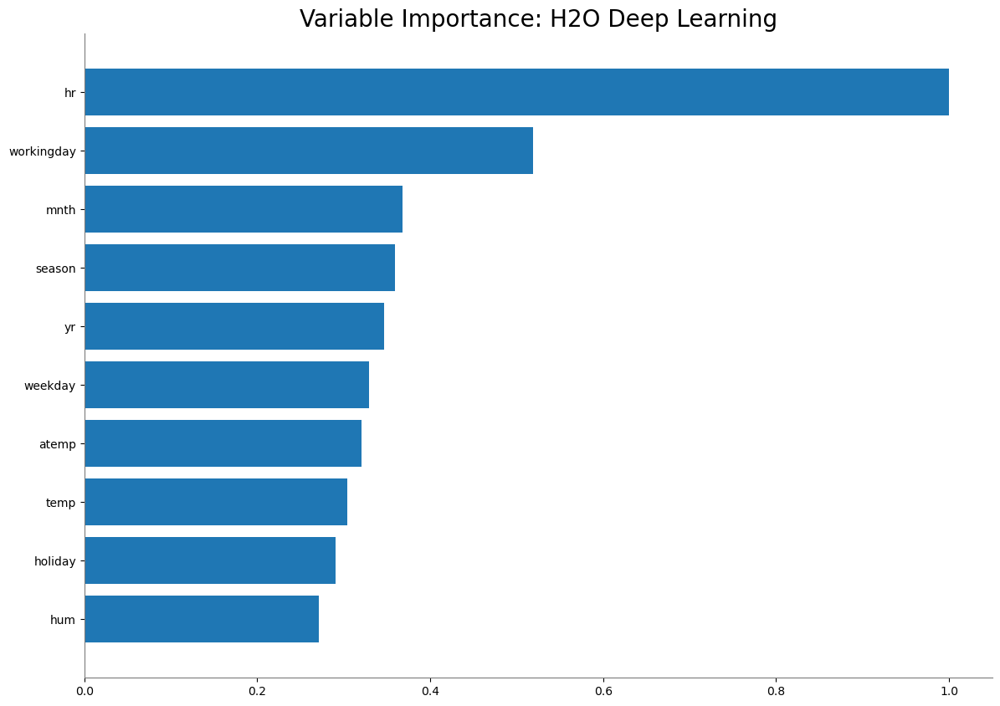

<Figure size 640x480 with 0 Axes>

In [23]:
dl.varimp_plot()

### Model Performance

In [24]:
# AutoML on Day Data
auto_day_mae = aml_d.leader.model_performance(test_day).mae()
auto_day_rmse = aml_d.leader.model_performance(test_day).rmse()
auto_day_r2 = aml_d.leader.model_performance(test_day).r2()

# GBM on Day Data
gbm_day_mae = gbm.model_performance(test_day).mae()
gbm_day_rmse = gbm.model_performance(test_day).rmse()
gbm_day_r2 = gbm.model_performance(test_day).r2()

# AutoML on Hourly Data
auto_hourly_mae = aml_h.leader.model_performance(test_hour).mae()
auto_hourly_rmse = aml_h.leader.model_performance(test_hour).rmse()
auto_hourly_r2 = aml_h.leader.model_performance(test_hour).r2()

# DL on Hourly Data
dl_hourly_mae = dl.model_performance(test_hour).mae()
dl_hourly_rmse = dl.model_performance(test_hour).rmse()
dl_hourly_r2 = dl.model_performance(test_hour).r2()

# Print model performance metrics with headings
print("Model Performance Metrics:\n")
print("Day Data\n")
print(f"AutoML MAE: {auto_day_mae:.3f}")
print(f"AutoML RMSE: {auto_day_rmse:.3f}")
print(f"AutoML R2: {auto_day_r2:.3f}\n")
print(f"GBM MAE: {gbm_day_mae:.3f}")
print(f"GBM RMSE: {gbm_day_rmse:.3f}")
print(f"GBM R2: {gbm_day_r2:.3f}\n")

print("Hourly Data\n")
print(f"AutoML MAE: {auto_hourly_mae:.3f}")
print(f"AutoML RMSE: {auto_hourly_rmse:.3f}")
print(f"AutoML R2: {auto_hourly_r2:.3f}\n")
print(f"DL MAE: {dl_hourly_mae:.3f}")
print(f"DL RMSE: {dl_hourly_rmse:.3f}")
print(f"DL R2: {dl_hourly_r2:.3f}")

Model Performance Metrics:

Day Data

AutoML MAE: 472.633
AutoML RMSE: 706.216
AutoML R2: 0.859

GBM MAE: 519.453
GBM RMSE: 729.916
GBM R2: 0.849

Hourly Data

AutoML MAE: 27.366
AutoML RMSE: 42.872
AutoML R2: 0.941

DL MAE: 33.267
DL RMSE: 54.552
DL R2: 0.904


### Findings

Based on the analysis, the conclusion is as follows:

<ul>
<li>The Partial Dependence Plot (PDP) shows that the temperature has a positive impact on the number of bikes rented. As the temperature increases, the number of bikes rented also increases.</li>

<li>The Variable Importance Plot (VIP) shows that temperature and humidity are the two most important features in predicting the number of bikes rented.</li>

<li>The SHAP Summary Plot shows that temperature has a significant positive impact on the number of bikes rented, while humidity has a negative impact.</li>

<li>Based on the model performance metrics provided, the AutoML model performed better than the GBM model on the day data, as it achieved a lower MAE and RMSE, and a higher R2 score.</li> 

<li>Similarly, the AutoML model outperformed the DL model on the hourly data with a lower MAE and RMSE, and a higher R2 score.</li>
</ul>